<a href="https://colab.research.google.com/github/AnkitNigam1985/Data-Science-Projects/blob/master/Term_5_Project_Ghoul_Prediction_Using_Classification_Models_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Ghoul Prediction Using Classification Models**

##**Problem Statement**

Dataset - https://raw.githubusercontent.com/insaid2018/Term-4/master/Projects/Ghouls_train.csv

The given dataset contains details about various types of creatures - **ghouls,ghosts and goblins** and objective is to study the features and predict wether the given record in the dataset belong to which type out of the mentioned above.

**Input Features Details**

- **id** : id of the creature
- **bone_length** : average length of bone in the creature, normalized between 0 and 1
- **rotting_flesh** : percentage of rotting flesh in the creature
- **hair_length** : average hair length, normalized between 0 and 1
- **has_soul** : percentage of soul in the creature
- **color** : dominant color of the creature: 'white','black','clear','blue','green','blood'

**Output target to predict**

- **type** : 'Ghost', 'Goblin', and 'Ghoul'

Need to use various Classification models, along with ensemble techniques if individual models are not performing fine or suspected for overfitting/underfitting

##**Table of Contents**

1. Importing required libraries

2. Reading data

3. Statistical Analysis of data

4. Exploratory Data Analysis with Pandas Profiling and AutoViz

  4.1. Analysis using Pandas Profiling

  4.2. Analysis using AutoViz
5. Exploratory Data Analysis

  5.1. Checking Distribution of Dataset

  5.2. Checking Relationship in Dataset

  5.3. Checking Outliers in Dataset using Isolation Forest

  5.4. Checking Outliers in Dataset using PYOD library

6. Initial Analysis of data using PYCARET

  6.1. Wihtout Feature Selection

  6.2. With Feature Selection

  6.3. Without Feature Selection and Normalization

  6.4. With Feature Selection and Normalization

  6.5. With Feature Selection and Normalization and PCA

  6.6. With Feature Selection and create clusters

  6.7. Without Feature Selection and create clusters

7. Data Pre-Processing

  7.1. Label encoding for categorical columns

  7.2. Removing outliers

  7.3. LDA Transformation

8. Prepare and process various Machine Learning Models Baseline
  
  8.1. Baseline Models

  8.2. Applying Ensemble technique on the shortlisted baseline models

      8.2.1 Voting Classifier

      8.2.2 Bagging

      8.2.3 Voting including Bagging Classifiers

      8.2.4 Stacking

  8.3. Conclusion on baseline models performace along with Ensemble techniques

9. Prepare and process various Machine Learning Models - Hyper-parameter tuning

10. Conclusion - Final Model


## **1. Importing required libraries**

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn import preprocessing
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier



from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score, StratifiedKFold

from sklearn import metrics

from sklearn.externals import joblib

In [ ]:
!pip install catboost

In [ ]:
from catboost import CatBoostClassifier

In [ ]:
!pip install plotly

In [ ]:
import plotly
from plotly import tools
import plotly.express as px
import plotly.offline as pyo
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objects as go
pyo.init_notebook_mode()

In [ ]:
!pip install pyod

In [ ]:
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.



In [ ]:
!pip install autoviz

In [ ]:
!pip install xgboost

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV=AutoViz_Class()

Imported AutoViz_Class version: 0.0.68. Call using: 
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
To remove previous versions, perform 'pip uninstall autoviz'


In [ ]:
!pip install pycaret

In [ ]:
from pycaret.classification import *

In [ ]:
!pip install pandas-profiling==2.5.0

In [ ]:
from pandas_profiling import ProfileReport

## **2. Reading data**

In [ ]:
ghoul_train=pd.read_csv("https://raw.githubusercontent.com/insaid2018/Term-4/master/Projects/Ghouls_train.csv")
ghoul_train.head()

,id,bone_length,rotting_flesh,hair_length,has_soul,color,type
0,0,0.354512,0.350839,0.465761,0.781142,clear,Ghoul
1,1,0.575560,0.425868,0.531401,0.439899,green,Goblin
2,2,0.467875,0.354330,0.811616,0.791225,black,Ghoul
3,4,0.776652,0.508723,0.636766,0.884464,black,Ghoul
4,5,0.566117,0.875862,0.418594,0.636438,green,Ghost


In [ ]:
ghoul_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             371 non-null    int64  
 1   bone_length    371 non-null    float64
 2   rotting_flesh  371 non-null    float64
 3   hair_length    371 non-null    float64
 4   has_soul       371 non-null    float64
 5   color          371 non-null    object 
 6   type           371 non-null    object 
dtypes: float64(4), int64(1), object(2)
memory usage: 20.4+ KB


Data has following input features

- id
- bone_length
- rotting_flesh
- hair_length
- has_soul
- color

and output target in train data

 - type
 
 
Where all columns are float/int but color and type are of obejct type, which need to be encoded later using Label Encoder

## **3. Statistical Analysis of data**

id field can be removed during data preprocessing and modelling

In [ ]:
ghoul_train_org=ghoul_train.copy()
ghoul_train=ghoul_train.drop('id', axis=1)

In [ ]:
ghoul_train.head()

,bone_length,rotting_flesh,hair_length,has_soul,color,type
0,0.354512,0.350839,0.465761,0.781142,clear,Ghoul
1,0.575560,0.425868,0.531401,0.439899,green,Goblin
2,0.467875,0.354330,0.811616,0.791225,black,Ghoul
3,0.776652,0.508723,0.636766,0.884464,black,Ghoul
4,0.566117,0.875862,0.418594,0.636438,green,Ghost


In [ ]:
ghoul_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bone_length    371 non-null    float64
 1   rotting_flesh  371 non-null    float64
 2   hair_length    371 non-null    float64
 3   has_soul       371 non-null    float64
 4   color          371 non-null    object 
 5   type           371 non-null    object 
dtypes: float64(4), object(2)
memory usage: 17.5+ KB


In [ ]:
ghoul_train.isnull().sum()

bone_length      0
rotting_flesh    0
hair_length      0
has_soul         0
color            0
type             0
dtype: int64

No missing values in dataset

In [ ]:
ghoul_train.describe().T

,count,mean,std,min,25%,50%,75%,max
bone_length,371.0,0.434160,0.132833,0.061032,0.340006,0.434891,0.517223,0.817001
rotting_flesh,371.0,0.506848,0.146358,0.095687,0.414812,0.501552,0.603977,0.932466
hair_length,371.0,0.529114,0.169902,0.134600,0.407428,0.538642,0.647244,1.000000
has_soul,371.0,0.471392,0.176129,0.009402,0.348002,0.466372,0.600610,0.935721


In [ ]:
#Verifying if max values for each column in should not be too large in comparison of mean + 3 std (almost)

print ((ghoul_train.describe().T.loc['bone_length','std'] + 3 * ghoul_train.describe().T.loc['bone_length','mean'])<ghoul_train.describe().T.loc['bone_length','max'])
print ((ghoul_train.describe().T.loc['rotting_flesh','std'] + 3 * ghoul_train.describe().T.loc['rotting_flesh','mean'])<ghoul_train.describe().T.loc['rotting_flesh','max'])
print ((ghoul_train.describe().T.loc['hair_length','std'] + 3 * ghoul_train.describe().T.loc['hair_length','mean'])<ghoul_train.describe().T.loc['hair_length','max'])
print ((ghoul_train.describe().T.loc['has_soul','std'] + 3 * ghoul_train.describe().T.loc['has_soul','mean'])<ghoul_train.describe().T.loc['has_soul','max'])

False
False
False
False


In [ ]:
ghoul_train.color.value_counts()

white    137
clear    120
green     42
black     41
blue      19
blood     12
Name: color, dtype: int64

In [ ]:
ghoul_train.type.value_counts()

Ghoul     129
Goblin    125
Ghost     117
Name: type, dtype: int64

- Total 371 records in train data
- All the fields have mean value almost similar to corresponding median(50%) value, so data distribution seems to be nearly normal.
- Also, no outlier seems to be present as per above initial analysis, all max values seems to be in range of 3 std from mean.
- color field has values in 6 categories
- And, target variable has 3 output classes

From the statistical analysis, it seems no outliers present but need to be analyzed further with other methods  - visualization, pyOD and PyCaret

## **4. Exploratory Data Analysis with Pandas Profiling and AutoViz**

### **4.1. Analysis using Pandas Profiling**

In [ ]:
prof_train=ProfileReport(ghoul_train)
prof_train.to_file(output_file='Ghoul_train_profiling.html')

- All the columns have almost normal distribution as already checked from describe() output.
- Kurtosis and skeeness are between -0.5 to 0.5 , so almost near to 0 which seems to be normally distributed data.
- Some positive correlation seems to be between bone_length and hair_length.
- Some positive correlation seems to be between bone_length and has_soul.
- Some positive correlation seems to be between hair_length and has_soul.
- Some negative correlation seems to be between rotting_flesh and hair_length
- rotting_flesh is not seems to be related to any field.

### **4.2. Analysis using AutoViz**

Shape of your Data Set: (371, 7)
Classifying variables in data set...
    7 Predictors classified...
        This does not include the Target column(s)
    1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 10
Time to run AutoViz (in seconds) = 2.174


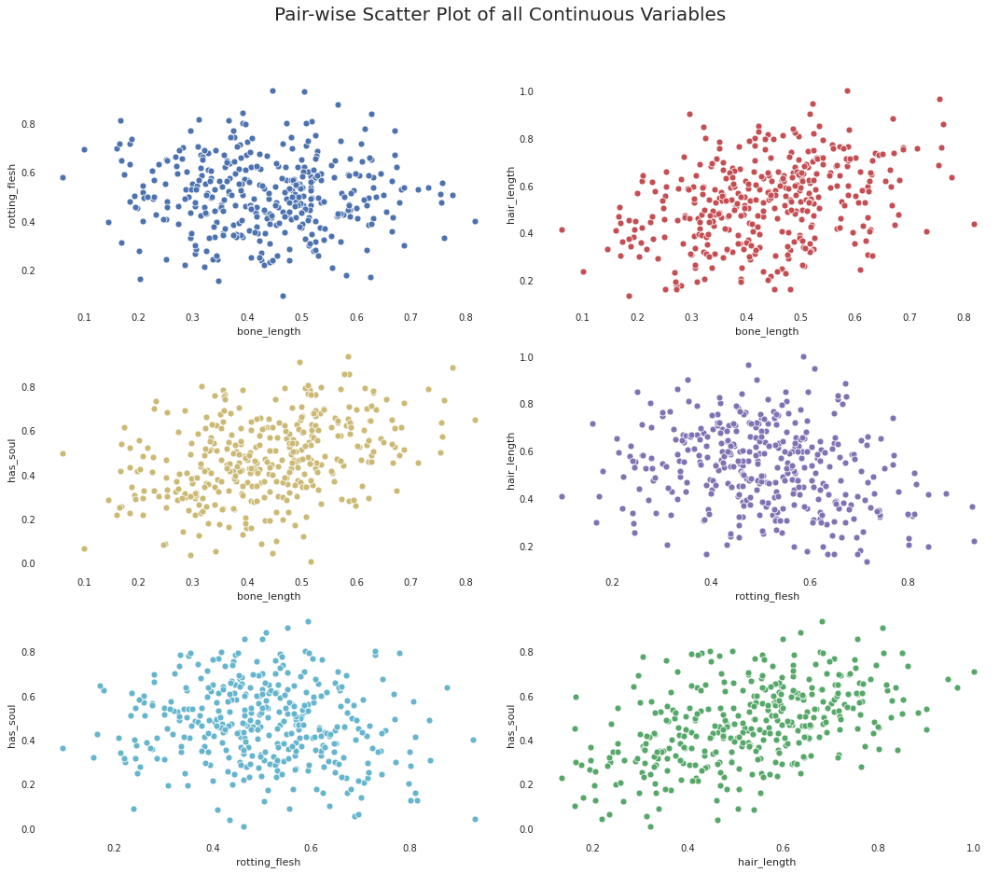

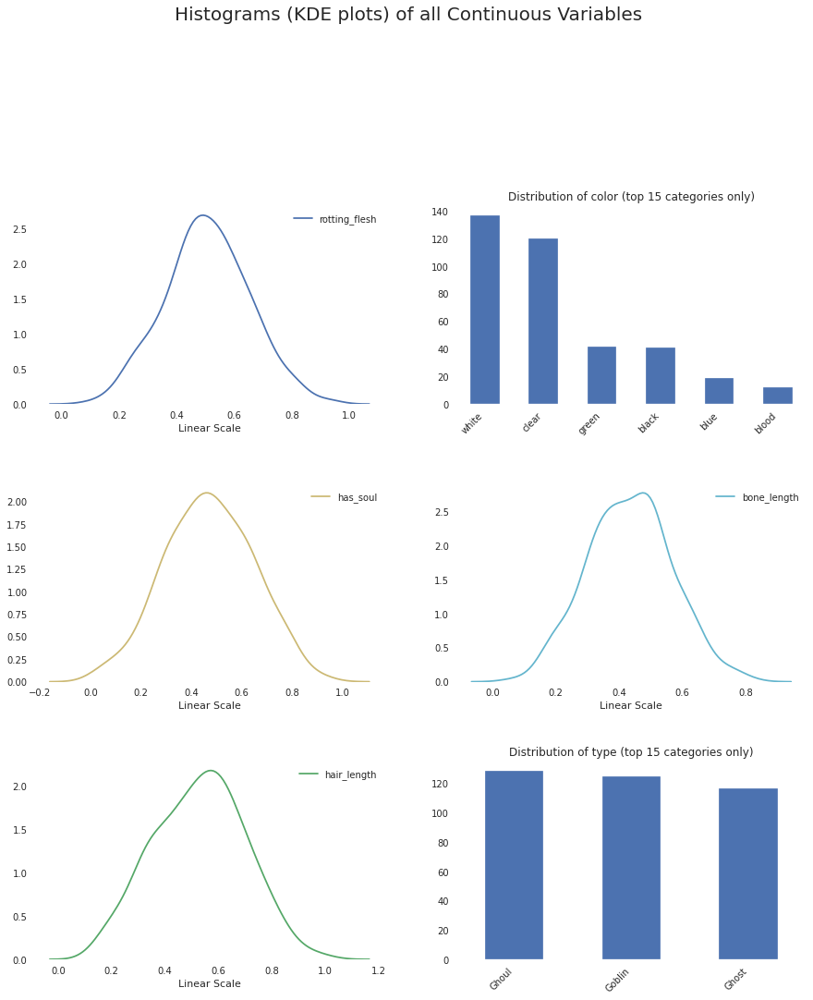

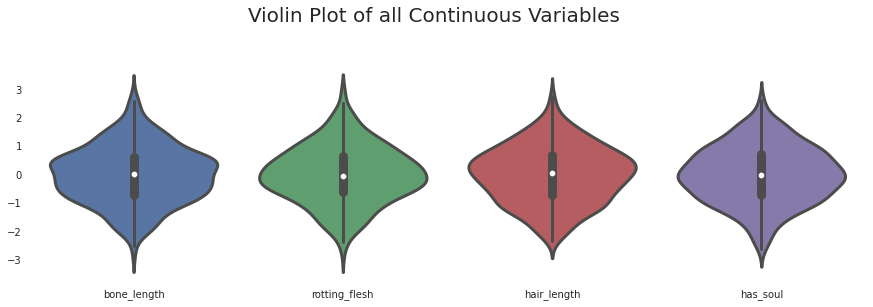

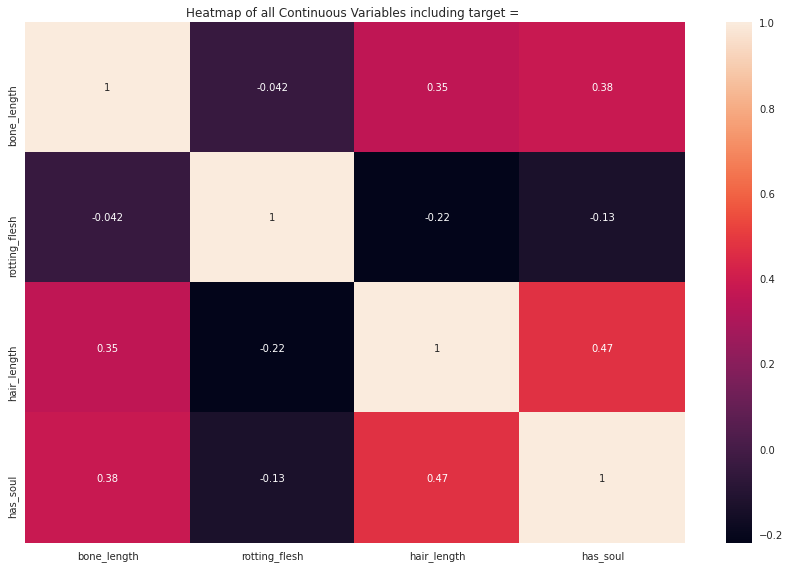

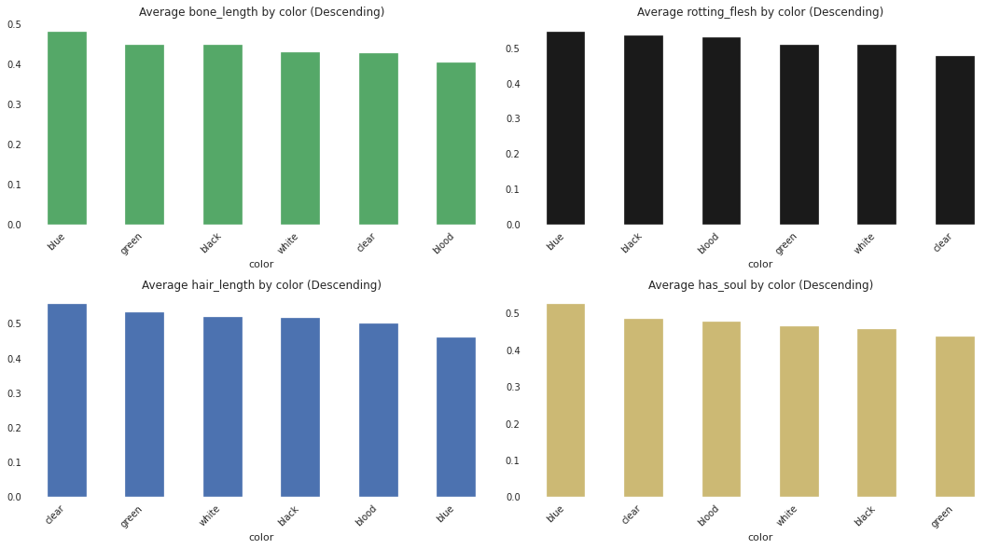

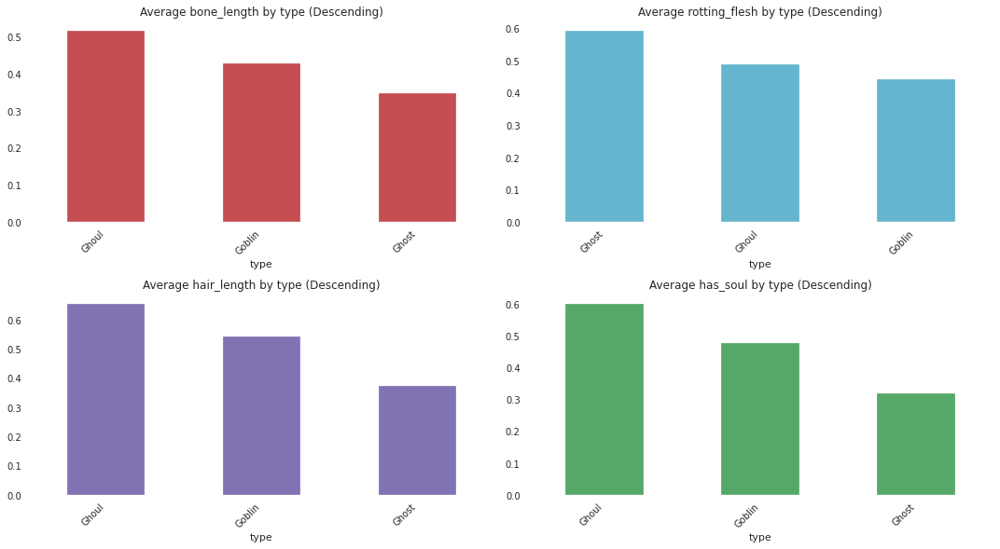

In [ ]:
aftrain=AV.AutoViz('https://raw.githubusercontent.com/insaid2018/Term-4/master/Projects/Ghouls_train.csv')

From the above graphs related to correlation(scatter and heatmap) and distribution plots(histogram,KDE and bar chart for categorical columns), observed that-

- Distribution is normal for all the columns with continuos values
- No data imbalance issue wrt target variable
- Positive correlation between hair_length/bone_length, has_soul/bone_length, has_soul/hair_length  while rotting_flesh has no high correlation with any other columns.
- Also based on color value distribution, it has similar values, for different values of bone_lenght,hair_lenght,rotting_flesh and has_soul.
- Ghoul type in target column seems to have majority when high average  value of bone_length,hair_length and has_soul.
- But, Ghost type in target column seems to have majority for higher values of rotting_flesh.

- So, for Ghoul - higher average values of bone_length,hair_length and has_soul are good reference point, while for Ghost has lowest average value of these colummsn from all the categories in type column.

- For Ghost - high average value of rotting_flesh and low average values for bone_length,hair_length and has_soul

- Gobline value in type  has values in middle range for all the input features.

## **5. Exploratory Data Analysis**

Though, we have done the analysis using Pandas Profiling and AutoViz, but further analysis to get more information

### **5.1. Checking Distribution of Dataset**

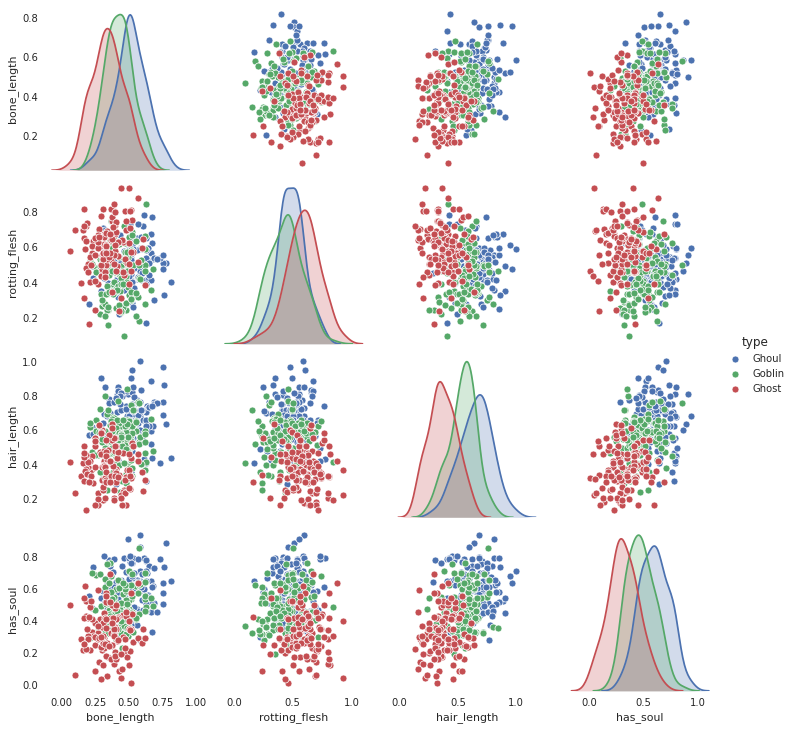

In [ ]:
sns.pairplot(ghoul_train,hue='type')
plt.show()

- Normally distributed for all the types in target column
- For Ghoul, values ranges from 0.6-0.8 in all distributions, but Goblin and Ghost have more range of values - 0-0.6.
- All the input features have high values for Ghoul type except rotting_flesh which has higher values for Ghost type.

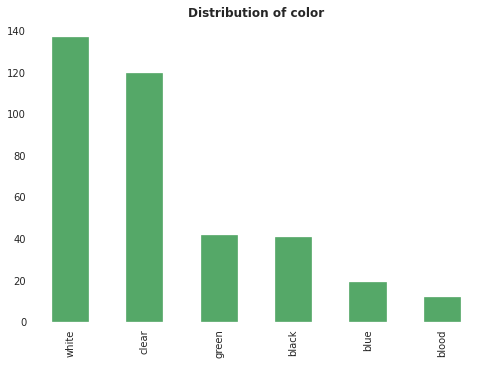

In [ ]:
ghoul_train.color.value_counts().plot(kind='bar', color='g')
plt.title("Distribution of color", fontdict={'fontweight':'bold'})
plt.show()

White and Clear has mjaor distribution of data in dataset when compared to other values

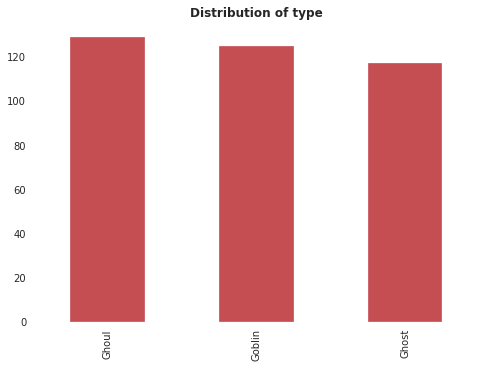

In [ ]:
ghoul_train.type.value_counts().plot(kind='bar', color='r')
plt.title("Distribution of type", fontdict={'fontweight':'bold'})
plt.show()

All the types have similar range, so no data imbalance

### **5.2. Checking Relationship in Dataset**

In [ ]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [ ]:
from plotly.offline import iplot
import plotly.graph_objs as go

In [ ]:
enable_plotly_in_cell()
fig = go.Figure(data=go.Heatmap(z=ghoul_train.corr(),  x=['bone_length','rotting_flesh','hair_length','has_soul'], 
                y=['bone_length','rotting_flesh','hair_length','has_soul']))

fig.show()
configure_plotly_browser_state()

 - No column is highly correlated to each other.
 - Though some positive correlation between hair_length/bone_length(0.35), hair_length/has_soul(0.47), bone_length/has_soul(0.38), but none of them are highly correlated.

In [ ]:
def plot_scattermatrix(df, title):

    x=['bone_length','rotting_flesh','hair_length','has_soul']
    y=['bone_length','rotting_flesh','hair_length','has_soul']

    data=[]
    nm=""
    i=0
    j=0
    fig=plotly.subplots.make_subplots(rows=4, cols=4)
    for col1 in x:
        i=i+1
        j=0
        for col2 in y:
            j=j+1
            nm=str(col1)+" vs "+str(col2)
            trace=go.Scatter(
                x=df[col1], 
                y=df[col2],
                mode='markers', name=nm)

            fig.append_trace(trace, i, j)


    fig.layout.update(height=1000, width=1000, title=title)
    iplot(fig)

In [ ]:
enable_plotly_in_cell()
plot_scattermatrix(ghoul_train, "Correlation Matrix for Train data")

Most of the data points lies between 0.3 to 0.6 range and further zooming-in on the plots, can observe some outliers (though not by huge margin)

- rotting_flesh  - some data points in range of 0.92 and 0.93 and one data point as low as below 0.1
- bone_length - one data point has value of 0.81
- hair_length  - one data point has value of 1

The relation between columns are positive correlation as observed in previous graph.

But, could observe few outliers - 

- bone_length - data points in range too high as 1 and too low as 0.
- rotting_flesh - data point with value 1
- hair_length - data points at value of 0.99 and 0
- has_soul  - data point with value 1

From the above observation, found out that-

- correlation between columns but not too high in both the data sets.
- Few outliers but more outliers observed in test dataset, more can be analyzed further using box plot on test and train datasets.
- From the scatter plot, seems like data points are not linearly seperable.

**5.3. Checking Outliers in Train Dataset**

In [ ]:
def plot_outliers(df):
    cols=['bone_length','rotting_flesh','hair_length','has_soul']
    trace=[]
    for col in cols:
        trace.append(go.Box(y=df[col],name=col))
    data=trace
    iplot({"data":data})

In [ ]:
enable_plotly_in_cell()
plot_outliers(ghoul_train)

As observed before we have few outliers for bone_length and rotting_flesh output above.

Further more analysis done below to get the details based on interquartile range based calcualtion to get extreme limits to detect outliers beyond those limits.

Also, the median value of hair_length and rotting_flesh is higher as compared to other features with hair_length has relative higher extreme value.

bone_length has lowest median value of all, but has_soul has minimum value at 0 and highest value more than of rotting_flesh even when its median value is low that rotting_flesh.

In [ ]:
def get_outlier_info(df):
    Q1=df.quantile(0.25)
    Q3=df.quantile(0.75)
    IQR=Q3-Q1
    #print (IQR)
    return df[((df<(Q1-IQR*1.5)) | (df>(Q3+IQR*1.5))).any(axis=1)]

In [ ]:
ghoul_train_out=get_outlier_info(ghoul_train)
print (ghoul_train_out.shape)
ghoul_train_out

(5, 6)


,bone_length,rotting_flesh,hair_length,has_soul,color,type
52,0.445132,0.932466,0.218732,0.043321,clear,Ghost
166,0.817001,0.400808,0.437047,0.648230,green,Ghoul
174,0.061032,0.578567,0.415440,0.497098,black,Ghost
194,0.465423,0.095687,0.406791,0.364341,black,Goblin
266,0.503780,0.929440,0.366461,0.401567,blue,Ghost


In [ ]:
train_out_indexes=ghoul_train_out.index.to_list()
train_out_indexes

[52, 166, 174, 194, 266]

In [ ]:
def get_outlier_colinfo(df, col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    #print (IQR)
    print (df[((df[col]<(Q1-IQR*1.5)) | (df[col]>(Q3+IQR*1.5)))])

In [ ]:
get_outlier_colinfo(ghoul_train, 'bone_length')

     bone_length  rotting_flesh  hair_length  has_soul  color   type
166     0.817001       0.400808     0.437047  0.648230  green  Ghoul
174     0.061032       0.578567     0.415440  0.497098  black  Ghost


In [ ]:
get_outlier_colinfo(ghoul_train, 'rotting_flesh')

     bone_length  rotting_flesh  hair_length  has_soul  color    type
52      0.445132       0.932466     0.218732  0.043321  clear   Ghost
194     0.465423       0.095687     0.406791  0.364341  black  Goblin
266     0.503780       0.929440     0.366461  0.401567   blue   Ghost


In [ ]:
get_outlier_colinfo(ghoul_train, 'hair_length')

Empty DataFrame
Columns: [bone_length, rotting_flesh, hair_length, has_soul, color, type]
Index: []


In [ ]:
get_outlier_colinfo(ghoul_train, 'has_soul')

Empty DataFrame
Columns: [bone_length, rotting_flesh, hair_length, has_soul, color, type]
Index: []


2 outliers in bone_length and 3 outliers in rotting_flesh which can be removed from dataset for further analysis.

### **5.3. Checking Outliers in Dataset using Isolation Forest**

In [ ]:
#ghoul_train_bone_length=ghoul_train['bone_length'].copy()
#ghoul_train_hair_length=ghoul_train['hair_length'].copy()
#ghoul_train_has_soul=ghoul_train['has_soul'].copy()
#ghoul_train_rotting_flesh=ghoul_train['rotting_flesh'].copy()

In [ ]:
from sklearn.ensemble import IsolationForest

def get_outlier_isolation_forest(df, col, num_estimator):
    isolation_forest = IsolationForest(n_estimators=num_estimator)
    #isolation_forest.fit(df[col].values.reshape(-1, 1))
    isolation_forest.fit(df[[col]])
    #xx = np.linspace(df[col].min(), df[col].max(), len(df)).reshape(-1,1)
    df['anomaly_score'] = isolation_forest.decision_function(df[[col]])
    df['outlier'] = isolation_forest.predict(df[[col]])
    #plt.figure(figsize=(10,4))
    #plt.plot(df[col], anomaly_score, label='anomaly score')
    #plt.fill_between(df[col].T[0], np.min(anomaly_score), np.max(anomaly_score), 
     #                where=outlier==-1, color='r', 
      #               alpha=.4, label='outlier region')
    #plt.legend()
    #plt.ylabel('anomaly score')
    #plt.xlabel(col)
    #plt.show()
    return df

In [ ]:
ghoul_train_bone_length=pd.DataFrame(ghoul_train['bone_length'].copy())
ghoul_train_bone_length=get_outlier_isolation_forest(ghoul_train_bone_length, 'bone_length', 100)
ghoul_train_bone_length[ghoul_train_bone_length.outlier==-1]

,bone_length,anomaly_score,outlier
3,0.776652,-0.212094,-1
9,0.280942,-0.005592,-1
16,0.250770,-0.016097,-1
18,0.605836,-0.018203,-1
24,0.687256,-0.085689,-1
...,...,...,...
344,0.165196,-0.105567,-1
345,0.712913,-0.149862,-1
350,0.203073,-0.052118,-1
351,0.552971,-0.009718,-1


In [ ]:
ghoul_train_bone_length[ghoul_train_bone_length.anomaly_score<0]

,bone_length,anomaly_score,outlier
3,0.776652,-0.212094,-1
9,0.280942,-0.005592,-1
16,0.250770,-0.016097,-1
18,0.605836,-0.018203,-1
24,0.687256,-0.085689,-1
...,...,...,...
344,0.165196,-0.105567,-1
345,0.712913,-0.149862,-1
350,0.203073,-0.052118,-1
351,0.552971,-0.009718,-1


In [ ]:
ghoul_train_rotting_flesh=pd.DataFrame(ghoul_train['rotting_flesh'].copy())
ghoul_train_rotting_flesh=get_outlier_isolation_forest(ghoul_train_rotting_flesh, 'rotting_flesh', 100)
ghoul_train_rotting_flesh[ghoul_train_rotting_flesh.outlier==-1]

,rotting_flesh,anomaly_score,outlier
4,0.875862,-0.218698,-1
5,0.253277,-0.053022,-1
14,0.301345,-0.041887,-1
16,0.246258,-0.055254,-1
19,0.750988,-0.060003,-1
...,...,...,...
358,0.309498,-0.036917,-1
359,0.172182,-0.182310,-1
363,0.799623,-0.070240,-1
369,0.771286,-0.076472,-1


In [ ]:
ghoul_train_rotting_flesh[ghoul_train_rotting_flesh.anomaly_score<0]

,rotting_flesh,anomaly_score,outlier
4,0.875862,-0.218698,-1
5,0.253277,-0.053022,-1
14,0.301345,-0.041887,-1
16,0.246258,-0.055254,-1
19,0.750988,-0.060003,-1
...,...,...,...
358,0.309498,-0.036917,-1
359,0.172182,-0.182310,-1
363,0.799623,-0.070240,-1
369,0.771286,-0.076472,-1


In [ ]:
ghoul_train_hair_length=pd.DataFrame(ghoul_train['hair_length'].copy())
ghoul_train_hair_length=get_outlier_isolation_forest(ghoul_train_hair_length, 'hair_length', 100)
ghoul_train_hair_length[ghoul_train_hair_length.outlier==-1]

,hair_length,anomaly_score,outlier
2,0.811616,-0.059408,-1
9,0.179633,-0.124334,-1
10,0.239212,-0.060039,-1
14,0.745676,-0.019045,-1
17,1.000000,-0.275384,-1
...,...,...,...
357,0.798618,-0.054256,-1
358,0.203057,-0.097019,-1
364,0.840013,-0.089812,-1
365,0.788983,-0.063473,-1


In [ ]:
ghoul_train_hair_length[ghoul_train_hair_length.anomaly_score<0]

,hair_length,anomaly_score,outlier
2,0.811616,-0.059408,-1
9,0.179633,-0.124334,-1
10,0.239212,-0.060039,-1
14,0.745676,-0.019045,-1
17,1.000000,-0.275384,-1
...,...,...,...
357,0.798618,-0.054256,-1
358,0.203057,-0.097019,-1
364,0.840013,-0.089812,-1
365,0.788983,-0.063473,-1


In [ ]:
ghoul_train_has_soul=pd.DataFrame(ghoul_train['has_soul'].copy())
ghoul_train_has_soul=get_outlier_isolation_forest(ghoul_train_has_soul, 'has_soul', 100)
ghoul_train_has_soul[ghoul_train_has_soul.outlier==-1]

,has_soul,anomaly_score,outlier
0,0.781142,-0.031606,-1
2,0.791225,-0.025200,-1
3,0.884464,-0.197049,-1
8,0.227548,-0.019901,-1
9,0.141183,-0.103602,-1
...,...,...,...
328,0.179642,-0.043478,-1
330,0.803195,-0.080531,-1
342,0.712549,-0.024839,-1
344,0.253624,-0.000555,-1


In [ ]:
ghoul_train_has_soul[ghoul_train_has_soul.anomaly_score<0]

,has_soul,anomaly_score,outlier
0,0.781142,-0.031606,-1
2,0.791225,-0.025200,-1
3,0.884464,-0.197049,-1
8,0.227548,-0.019901,-1
9,0.141183,-0.103602,-1
...,...,...,...
328,0.179642,-0.043478,-1
330,0.803195,-0.080531,-1
342,0.712549,-0.024839,-1
344,0.253624,-0.000555,-1


Isolation Forest identified many data points as outliers from the dataset, out of those many seems to be normal data points from the data set.

So, it seems Isolation Forest not worked fine with the given dataset.

Can check using various Algorithms under PyOD package, if any algorithm provided resonable count of outliers.

### **5.4. Checking Outliers in Dataset using PYOD library**

In [ ]:
random_state = np.random.RandomState(42)
outliers_fraction = 0.05

# Define seven outlier detection tools to be compared
classifiers = {
        'Angle-based Outlier Detector (ABOD)': ABOD(contamination=outliers_fraction),
        'Cluster-based Local Outlier Factor (CBLOF)':CBLOF(n_clusters=8, contamination=outliers_fraction,check_estimator=False, random_state=random_state, alpha=0.1),
        'Feature Bagging':FeatureBagging(LOF(n_neighbors=35),contamination=outliers_fraction,check_estimator=False,random_state=random_state),
        'Histogram-base Outlier Detection (HBOS)': HBOS(contamination=outliers_fraction),
        'Isolation Forest': IForest(contamination=outliers_fraction,random_state=random_state),
        'K Nearest Neighbors (KNN)': KNN(contamination=outliers_fraction),
        'Average KNN': KNN(method='mean',contamination=outliers_fraction)
}

cols=['bone_length','rotting_flesh','hair_length','has_soul']

In [ ]:
def get_pyod_outlier_info(df, X, classifiers, cols):
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        
        #predict raw anomaly score
        scores_pred=clf.decision_function(X) * -1
        
        #prediction of a data point category outlier or inlier
        y_pred=clf.predict(X)
        n_inliers=len(y_pred) - np.count_nonzero(y_pred)
        n_outliers=np.count_nonzero(y_pred==1)
        
        print ('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)
        dfx=df.copy()
        dfx['outlier']=y_pred.tolist()
        
        for i,col in enumerate(cols):
            #Inliers
            #IX = np.array(dfx[col][dfx['outlier']==0]).reshape(-1, 1)
            #OX = dfx[col][dfx['outlier']==1].values.reshape(-1, 1)
            IX = dfx[col][dfx['outlier']==0].index.to_list()
            OX = dfx[col][dfx['outlier']==1].index.to_list()
            print ("-----------", col, "------------")
            print(OX)
            

In [ ]:
get_pyod_outlier_info(ghoul_train, ghoul_train.drop(['color','type'], axis=1), classifiers, cols)

OUTLIERS :  23 INLIERS :  348 Angle-based Outlier Detector (ABOD)
----------- bone_length ------------
[3, 16, 30, 52, 66, 68, 82, 118, 153, 166, 171, 174, 177, 194, 204, 249, 266, 272, 282, 284, 293, 317, 359]
----------- rotting_flesh ------------
[3, 16, 30, 52, 66, 68, 82, 118, 153, 166, 171, 174, 177, 194, 204, 249, 266, 272, 282, 284, 293, 317, 359]
----------- hair_length ------------
[3, 16, 30, 52, 66, 68, 82, 118, 153, 166, 171, 174, 177, 194, 204, 249, 266, 272, 282, 284, 293, 317, 359]
----------- has_soul ------------
[3, 16, 30, 52, 66, 68, 82, 118, 153, 166, 171, 174, 177, 194, 204, 249, 266, 272, 282, 284, 293, 317, 359]
OUTLIERS :  19 INLIERS :  352 Cluster-based Local Outlier Factor (CBLOF)
----------- bone_length ------------
[9, 52, 68, 71, 82, 96, 100, 171, 177, 183, 187, 188, 220, 245, 254, 257, 266, 271, 272]
----------- rotting_flesh ------------
[9, 52, 68, 71, 82, 96, 100, 171, 177, 183, 187, 188, 220, 245, 254, 257, 266, 271, 272]
----------- hair_length ----

From all the models, it seems like KNN and Average KNN provided the results that also resembles the intial analysis of outliers based on IQR method

## **6. Initial Analysis of data using PYCARET**



### **6.1. Wihtout Feature Selection**

In [ ]:
#Pre-processing and initializing the setup
#setup(data=ghoul_train, target='type',remove_outliers=True)
setup(data=ghoul_train, target='type')

 
Setup Succesfully Completed!


,Description,Value
0,session_id,6212
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     bone_length  rotting_flesh  ...  color_green  color_white
 0       0.354512       0.350839  ...          0.0          0.0
 1       0.575560       0.425868  ...          1.0          0.0
 2       0.467875       0.354330  ...          0.0          0.0
 3       0.776652       0.508723  ...          0.0          0.0
 4       0.566117       0.875862  ...          1.0          0.0
 ..           ...            ...  ...          ...          ...
 366     0.458132       0.391760  ...          0.0          0.0
 367     0.331936       0.564836  ...          1.0          0.0
 368     0.481640       0.501147  ...          0.0          0.0
 369     0.294943       0.771286  ...          0.0          0.0
 370     0.670200       0.768469  ...          0.0          1.0
 
 [371 rows x 10 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      bone_length  rotting_flesh  ...  color_green  colo

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Linear Discriminant Analysis,0.768200,0.000000,0.767100,0.768800,0.752700,0.650600
1,Gradient Boosting Classifier,0.764500,0.000000,0.766700,0.764700,0.761200,0.646200
2,Extreme Gradient Boosting,0.764500,0.000000,0.766200,0.773300,0.764500,0.645900
3,Light Gradient Boosting Machine,0.760600,0.000000,0.762000,0.763700,0.758400,0.640200
4,CatBoost Classifier,0.753100,0.000000,0.754600,0.759300,0.753500,0.629200
5,Logistic Regression,0.745100,0.000000,0.744400,0.741900,0.716300,0.616100
6,Ridge Classifier,0.741200,0.000000,0.742100,0.758900,0.713500,0.611000
7,Random Forest Classifier,0.726000,0.000000,0.727800,0.739100,0.727300,0.588200
8,Extra Trees Classifier,0.725800,0.000000,0.727300,0.729600,0.722200,0.588000
9,Ada Boost Classifier,0.725700,0.000000,0.728700,0.734900,0.726600,0.588100


Let's create and tune various models which performed fine

**Checking and tuning Linear Discriminant Analysis**

In [ ]:
classification_lda=create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
2,0.7692,0.0,0.7685,0.7946,0.7633,0.6518
3,0.6538,0.0,0.6574,0.6635,0.6573,0.4800
4,0.6923,0.0,0.6991,0.7019,0.6846,0.5378
5,0.8846,0.0,0.8889,0.8841,0.8824,0.8271
6,0.8077,0.0,0.8102,0.8110,0.7957,0.7118
7,0.7692,0.0,0.7593,0.7576,0.7566,0.6518
8,0.6923,0.0,0.6713,0.6533,0.6239,0.5315
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


In [ ]:
tuned_classification_lda=tune_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
2,0.7692,0.0,0.7685,0.7946,0.7633,0.6518
3,0.6538,0.0,0.6574,0.6635,0.6573,0.4800
4,0.7308,0.0,0.7407,0.7942,0.7173,0.5973
5,0.8846,0.0,0.8889,0.8841,0.8824,0.8271
6,0.8077,0.0,0.8102,0.8110,0.7957,0.7118
7,0.7692,0.0,0.7593,0.7576,0.7566,0.6518
8,0.6923,0.0,0.6713,0.6533,0.6239,0.5315
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


**Checking and tuning Logistic Regression**

In [ ]:
classification_lr=create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8077,0.0,0.8148,0.8137,0.7973,0.7118
2,0.6923,0.0,0.6944,0.6781,0.6623,0.5378
3,0.5769,0.0,0.5833,0.5657,0.5701,0.3659
4,0.7308,0.0,0.7407,0.7942,0.7173,0.5973
5,0.8077,0.0,0.8148,0.8115,0.7958,0.7124
6,0.8462,0.0,0.8519,0.8755,0.8323,0.7699
7,0.7692,0.0,0.7500,0.8306,0.7178,0.6486
8,0.6538,0.0,0.6296,0.4846,0.5511,0.4718
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


In [ ]:
tuned_classification_lr=tune_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8846,0.0,0.8889,0.8875,0.8843,0.8267
1,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
2,0.7692,0.0,0.7685,0.7946,0.7633,0.6518
3,0.6538,0.0,0.6574,0.6635,0.6573,0.4800
4,0.6923,0.0,0.6991,0.7019,0.6846,0.5378
5,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
6,0.8462,0.0,0.8519,0.8755,0.8323,0.7699
7,0.7308,0.0,0.7176,0.7135,0.7079,0.5928
8,0.6923,0.0,0.6713,0.6533,0.6239,0.5315
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


**Checking and tuning Ridge Classifier**

In [ ]:
classification_ridge=create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8137,0.7973,0.7118
1,0.7692,0.0,0.7778,0.7748,0.7482,0.6549
2,0.7308,0.0,0.7315,0.7342,0.7140,0.5947
3,0.6154,0.0,0.6250,0.5945,0.5999,0.4248
4,0.6923,0.0,0.7037,0.7719,0.6630,0.5408
5,0.8077,0.0,0.8148,0.8115,0.7958,0.7124
6,0.8077,0.0,0.8148,0.8519,0.7832,0.7124
7,0.7308,0.0,0.7176,0.7135,0.7079,0.5928
8,0.7308,0.0,0.7083,0.8134,0.6508,0.5892
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


In [ ]:
tuned_classification_ridge=tune_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8137,0.7973,0.7118
1,0.7692,0.0,0.7778,0.7748,0.7482,0.6549
2,0.7308,0.0,0.7315,0.7342,0.7140,0.5947
3,0.6538,0.0,0.6620,0.6481,0.6466,0.4823
4,0.6923,0.0,0.7037,0.7719,0.6630,0.5408
5,0.7692,0.0,0.7778,0.7748,0.7482,0.6549
6,0.8077,0.0,0.8148,0.8519,0.7832,0.7124
7,0.7308,0.0,0.7176,0.7135,0.7079,0.5928
8,0.7308,0.0,0.7083,0.8134,0.6508,0.5892
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


**Checking and tuning CatBoost Classifier**

In [ ]:
classification_catb=create_model('catboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8096,0.8071,0.7111
1,0.8077,0.0,0.8102,0.8066,0.8054,0.7118
2,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
3,0.6923,0.0,0.6944,0.6923,0.6923,0.5378
4,0.6154,0.0,0.6250,0.6154,0.6143,0.4222
5,0.8077,0.0,0.8102,0.8144,0.8094,0.7111
6,0.8462,0.0,0.8472,0.8499,0.8462,0.7694
7,0.6538,0.0,0.6481,0.6758,0.6595,0.4812
8,0.7692,0.0,0.7639,0.7721,0.7689,0.6533
9,0.8000,0.0,0.8009,0.7996,0.7942,0.7002


In [ ]:
tuned_classification_catb=tune_model('catboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8462,0.0,0.8519,0.8615,0.8456,0.7699
2,0.6538,0.0,0.6528,0.7010,0.6612,0.4765
3,0.6538,0.0,0.6574,0.6635,0.6573,0.4800
4,0.6923,0.0,0.7037,0.6857,0.6822,0.5398
5,0.8077,0.0,0.8102,0.8278,0.8113,0.7118
6,0.8846,0.0,0.8843,0.8932,0.8869,0.8271
7,0.6923,0.0,0.6852,0.7023,0.6904,0.5378
8,0.6154,0.0,0.6065,0.6260,0.6191,0.4222
9,0.6800,0.0,0.6759,0.6640,0.6660,0.5192


**Checking and tuning Random Forest Classifier**

In [ ]:
classification_rf=create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7308,0.0,0.7407,0.7206,0.7240,0.5965
1,0.8462,0.0,0.8472,0.8671,0.8490,0.7689
2,0.6538,0.0,0.6528,0.6760,0.6582,0.4777
3,0.6538,0.0,0.6528,0.6896,0.6625,0.4788
4,0.6154,0.0,0.6250,0.6381,0.6232,0.4209
5,0.7692,0.0,0.7731,0.7862,0.7712,0.6533
6,0.8077,0.0,0.8102,0.8110,0.7957,0.7118
7,0.7308,0.0,0.7269,0.7431,0.7353,0.5965
8,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
9,0.7600,0.0,0.7639,0.7600,0.7600,0.6394


In [ ]:
tuned_classification_rf=tune_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8846,0.0,0.8889,0.8966,0.8840,0.8271
2,0.7308,0.0,0.7361,0.7443,0.7331,0.5947
3,0.6538,0.0,0.6574,0.6462,0.6487,0.4800
4,0.6538,0.0,0.6667,0.6389,0.6448,0.4812
5,0.7692,0.0,0.7778,0.7631,0.7610,0.6541
6,0.8462,0.0,0.8472,0.8499,0.8462,0.7694
7,0.6923,0.0,0.6806,0.6875,0.6807,0.5357
8,0.7692,0.0,0.7593,0.7676,0.7576,0.6518
9,0.6800,0.0,0.6759,0.6451,0.6431,0.5169


**Checking and tuning Extra Trees Classifier**

In [ ]:
classification_et=create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7308,0.0,0.7361,0.7462,0.7366,0.5947
1,0.7692,0.0,0.7731,0.7682,0.7670,0.6541
2,0.7692,0.0,0.7685,0.7902,0.7714,0.6518
3,0.6923,0.0,0.6991,0.6912,0.6900,0.5388
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.7308,0.0,0.7407,0.7284,0.7246,0.5965
6,0.8462,0.0,0.8472,0.8462,0.8462,0.7689
7,0.6154,0.0,0.6111,0.6505,0.6271,0.4248
8,0.7308,0.0,0.7176,0.7135,0.7079,0.5928
9,0.7200,0.0,0.7176,0.7055,0.7009,0.5773


In [ ]:
tuned_classification_et=tune_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8077,0.0,0.8148,0.8115,0.7958,0.7124
2,0.7692,0.0,0.7731,0.7858,0.7502,0.6533
3,0.6538,0.0,0.6620,0.6481,0.6466,0.4823
4,0.6923,0.0,0.7037,0.6846,0.6767,0.5398
5,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
6,0.8462,0.0,0.8472,0.8476,0.8409,0.7694
7,0.6538,0.0,0.6435,0.6550,0.6505,0.4788
8,0.7692,0.0,0.7593,0.7676,0.7576,0.6518
9,0.7200,0.0,0.7130,0.7093,0.6751,0.5763


**Checking and tuning Ada Boost Classifier**

In [ ]:
classification_ada=create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7778,0.7639,0.7647,0.6541
1,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
2,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
3,0.7308,0.0,0.7315,0.7407,0.7340,0.5947
4,0.6154,0.0,0.6204,0.6346,0.6170,0.4209
5,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
6,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
7,0.6923,0.0,0.6898,0.7198,0.6998,0.5398
8,0.7308,0.0,0.7269,0.7446,0.7321,0.5965
9,0.6800,0.0,0.6852,0.6694,0.6729,0.5204


In [ ]:
tuned_classification_ada=tune_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8462,0.8462,0.7689
1,0.5769,0.0,0.5833,0.5683,0.5716,0.3644
2,0.7692,0.0,0.7685,0.7981,0.7718,0.6518
3,0.7308,0.0,0.7361,0.7569,0.7343,0.5947
4,0.5769,0.0,0.5833,0.5942,0.5821,0.3630
5,0.6538,0.0,0.6620,0.6587,0.6550,0.4800
6,0.8077,0.0,0.8102,0.8066,0.8054,0.7118
7,0.6538,0.0,0.6481,0.6656,0.6584,0.4812
8,0.7692,0.0,0.7685,0.7904,0.7753,0.6549
9,0.8400,0.0,0.8426,0.8394,0.8376,0.7602


**Checking and tuning Extreme Gradient Boosting**

In [ ]:
classification_xgboost=create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
2,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
3,0.7308,0.0,0.7315,0.7692,0.7388,0.5938
4,0.6154,0.0,0.6250,0.6154,0.6143,0.4222
5,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
6,0.9231,0.0,0.9259,0.9312,0.9204,0.8847
7,0.6538,0.0,0.6481,0.6704,0.6606,0.4812
8,0.8462,0.0,0.8426,0.8452,0.8438,0.7689
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
tuned_classification_xgboost=tune_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7778,0.7692,0.7692,0.6533
1,0.7692,0.0,0.7778,0.7736,0.7639,0.6549
2,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
3,0.6154,0.0,0.6204,0.6354,0.6202,0.4222
4,0.7308,0.0,0.7407,0.7206,0.7240,0.5965
5,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
6,0.7692,0.0,0.7731,0.7682,0.7670,0.6541
7,0.6154,0.0,0.6111,0.6455,0.6179,0.4235
8,0.7308,0.0,0.7222,0.7305,0.7261,0.5947
9,0.7600,0.0,0.7639,0.7646,0.7544,0.6411


**Checking and tuning Gradient Boosting Classifier**

In [ ]:
classification_gbc=create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
1,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
2,0.7308,0.0,0.7315,0.7318,0.7267,0.5947
3,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.7308,0.0,0.7407,0.7284,0.7246,0.5965
6,0.8846,0.0,0.8843,0.8837,0.8822,0.8267
7,0.7308,0.0,0.7222,0.7305,0.7261,0.5947
8,0.8077,0.0,0.8056,0.8157,0.8100,0.7118
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
tuned_classification_gbc=tune_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.6538,0.0,0.6435,0.7775,0.6490,0.4742
1,0.8462,0.0,0.8519,0.8615,0.8456,0.7699
2,0.7692,0.0,0.7685,0.7902,0.7714,0.6518
3,0.8462,0.0,0.8472,0.8623,0.8492,0.7684
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.6923,0.0,0.6991,0.7053,0.6933,0.5378
6,0.8077,0.0,0.8102,0.8154,0.7980,0.7124
7,0.6538,0.0,0.6620,0.7473,0.6594,0.4868
8,0.7308,0.0,0.7222,0.7321,0.7204,0.5947
9,0.8000,0.0,0.8009,0.7996,0.7942,0.7002


**Checking and tuning Light Gradient Boosting Classifier**

In [ ]:
classification_lightgbm=create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
1,0.7308,0.0,0.7315,0.7413,0.7345,0.5956
2,0.7692,0.0,0.7731,0.7808,0.7730,0.6526
3,0.6923,0.0,0.6944,0.6984,0.6935,0.5367
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.8077,0.0,0.8102,0.8058,0.8051,0.7111
6,0.9231,0.0,0.9259,0.9312,0.9204,0.8847
7,0.6923,0.0,0.6806,0.6818,0.6819,0.5357
8,0.7692,0.0,0.7685,0.7904,0.7753,0.6549
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
tuned_classification_lightgbm=tune_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8846,0.0,0.8889,0.8841,0.8824,0.8271
1,0.8846,0.0,0.8889,0.8841,0.8824,0.8271
2,0.7692,0.0,0.7685,0.7902,0.7714,0.6518
3,0.6923,0.0,0.6944,0.7122,0.6982,0.5367
4,0.6923,0.0,0.7037,0.6822,0.6855,0.5388
5,0.7692,0.0,0.7731,0.7730,0.7692,0.6541
6,0.8462,0.0,0.8519,0.8776,0.8437,0.7704
7,0.6538,0.0,0.6435,0.6550,0.6505,0.4788
8,0.7308,0.0,0.7315,0.7674,0.7390,0.5982
9,0.7600,0.0,0.7639,0.7646,0.7544,0.6411


From all the above models analyzed, below have the best results to analyze/tune further

- classification_lda,
- classification_xgboost,
- classification_lightgbm,
- classification_gbc,
- tuned_classification_lightgbm

**Voting Classifier - Hard**

In [ ]:
blend_specific_hard=blend_models(estimator_list=[classification_lda,classification_xgboost,classification_lightgbm,classification_gbc,tuned_classification_lightgbm],
                                 method='hard')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
1,0.8077,0.0,0.8102,0.8144,0.8094,0.7111
2,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
3,0.7308,0.0,0.7315,0.7407,0.7340,0.5947
4,0.6154,0.0,0.6250,0.6154,0.6143,0.4222
5,0.8077,0.0,0.8102,0.8058,0.8051,0.7111
6,0.9231,0.0,0.9259,0.9312,0.9204,0.8847
7,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
8,0.8077,0.0,0.8056,0.8157,0.8100,0.7118
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


**blend_specific_hard seems to have best accuracy at iteration 6 - 92 %**

**Stacking  - Hard**

In [ ]:
stack_hard=stack_models(estimator_list=[classification_lda,tuned_classification_catb,classification_xgboost,classification_lightgbm,classification_gbc,tuned_classification_lightgbm],
                                 method='hard')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
1,0.8077,0.0,0.8102,0.8058,0.8051,0.7111
2,0.6538,0.0,0.6528,0.7010,0.6612,0.4765
3,0.6923,0.0,0.6944,0.7163,0.6981,0.5378
4,0.6538,0.0,0.6620,0.6538,0.6538,0.4800
5,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
6,0.8462,0.0,0.8472,0.8687,0.8419,0.7694
7,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
8,0.8077,0.0,0.8009,0.8059,0.8017,0.7105
9,0.8000,0.0,0.8009,0.7996,0.7942,0.7002


In [ ]:
stack_soft=stack_models(estimator_list=[classification_lda,tuned_classification_catb,classification_xgboost,classification_lightgbm,classification_gbc,tuned_classification_lightgbm],
                                 method='soft')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
1,0.8077,0.0,0.8102,0.8058,0.8051,0.7111
2,0.6538,0.0,0.6528,0.7010,0.6612,0.4765
3,0.6923,0.0,0.6944,0.7163,0.6981,0.5378
4,0.6538,0.0,0.6620,0.6538,0.6538,0.4800
5,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
6,0.8462,0.0,0.8472,0.8687,0.8419,0.7694
7,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
8,0.8077,0.0,0.8009,0.8059,0.8017,0.7105
9,0.8000,0.0,0.8009,0.7996,0.7942,0.7002


**Enemble of the models**

In [ ]:
ensemble_bag_1=ensemble_model(classification_xgboost, method='Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8561,0.8442,0.7689
1,0.8846,0.0,0.8889,0.9135,0.8813,0.8267
2,0.6923,0.0,0.6898,0.7388,0.6994,0.5347
3,0.6923,0.0,0.6944,0.6923,0.6923,0.5378
4,0.6538,0.0,0.6667,0.6389,0.6448,0.4812
5,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
6,0.8462,0.0,0.8472,0.8476,0.8409,0.7694
7,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
8,0.7692,0.0,0.7685,0.7904,0.7753,0.6549
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
ensemble_boost_1=ensemble_model(classification_xgboost, method='Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.3462,0.0,0.3333,0.1198,0.1780,0.0
1,0.3462,0.0,0.3333,0.1198,0.1780,0.0
2,0.3462,0.0,0.3333,0.1198,0.1780,0.0
3,0.3462,0.0,0.3333,0.1198,0.1780,0.0
4,0.3462,0.0,0.3333,0.1198,0.1780,0.0
5,0.3462,0.0,0.3333,0.1198,0.1780,0.0
6,0.3462,0.0,0.3333,0.1198,0.1780,0.0
7,0.3462,0.0,0.3333,0.1198,0.1780,0.0
8,0.3462,0.0,0.3333,0.1198,0.1780,0.0
9,0.3600,0.0,0.3333,0.1296,0.1906,0.0


In [ ]:
ensemble_bag_2=ensemble_model(classification_lightgbm, method='Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8846,0.0,0.8889,0.8875,0.8843,0.8267
1,0.8077,0.0,0.8056,0.8407,0.8128,0.7105
2,0.6923,0.0,0.6898,0.7388,0.6994,0.5347
3,0.6538,0.0,0.6528,0.6621,0.6565,0.4788
4,0.6538,0.0,0.6667,0.6356,0.6400,0.4823
5,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
6,0.8077,0.0,0.8102,0.8198,0.8066,0.7124
7,0.7308,0.0,0.7222,0.7305,0.7261,0.5947
8,0.8077,0.0,0.8056,0.8157,0.8100,0.7118
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
ensemble_boost_2=ensemble_model(classification_lightgbm, method='Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
1,0.6538,0.0,0.6574,0.6462,0.6487,0.4800
2,0.7692,0.0,0.7731,0.7808,0.7730,0.6526
3,0.6538,0.0,0.6528,0.6718,0.6570,0.4777
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
6,0.9231,0.0,0.9259,0.9312,0.9204,0.8847
7,0.6538,0.0,0.6435,0.6550,0.6505,0.4788
8,0.7692,0.0,0.7685,0.7904,0.7753,0.6549
9,0.7600,0.0,0.7593,0.7493,0.7473,0.6394


In [ ]:
ensemble_bag_3=ensemble_model(classification_gbc, method='Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8846,0.0,0.8889,0.8875,0.8843,0.8267
1,0.8462,0.0,0.8472,0.8935,0.8473,0.7684
2,0.6538,0.0,0.6528,0.6718,0.6570,0.4777
3,0.6923,0.0,0.6944,0.6923,0.6923,0.5378
4,0.6923,0.0,0.7037,0.6822,0.6855,0.5388
5,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
6,0.8462,0.0,0.8472,0.8476,0.8409,0.7694
7,0.6923,0.0,0.6852,0.6923,0.6923,0.5378
8,0.7692,0.0,0.7685,0.7904,0.7753,0.6549
9,0.7200,0.0,0.7176,0.7000,0.6974,0.5783


In [ ]:
ensemble_boost_3=ensemble_model(classification_gbc, method='Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8456,0.8439,0.7694
1,0.7692,0.0,0.7731,0.7692,0.7692,0.6533
2,0.6538,0.0,0.6574,0.6676,0.6591,0.4788
3,0.7692,0.0,0.7731,0.7876,0.7738,0.6526
4,0.6538,0.0,0.6620,0.6558,0.6500,0.4800
5,0.7692,0.0,0.7778,0.7639,0.7647,0.6541
6,0.8846,0.0,0.8843,0.8837,0.8822,0.8267
7,0.6923,0.0,0.6852,0.6990,0.6940,0.5378
8,0.8077,0.0,0.8056,0.8157,0.8100,0.7118
9,0.7200,0.0,0.7176,0.7047,0.6972,0.5793


In [ ]:
ensemble_bag_4=ensemble_model(tuned_classification_lightgbm, method='Bagging')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8846,0.0,0.8889,0.8875,0.8843,0.8267
1,0.9231,0.0,0.9259,0.9371,0.9221,0.8844
2,0.7308,0.0,0.7315,0.7577,0.7374,0.5938
3,0.7692,0.0,0.7685,0.7972,0.7753,0.6518
4,0.6923,0.0,0.7037,0.6822,0.6855,0.5388
5,0.7692,0.0,0.7731,0.7730,0.7692,0.6541
6,0.8462,0.0,0.8472,0.8499,0.8462,0.7694
7,0.6923,0.0,0.6806,0.6875,0.6807,0.5357
8,0.7308,0.0,0.7269,0.7431,0.7353,0.5965
9,0.7200,0.0,0.7176,0.7000,0.6974,0.5783


In [ ]:
ensemble_boost_4=ensemble_model(tuned_classification_lightgbm, method='Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.3462,0.0,0.3333,0.1198,0.1780,0.0
1,0.3462,0.0,0.3333,0.1198,0.1780,0.0
2,0.3462,0.0,0.3333,0.1198,0.1780,0.0
3,0.3462,0.0,0.3333,0.1198,0.1780,0.0
4,0.3462,0.0,0.3333,0.1198,0.1780,0.0
5,0.3462,0.0,0.3333,0.1198,0.1780,0.0
6,0.3462,0.0,0.3333,0.1198,0.1780,0.0
7,0.3462,0.0,0.3333,0.1198,0.1780,0.0
8,0.3462,0.0,0.3333,0.1198,0.1780,0.0
9,0.3600,0.0,0.3333,0.1296,0.1906,0.0


Below models finally performed better on train data than others and can be evaluated

- blend_specific_hard - with all models passed in the listg
- ensemble_bag_2 for light gradient boosting
- ensemble_boost_3 for gradient boositng classifier

In [ ]:
evaluate_model(blend_specific_hard)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
evaluate_model(ensemble_boost_2)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
evaluate_model(ensemble_boost_3)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

Below models finally shortlisted which can be cosidered by modelling later

In [ ]:
blend_specific_hard

VotingClassifier(estimators=[('One Vs Rest Classifier_5',
                              OneVsRestClassifier(estimator=XGBClassifier(base_score=0.5,
                                                                          booster='gbtree',
                                                                          colsample_bylevel=1,
                                                                          colsample_bynode=1,
                                                                          colsample_bytree=1,
                                                                          gamma=0,
                                                                          learning_rate=0.48,
                                                                          max_delta_step=0,
                                                                          max_depth=100,
                                                                          min_child_weight=4,
                         

In [ ]:
ensemble_boost_2

OneVsRestClassifier(estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                                 base_estimator=LGBMClassifier(boosting_type='gbdt',
                                                                               class_weight=None,
                                                                               colsample_bytree=1.0,
                                                                               importance_type='split',
                                                                               learning_rate=0.1,
                                                                               max_depth=-1,
                                                                               min_child_samples=20,
                                                                               min_child_weight=0.001,
                                                                               min_split_gain=0.0,
                                

In [ ]:
ensemble_boost_3

OneVsRestClassifier(estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                                 base_estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                                                           criterion='friedman_mse',
                                                                                           init=None,
                                                                                           learning_rate=0.1,
                                                                                           loss='deviance',
                                                                                           max_depth=3,
                                                                                           max_features=None,
                                                                                           max_leaf_nodes=None,
                                                             

From the above observation, while applying ML models, can try with **light gradient boosting classifer** and **gradient boosting classifier** and can apply **Voting Classifier** with the models as these all produced best results here among the set of classifiers.

Also other modesl like **lda, catboost classifier** produced fine results, so can be applied

### **6.2. With Feature Selection**

In [ ]:
setup(data=ghoul_train, target='type', feature_selection=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,2021
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     rotting_flesh  color_black  ...  color_green  color_white
 0         0.350839          0.0  ...          0.0          0.0
 1         0.425868          0.0  ...          1.0          0.0
 2         0.354330          1.0  ...          0.0          0.0
 3         0.508723          1.0  ...          0.0          0.0
 4         0.875862          0.0  ...          1.0          0.0
 ..             ...          ...  ...          ...          ...
 366       0.391760          0.0  ...          0.0          0.0
 367       0.564836          0.0  ...          1.0          0.0
 368       0.501147          0.0  ...          0.0          0.0
 369       0.771286          0.0  ...          0.0          0.0
 370       0.768469          0.0  ...          0.0          1.0
 
 [371 rows x 8 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      rotting_flesh  color_black  ...  color_green  color

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Extreme Gradient Boosting,0.714300,0.000000,0.716200,0.718900,0.710500,0.571000
1,CatBoost Classifier,0.714300,0.000000,0.716700,0.722600,0.707500,0.571000
2,Linear Discriminant Analysis,0.710500,0.000000,0.712000,0.710300,0.695700,0.565100
3,Light Gradient Boosting Machine,0.710500,0.000000,0.711600,0.715600,0.708400,0.565100
4,Gradient Boosting Classifier,0.698900,0.000000,0.700000,0.704800,0.696400,0.547700
5,Ridge Classifier,0.695200,0.000000,0.697200,0.701300,0.668600,0.542500
6,Naive Bayes,0.695100,0.000000,0.696300,0.697400,0.685900,0.542600
7,Logistic Regression,0.683700,0.000000,0.685200,0.674500,0.658400,0.525000
8,SVM - Linear Kernel,0.683500,0.000000,0.686600,0.719400,0.667400,0.524800
9,Ada Boost Classifier,0.679500,0.000000,0.680100,0.691300,0.676100,0.518400


It seems model not performed fine with feature selection=True

### **6.3. Without Feature Selection and Normalization**

In [ ]:
setup(data=ghoul_train, target='type', normalize=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,2208
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     bone_length  rotting_flesh  ...  color_green  color_white
 0      -0.600418      -1.067386  ...          0.0          0.0
 1       1.065931      -0.554049  ...          1.0          0.0
 2       0.254162      -1.043498  ...          0.0          0.0
 3       2.581850       0.012822  ...          0.0          0.0
 4       0.994744       2.524715  ...          1.0          0.0
 ..           ...            ...  ...          ...          ...
 366     0.180710      -0.787414  ...          0.0          0.0
 367    -0.770606       0.396737  ...          1.0          0.0
 368     0.357922      -0.039008  ...          0.0          0.0
 369    -1.049475       1.809230  ...          0.0          0.0
 370     1.779364       1.789953  ...          0.0          1.0
 
 [371 rows x 10 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      bone_length  rotting_flesh  ...  color_green  colo

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Logistic Regression,0.729500,0.000000,0.731900,0.727200,0.722000,0.593700
1,Linear Discriminant Analysis,0.729500,0.000000,0.731900,0.727300,0.720500,0.593900
2,Ridge Classifier,0.725500,0.000000,0.727800,0.728700,0.712400,0.588000
3,CatBoost Classifier,0.718300,0.000000,0.719000,0.730600,0.715600,0.576700
4,Extreme Gradient Boosting,0.710600,0.000000,0.711600,0.718700,0.707700,0.565000
5,Extra Trees Classifier,0.702800,0.000000,0.703200,0.705900,0.700500,0.553600
6,K Neighbors Classifier,0.702600,0.000000,0.701400,0.733200,0.701700,0.552100
7,Light Gradient Boosting Machine,0.699100,0.000000,0.699100,0.708100,0.694200,0.547100
8,Gradient Boosting Classifier,0.698900,0.000000,0.700000,0.705100,0.693900,0.547800
9,Random Forest Classifier,0.679800,0.000000,0.681500,0.690600,0.676600,0.518900


Still the accuracy is low wrt initial analysis  - without feature selection and no normalization

### **6.4. With Feature Selection and Normalization**

In [ ]:
setup(data=ghoul_train, target='type', feature_selection=True, normalize=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,7672
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     rotting_flesh  color_black  ...  color_white  color_blue
 0        -1.067386          0.0  ...          0.0         0.0
 1        -0.554049          0.0  ...          0.0         0.0
 2        -1.043498          1.0  ...          0.0         0.0
 3         0.012822          1.0  ...          0.0         0.0
 4         2.524715          0.0  ...          0.0         0.0
 ..             ...          ...  ...          ...         ...
 366      -0.787414          0.0  ...          0.0         1.0
 367       0.396737          0.0  ...          0.0         0.0
 368      -0.039008          0.0  ...          0.0         0.0
 369       1.809230          0.0  ...          0.0         0.0
 370       1.789953          0.0  ...          1.0         0.0
 
 [371 rows x 9 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      rotting_flesh  color_black  ...  color_white  color_blue
 121  

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Logistic Regression,0.757100,0.000000,0.759300,0.751500,0.746700,0.635300
1,Linear Discriminant Analysis,0.745500,0.000000,0.748100,0.746500,0.735500,0.617900
2,Ridge Classifier,0.726200,0.000000,0.729200,0.725600,0.707400,0.589200
3,Extreme Gradient Boosting,0.718600,0.000000,0.720800,0.734300,0.715200,0.577400
4,Gradient Boosting Classifier,0.714900,0.000000,0.717600,0.732300,0.711300,0.571900
5,Light Gradient Boosting Machine,0.703400,0.000000,0.707400,0.720400,0.698800,0.555100
6,SVM - Linear Kernel,0.699100,0.000000,0.700000,0.732400,0.683200,0.547600
7,CatBoost Classifier,0.695400,0.000000,0.698600,0.712900,0.691100,0.542900
8,Ada Boost Classifier,0.687700,0.000000,0.691700,0.695500,0.684500,0.531400
9,Extra Trees Classifier,0.676200,0.000000,0.676900,0.692900,0.671700,0.512700


In [ ]:
classification_lr=create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7731,0.7759,0.7479,0.6541
1,0.5769,0.0,0.5880,0.5038,0.5233,0.3673
2,0.8462,0.0,0.8519,0.8462,0.8462,0.7689
3,0.9231,0.0,0.9259,0.9231,0.9231,0.8844
4,0.7692,0.0,0.7731,0.7885,0.7637,0.6533
5,0.8077,0.0,0.8148,0.8121,0.8024,0.7124
6,0.6538,0.0,0.6620,0.6500,0.6508,0.4800
7,0.7308,0.0,0.7222,0.7187,0.7200,0.5947
8,0.6538,0.0,0.6435,0.6550,0.6505,0.4788
9,0.8400,0.0,0.8380,0.8423,0.8392,0.7590


In [ ]:
tuned_classification_lr=tune_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7731,0.7759,0.7479,0.6541
1,0.6154,0.0,0.6250,0.5797,0.5831,0.4235
2,0.8077,0.0,0.8148,0.8024,0.8032,0.7118
3,0.9231,0.0,0.9259,0.9231,0.9231,0.8844
4,0.7308,0.0,0.7361,0.7592,0.7188,0.5956
5,0.8077,0.0,0.8148,0.8121,0.8024,0.7124
6,0.6538,0.0,0.6620,0.6500,0.6508,0.4800
7,0.6923,0.0,0.6852,0.6843,0.6817,0.5378
8,0.6154,0.0,0.6065,0.6324,0.6173,0.4222
9,0.8400,0.0,0.8380,0.8423,0.8392,0.7590


In [ ]:
classification_lda=create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7731,0.7759,0.7479,0.6541
1,0.5769,0.0,0.5880,0.5172,0.5173,0.3673
2,0.8462,0.0,0.8519,0.8462,0.8462,0.7689
3,0.9231,0.0,0.9259,0.9231,0.9231,0.8844
4,0.7308,0.0,0.7361,0.7592,0.7188,0.5956
5,0.8077,0.0,0.8148,0.8121,0.8024,0.7124
6,0.6154,0.0,0.6250,0.6381,0.6232,0.4209
7,0.7308,0.0,0.7222,0.7187,0.7200,0.5947
8,0.6154,0.0,0.6065,0.6324,0.6173,0.4222
9,0.8400,0.0,0.8380,0.8423,0.8392,0.7590


In [ ]:
tuned_classification_lda=tune_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7692,0.0,0.7731,0.7759,0.7479,0.6541
1,0.6538,0.0,0.6667,0.4277,0.5171,0.4846
2,0.7692,0.0,0.7778,0.7631,0.7610,0.6541
3,0.8462,0.0,0.8519,0.8505,0.8408,0.7699
4,0.8077,0.0,0.8102,0.8358,0.8012,0.7105
5,0.8077,0.0,0.8148,0.8121,0.8024,0.7124
6,0.7308,0.0,0.7361,0.7365,0.7322,0.5956
7,0.6923,0.0,0.6806,0.6731,0.6729,0.5357
8,0.6154,0.0,0.6019,0.6074,0.6037,0.4196
9,0.8000,0.0,0.7963,0.8036,0.7953,0.6988


In [ ]:
evaluate_model(classification_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

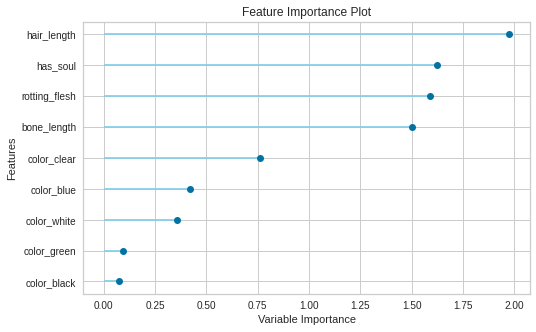

In [ ]:
plot_model(classification_lr,plot='feature')

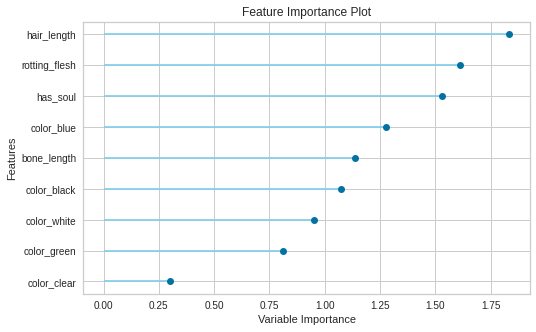

In [ ]:
plot_model(classification_lda, plot='feature')

**Logistic Regression  and LDA** performed quite good when feature selection is set and **hair_lenght is the most significant feature**

### **6.5. With Feature Selection and Normalization and PCA**

In [ ]:
setup(data=ghoul_train, target='type', feature_selection=True, normalize=True, pca=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,3877
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     Component_1  Component_2  ...  Component_6  Component_7
 0      -0.809622    -1.002997  ...    -0.176008    -0.036004
 1      -0.578100    -0.079954  ...     0.691950    -0.667864
 2      -2.420538    -0.650295  ...     0.836588     0.733971
 3      -3.014730     1.359161  ...     0.643194     0.693478
 4       0.007097     2.863506  ...     0.598587    -0.753393
 ..           ...          ...  ...          ...          ...
 366    -1.289223    -0.543627  ...     0.331779     0.012970
 367     0.198527     0.136884  ...     0.795942    -0.699765
 368    -0.347226     0.105211  ...    -0.330153    -0.020152
 369     1.342865     0.993098  ...    -0.361695    -0.016331
 370    -1.570739     2.378827  ...    -0.346672    -0.027544
 
 [371 rows x 7 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      Component_1  Component_2  ...  Component_6  Component_7
 194    -0.072639  

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Logistic Regression,0.784200,0.000000,0.786600,0.794700,0.773000,0.676100
1,Naive Bayes,0.784200,0.000000,0.787000,0.794400,0.774900,0.676400
2,Quadratic Discriminant Analysis,0.768800,0.000000,0.771800,0.781800,0.761500,0.653400
3,Linear Discriminant Analysis,0.768800,0.000000,0.769900,0.773700,0.755800,0.652600
4,Ridge Classifier,0.753200,0.000000,0.755600,0.761900,0.737100,0.629400
5,CatBoost Classifier,0.753200,0.000000,0.756900,0.768800,0.748900,0.629800
6,Extreme Gradient Boosting,0.745200,0.000000,0.749100,0.768100,0.742400,0.617600
7,Gradient Boosting Classifier,0.741500,0.000000,0.744900,0.762800,0.738500,0.612300
8,Extra Trees Classifier,0.734000,0.000000,0.736100,0.748400,0.730600,0.600500
9,Light Gradient Boosting Machine,0.733800,0.000000,0.738000,0.749600,0.727000,0.600200


In [ ]:
classification_lr=create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8462,0.0,0.8519,0.8471,0.8407,0.7694
1,0.7692,0.0,0.7778,0.8282,0.7507,0.6564
2,0.7692,0.0,0.7731,0.7635,0.7612,0.6541
3,0.8077,0.0,0.8148,0.8125,0.8043,0.7118
4,0.7692,0.0,0.7731,0.7858,0.7502,0.6533
5,0.8462,0.0,0.8519,0.8755,0.8323,0.7699
6,0.6538,0.0,0.6667,0.6269,0.6306,0.4823
7,0.7308,0.0,0.7176,0.7133,0.7104,0.5928
8,0.7692,0.0,0.7593,0.8053,0.7669,0.6510
9,0.8800,0.0,0.8796,0.8889,0.8822,0.8197


In [ ]:
tuned_classification_lr=tune_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.8077,0.0,0.8148,0.8115,0.7958,0.7124
1,0.7692,0.0,0.7778,0.8282,0.7507,0.6564
2,0.7692,0.0,0.7731,0.7635,0.7612,0.6541
3,0.8077,0.0,0.8148,0.8125,0.8043,0.7118
4,0.7692,0.0,0.7731,0.8071,0.7559,0.6526
5,0.8077,0.0,0.8102,0.8110,0.7957,0.7118
6,0.6923,0.0,0.7037,0.6747,0.6774,0.5398
7,0.6923,0.0,0.6806,0.6731,0.6784,0.5357
8,0.7692,0.0,0.7639,0.8156,0.7744,0.6518
9,0.8800,0.0,0.8796,0.8889,0.8822,0.8197


In [ ]:
evaluate_model(classification_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
classification_nb=create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.6923,0.0,0.7037,0.6857,0.6822,0.5398
1,0.8462,0.0,0.8519,0.8666,0.8445,0.7704
2,0.7692,0.0,0.7778,0.8282,0.7507,0.6564
3,0.7692,0.0,0.7778,0.7639,0.7647,0.6541
4,0.8077,0.0,0.8102,0.8173,0.7967,0.7111
5,0.8077,0.0,0.8102,0.8066,0.8054,0.7118
6,0.6154,0.0,0.6296,0.5868,0.5956,0.4248
7,0.8077,0.0,0.7963,0.8063,0.7924,0.7092
8,0.8462,0.0,0.8333,0.8935,0.8345,0.7668
9,0.8800,0.0,0.8796,0.8889,0.8822,0.8197


In [ ]:
tuned_classification_nb=tune_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.7308,0.0,0.7407,0.7206,0.7240,0.5965
1,0.8462,0.0,0.8519,0.8505,0.8408,0.7699
2,0.8462,0.0,0.8472,0.8623,0.8492,0.7684
3,0.7692,0.0,0.7685,0.8174,0.7751,0.6518
4,0.8462,0.0,0.8426,0.8601,0.8445,0.7679
5,0.8462,0.0,0.8472,0.8476,0.8409,0.7694
6,0.6538,0.0,0.6667,0.6269,0.6306,0.4823
7,0.7692,0.0,0.7639,0.7744,0.7671,0.6526
8,0.7308,0.0,0.7269,0.7692,0.7330,0.5956
9,0.8800,0.0,0.8796,0.8889,0.8822,0.8197


Models not performed exceedingly good as compared to earlier scenario

### **6.6. With Feature Selection and create clusters**

In [ ]:
setup(data=ghoul_train, target='type', feature_selection=True, create_clusters=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,1061
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     rotting_flesh  data_cluster_1  ...  color_white  color_blue
 0         0.350839             1.0  ...          0.0         0.0
 1         0.425868             0.0  ...          0.0         0.0
 2         0.354330             0.0  ...          0.0         0.0
 3         0.508723             0.0  ...          0.0         0.0
 4         0.875862             0.0  ...          0.0         0.0
 ..             ...             ...  ...          ...         ...
 366       0.391760             0.0  ...          0.0         1.0
 367       0.564836             0.0  ...          0.0         0.0
 368       0.501147             1.0  ...          0.0         0.0
 369       0.771286             1.0  ...          0.0         0.0
 370       0.768469             0.0  ...          1.0         0.0
 
 [371 rows x 9 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 371, dtype: int64,      rotting_flesh  data_cluster

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Linear Discriminant Analysis,0.730200,0.000000,0.731500,0.740000,0.717200,0.594800
1,Ridge Classifier,0.722500,0.000000,0.724500,0.742700,0.692600,0.583600
2,Extreme Gradient Boosting,0.722500,0.000000,0.725000,0.732300,0.719900,0.583700
3,Logistic Regression,0.714800,0.000000,0.716200,0.729900,0.695300,0.571700
4,CatBoost Classifier,0.707100,0.000000,0.710600,0.725100,0.706400,0.561000
5,Light Gradient Boosting Machine,0.702800,0.000000,0.705600,0.716900,0.701800,0.554600
6,Random Forest Classifier,0.699200,0.000000,0.703700,0.720800,0.699300,0.550000
7,Naive Bayes,0.699100,0.000000,0.700900,0.700100,0.688000,0.548200
8,Gradient Boosting Classifier,0.699100,0.000000,0.702800,0.718800,0.699400,0.549400
9,Ada Boost Classifier,0.695200,0.000000,0.699100,0.713900,0.691700,0.543300


Model results were average wrt to earlier experiments

### **6.7. Without Feature Selection and create clusters**

In [ ]:
setup(data=ghoul_train, target='type', create_clusters=True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,3277
1,Target Type,Multiclass
2,Label Encoded,"Ghost: 0, Ghoul: 1, Goblin: 2"
3,Original Data,"(371, 6)"
4,Missing Values,False
5,Numeric Features,4
6,Categorical Features,1
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(     bone_length  rotting_flesh  ...  data_cluster_4  data_cluster_5
 0       0.354512       0.350839  ...             0.0             0.0
 1       0.575560       0.425868  ...             1.0             0.0
 2       0.467875       0.354330  ...             0.0             0.0
 3       0.776652       0.508723  ...             0.0             0.0
 4       0.566117       0.875862  ...             1.0             0.0
 ..           ...            ...  ...             ...             ...
 366     0.458132       0.391760  ...             0.0             1.0
 367     0.331936       0.564836  ...             1.0             0.0
 368     0.481640       0.501147  ...             0.0             0.0
 369     0.294943       0.771286  ...             0.0             0.0
 370     0.670200       0.768469  ...             0.0             0.0
 
 [371 rows x 10 columns], 0      1
 1      2
 2      1
 3      1
 4      0
       ..
 366    2
 367    0
 368    1
 369    0
 370    1
 Name: type, Length: 37

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Linear Discriminant Analysis,0.741500,0.000000,0.744400,0.746900,0.729800,0.612300
1,Logistic Regression,0.725800,0.000000,0.729600,0.734500,0.701400,0.589100
2,Light Gradient Boosting Machine,0.722200,0.000000,0.722700,0.737500,0.721200,0.582500
3,Ridge Classifier,0.718500,0.000000,0.721300,0.720700,0.695100,0.577900
4,CatBoost Classifier,0.718300,0.000000,0.720800,0.733000,0.714800,0.577200
5,Gradient Boosting Classifier,0.710900,0.000000,0.713000,0.719800,0.709200,0.566200
6,Extreme Gradient Boosting,0.706900,0.000000,0.708300,0.712000,0.704400,0.560200
7,Random Forest Classifier,0.702800,0.000000,0.705100,0.717900,0.702500,0.553900
8,Extra Trees Classifier,0.699100,0.000000,0.701400,0.712900,0.696400,0.548400
9,Ada Boost Classifier,0.695200,0.000000,0.699500,0.718700,0.695900,0.543300


Model results were average wrt to earlier experiments

From various experiments using PyCaret, came to know following models could be good and can be tuned to acheive better results

- Logistic Regression
- SVM(Linear Kernel)
- Gradient Boosting Classifier
- Extreme Gradient Boosting Classifier
- Light Gradient Boosting Classifier

Also, Boosting and Voting Classifers can be used to further analyze the performance in ensemble scenarios.

Also, data seems to be in range, but normalization improved the result

hair_length is the most significant feature(though other features are also seems to be important)

## **7. Data Pre-Processing**

### **7.1. Label encoding for categorical columns**

In [ ]:
X_train=ghoul_train.drop('type', axis=1)
y_train=ghoul_train.loc[:,'type']

In [ ]:
X_train.shape

(371, 5)

In [ ]:
y_train.shape

(371,)

In [ ]:
le = preprocessing.LabelEncoder()

In [ ]:
X_train.head()

,bone_length,rotting_flesh,hair_length,has_soul,color
0,0.354512,0.350839,0.465761,0.781142,clear
1,0.575560,0.425868,0.531401,0.439899,green
2,0.467875,0.354330,0.811616,0.791225,black
3,0.776652,0.508723,0.636766,0.884464,black
4,0.566117,0.875862,0.418594,0.636438,green


In [ ]:
X_train.color.unique()

array(['clear', 'green', 'black', 'white', 'blue', 'blood'], dtype=object)

In [ ]:
X_train['color']=le.fit_transform(X_train['color'])

In [ ]:
X_train.color.unique()

array([3, 4, 0, 5, 2, 1])

In [ ]:
X_train.head()

,bone_length,rotting_flesh,hair_length,has_soul,color
0,0.354512,0.350839,0.465761,0.781142,3
1,0.575560,0.425868,0.531401,0.439899,4
2,0.467875,0.354330,0.811616,0.791225,0
3,0.776652,0.508723,0.636766,0.884464,0
4,0.566117,0.875862,0.418594,0.636438,4


In [ ]:
X_train.color.unique()

array([3, 4, 0, 5, 2, 1])

In [ ]:
y_train.unique()

array(['Ghoul', 'Goblin', 'Ghost'], dtype=object)

In [ ]:
y_train=le.fit_transform(y_train)

In [ ]:
y_train.shape

(371,)

In [ ]:
np.unique(y_train)

array([0, 1, 2])

### **7.2. Removing outliers**

We can maintain following datasets for experiments :

- Normal data
- Data without outliers (as per IQR result and KNN from PYOD - though PyCaret did not perform well after removing outliers, but can experiment)


In [ ]:
#Normal data
print(X_train.head())
print(pd.DataFrame(y_train).head())

   bone_length  rotting_flesh  hair_length  has_soul  color
0     0.354512       0.350839     0.465761  0.781142      3
1     0.575560       0.425868     0.531401  0.439899      4
2     0.467875       0.354330     0.811616  0.791225      0
3     0.776652       0.508723     0.636766  0.884464      0
4     0.566117       0.875862     0.418594  0.636438      4
   0
0  1
1  2
2  1
3  1
4  0
   bone_length  rotting_flesh  hair_length  has_soul  color
0     0.471774       0.387937     0.706087  0.698537      0
1     0.427332       0.645024     0.565558  0.451462      5
2     0.549602       0.491931     0.660387  0.449809      0
3     0.638095       0.682867     0.471409  0.356924      5
4     0.361762       0.583997     0.377256  0.276364      0


In [ ]:
#Data without outliers
print(X_train.shape)
print (y_train.shape)
print("**********************")
X_train_noout1=X_train.drop([52, 166, 174, 194, 266])
y_train_noout1=np.delete(y_train, [52, 166, 174, 194, 266])
print(X_train_noout1.shape)
print(y_train_noout1.shape)
print("**********************")
X_train_noout2=X_train.drop([3, 52, 66, 82, 166, 177, 196, 204, 249, 284, 295, 350])
y_train_noout2=np.delete(y_train, [3, 52, 66, 82, 166, 177, 196, 204, 249, 284, 295, 350])
print(X_train_noout2.shape)
print(y_train_noout2.shape)
print("**********************")
X_train_noout3=X_train.drop([166])
y_train_noout3=np.delete(y_train, [166])
print(X_train_noout3.shape)
print(y_train_noout3.shape)
print("**********************")

(371, 5)
(371,)
**********************
(366, 5)
(366,)
**********************
(359, 5)
(359,)
**********************
(370, 5)
(370,)
**********************


### **7.3. LDA Transformation**

Though our data has only 4 input features, but still can experiment with LDA if any feature is prominent in modelling

In [ ]:
def select_n_components(var_ratio, goal_var):
  total_variance=0
  n_comp=0

  for explained_variance in var_ratio:
    total_variance  += explained_variance

    n_comp += 1

    if total_variance>=goal_var:
      break

    return n_comp

In [ ]:
def get_lda_comp(X, y):
  lda=LDA(n_components=None)

  X_lda=lda.fit(X, y)

  lda_var_ratios=lda.explained_variance_ratio_

  print(select_n_components(lda_var_ratios, 100))

In [ ]:
get_lda_comp(X_train, y_train)

1


In [ ]:
get_lda_comp(X_train_noout1, y_train_noout1)

1


In [ ]:
get_lda_comp(X_train_noout2, y_train_noout2)

1


In [ ]:
get_lda_comp(X_train_noout3, y_train_noout3)

1


So number of compoenents for LDA (further in pipeline) can be considered as 1


## **8. Prepare and process various Machine Learning Models - Baseline**

From PyCaret we observed that following models provided the satisfactory results,

- Logistic Regression
- Random Forest Classifier
- Decision Tree Classifier
- Ada Boost Classifier
- XGBoost Classifier
- Extreme Gradient Boosting Classifier
- Light Gradient Boosting Classifier


Further, ensembling(Bagging) and Voting Classifier further improved the performance.

So, we can analyze the above models along with few which were not too poorly performed in PyCaret like Ridge Classifier and LDA

### **8.1. Baseline Models**

In [ ]:
MLA_columns = ['MLA Name', 'MLA Parameters','MLA Train Accuracy Mean', 'MLA Test Accuracy Mean', 'MLA Recall', 'MLA Precision', 'MLA F1 Score']
MLA_compare = pd.DataFrame(columns = MLA_columns)

def train_predict_default_ml(X, y, num_comp, stratified):
  row_index=0
  best_accuracy=0
  best_recall=0
  best_precision=0
  best_f1=0

  if (True==stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0)
  #print(X_tr.shape)
  #print(X_ts.shape)
  #print(y_tr.shape)
  #print(y_ts.shape)

  #Logistic Regression CV
  pipe_lrv_1=Pipeline([('classifer1', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_2=Pipeline([('scaler2', StandardScaler()),
                      ('classifer2', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_3=Pipeline([('scaler3', Normalizer()),
                      ('classifer3', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_4=Pipeline([('scaler4', MinMaxScaler()),
                      ('classifer4', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_5=Pipeline([('scaler5', MinMaxScaler()),
                      ('dim_red5', LDA(n_components=num_comp)),
                      ('classifer5', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_6=Pipeline([('scaler6', Normalizer()),
                      ('dim_red6', LDA(n_components=num_comp)),
                      ('classifer6', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_7=Pipeline([('scaler7', StandardScaler()),
                      ('dim_red7', LDA(n_components=num_comp)),
                      ('classifer7', LogisticRegressionCV(cv=5, random_state=0))])
  pipe_lrv_8=Pipeline([('dim_red8', LDA(n_components=num_comp)),
                      ('classifer8', LogisticRegressionCV(cv=5, random_state=0))])
  
  #Logistic Regression
  pipe_lr_1=Pipeline([('classifer9', LogisticRegression(random_state=0))])
  pipe_lr_2=Pipeline([('scaler10', StandardScaler()),
                      ('classifer10', LogisticRegression(random_state=0))])
  pipe_lr_3=Pipeline([('scaler11', Normalizer()),
                      ('classifer11', LogisticRegression(random_state=0))])
  pipe_lr_4=Pipeline([('scaler12', MinMaxScaler()),
                      ('classifer12', LogisticRegression(random_state=0))])
  pipe_lr_5=Pipeline([('scaler13', MinMaxScaler()),
                      ('dim_red13', LDA(n_components=num_comp)),
                      ('classifer13', LogisticRegression(random_state=0))])
  pipe_lr_6=Pipeline([('scaler14', Normalizer()),
                      ('dim_red14', LDA(n_components=num_comp)),
                      ('classifer14', LogisticRegression(random_state=0))])
  pipe_lr_7=Pipeline([('scaler15', StandardScaler()),
                      ('dim_red15', LDA(n_components=num_comp)),
                      ('classifer15', LogisticRegression(random_state=0))])
  pipe_lr_8=Pipeline([('dim_red16', LDA(n_components=num_comp)),
                      ('classifer16', LogisticRegression(random_state=0))])
  
  #Decision Tree
  pipe_dt_1=Pipeline([('classifer17', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_2=Pipeline([('scaler18', StandardScaler()),
                      ('classifer18', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_3=Pipeline([('scaler19', Normalizer()),
                      ('classifer19', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_4=Pipeline([('scaler20', MinMaxScaler()),
                      ('classifer20', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_5=Pipeline([('scaler21', MinMaxScaler()),
                      ('dim_red21', LDA(n_components=num_comp)),
                      ('classifer21', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_6=Pipeline([('scaler22', Normalizer()),
                      ('dim_red22', LDA(n_components=num_comp)),
                      ('classifer22', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_7=Pipeline([('scaler23', StandardScaler()),
                      ('dim_red23', LDA(n_components=num_comp)),
                      ('classifer23', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  pipe_dt_8=Pipeline([('dim_red24', LDA(n_components=num_comp)),
                      ('classifer24', DecisionTreeClassifier(random_state=0, criterion='entropy'))])
  
  #Random Forest
  pipe_rf_1=Pipeline([('classifer25', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_2=Pipeline([('scaler26', StandardScaler()),
                      ('classifer26', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_3=Pipeline([('scaler27', Normalizer()),
                      ('classifer27', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_4=Pipeline([('scaler28', MinMaxScaler()),
                      ('classifer28', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_5=Pipeline([('scaler29', MinMaxScaler()),
                      ('dim_red29', LDA(n_components=num_comp)),
                      ('classifer29', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_6=Pipeline([('scaler30', Normalizer()),
                      ('dim_red30', LDA(n_components=num_comp)),
                      ('classifer30', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_7=Pipeline([('scaler31', StandardScaler()),
                      ('dim_red31', LDA(n_components=num_comp)),
                      ('classifer31', RandomForestClassifier(random_state=0, criterion='entropy'))])
  pipe_rf_8=Pipeline([('dim_red32', LDA(n_components=num_comp)),
                      ('classifer32', RandomForestClassifier(random_state=0, criterion='entropy'))])
  
  pipe_et_1=Pipeline([('classifer33', ExtraTreesClassifier(random_state=0))])
  pipe_et_2=Pipeline([('scaler33', StandardScaler()),
                      ('classifer33', ExtraTreesClassifier(random_state=0))])
  pipe_et_3=Pipeline([('scaler34', Normalizer()),
                      ('classifer34', ExtraTreesClassifier(random_state=0))])
  pipe_et_4=Pipeline([('scaler35', MinMaxScaler()),
                      ('classifer35', ExtraTreesClassifier(random_state=0))])
  pipe_et_5=Pipeline([('scaler36', MinMaxScaler()),
                      ('dim_red36', LDA(n_components=num_comp)),
                      ('classifer36', ExtraTreesClassifier(random_state=0))])
  pipe_et_6=Pipeline([('scaler37', Normalizer()),
                      ('dim_red37', LDA(n_components=num_comp)),
                      ('classifer37', ExtraTreesClassifier(random_state=0))])
  pipe_et_7=Pipeline([('scaler38', StandardScaler()),
                      ('dim_red38', LDA(n_components=num_comp)),
                      ('classifer38', ExtraTreesClassifier(random_state=0))])
  pipe_et_8=Pipeline([('dim_red39', LDA(n_components=num_comp)),
                      ('classifer39', ExtraTreesClassifier(random_state=0))])
  
  pipe_gb_1=Pipeline([('classifer40', GradientBoostingClassifier(random_state=0))])
  pipe_gb_2=Pipeline([('scaler41', StandardScaler()),
                      ('classifer41', GradientBoostingClassifier(random_state=0))])
  pipe_gb_3=Pipeline([('scaler42', Normalizer()),
                      ('classifer42', GradientBoostingClassifier(random_state=0))])
  pipe_gb_4=Pipeline([('scaler43', MinMaxScaler()),
                      ('classifer43', GradientBoostingClassifier(random_state=0))])
  pipe_gb_5=Pipeline([('scaler44', MinMaxScaler()),
                      ('dim_red44', LDA(n_components=num_comp)),
                      ('classifer44', GradientBoostingClassifier(random_state=0))])
  pipe_gb_6=Pipeline([('scaler45', Normalizer()),
                      ('dim_red45', LDA(n_components=num_comp)),
                      ('classifer45', GradientBoostingClassifier(random_state=0))])
  pipe_gb_7=Pipeline([('scaler46', StandardScaler()),
                      ('dim_red46', LDA(n_components=num_comp)),
                      ('classifer46', GradientBoostingClassifier(random_state=0))])
  pipe_gb_8=Pipeline([('dim_red47', LDA(n_components=num_comp)),
                      ('classifer47', GradientBoostingClassifier(random_state=0))])
  
  pipe_lgbm_1=Pipeline([('classifer48', LGBMClassifier(random_state=0))])
  pipe_lgbm_2=Pipeline([('scaler49', StandardScaler()),
                      ('classifer49', LGBMClassifier(random_state=0))])
  pipe_lgbm_3=Pipeline([('scaler50', Normalizer()),
                      ('classifer50', LGBMClassifier(random_state=0))])
  pipe_lgbm_4=Pipeline([('scaler51', MinMaxScaler()),
                      ('classifer51', LGBMClassifier(random_state=0))])
  pipe_lgbm_5=Pipeline([('scaler52', MinMaxScaler()),
                      ('dim_red52', LDA(n_components=num_comp)),
                      ('classifer52', LGBMClassifier(random_state=0))])
  pipe_lgbm_6=Pipeline([('scaler53', Normalizer()),
                      ('dim_red53', LDA(n_components=num_comp)),
                      ('classifer53', LGBMClassifier(random_state=0))])
  pipe_lgbm_7=Pipeline([('scaler54', StandardScaler()),
                      ('dim_red54', LDA(n_components=num_comp)),
                      ('classifer54', LGBMClassifier(random_state=0))])
  pipe_lgbm_8=Pipeline([('dim_red55', LDA(n_components=num_comp)),
                      ('classifer55', LGBMClassifier(random_state=0))])
  
  pipe_xgb_1=Pipeline([('classifer48', XGBClassifier(random_state=0))])
  pipe_xgb_2=Pipeline([('scaler49', StandardScaler()),
                      ('classifer49', XGBClassifier(random_state=0))])
  pipe_xgb_3=Pipeline([('scaler50', Normalizer()),
                      ('classifer50', XGBClassifier(random_state=0))])
  pipe_xgb_4=Pipeline([('scaler51', MinMaxScaler()),
                     ('classifer51', XGBClassifier(random_state=0))])
  pipe_xgb_5=Pipeline([('scaler52', MinMaxScaler()),
                      ('dim_red52', LDA(n_components=num_comp)),
                      ('classifer52', XGBClassifier(random_state=0))])
  pipe_xgb_6=Pipeline([('scaler53', Normalizer()),
                      ('dim_red53', LDA(n_components=num_comp)),
                      ('classifer53', XGBClassifier(random_state=0))])
  pipe_xgb_7=Pipeline([('scaler54', StandardScaler()),
                      ('dim_red54', LDA(n_components=num_comp)),
                      ('classifer54', XGBClassifier(random_state=0))])
  pipe_xgb_8=Pipeline([('dim_red55', LDA(n_components=num_comp)),
                      ('classifer55', XGBClassifier(random_state=0))])

  #SVC
  pipe_svcl_1=Pipeline([('classifer55', SVC(kernel='linear',random_state=0))])
  pipe_svcl_2=Pipeline([('scaler56', StandardScaler()),
                      ('classifer56', SVC(kernel='linear',random_state=0))])
  pipe_svcl_3=Pipeline([('scaler57', Normalizer()),
                      ('classifer57', SVC(kernel='linear',random_state=0))])
  pipe_svcl_4=Pipeline([('scaler58', MinMaxScaler()),
                     ('classifer58', SVC(kernel='linear',random_state=0))])
  pipe_svcl_5=Pipeline([('scaler59', MinMaxScaler()),
                      ('dim_red59', LDA(n_components=num_comp)),
                      ('classifer59', SVC(kernel='linear',random_state=0))])
  pipe_svcl_6=Pipeline([('scaler60', Normalizer()),
                      ('dim_red60', LDA(n_components=num_comp)),
                      ('classifer60', SVC(kernel='linear',random_state=0))])
  pipe_svcl_7=Pipeline([('scaler61', StandardScaler()),
                      ('dim_red61', LDA(n_components=num_comp)),
                      ('classifer61', SVC(kernel='linear',random_state=0))])
  pipe_svcl_8=Pipeline([('dim_red62', LDA(n_components=num_comp)),
                      ('classifer62', SVC(kernel='linear',random_state=0))])
  
  #SVC
  pipe_svcr_1=Pipeline([('classifer63', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_2=Pipeline([('scaler64', StandardScaler()),
                      ('classifer64', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_3=Pipeline([('scaler65', Normalizer()),
                      ('classifer65', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_4=Pipeline([('scaler66', MinMaxScaler()),
                     ('classifer66', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_5=Pipeline([('scaler67', MinMaxScaler()),
                      ('dim_red67', LDA(n_components=num_comp)),
                      ('classifer67', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_6=Pipeline([('scaler68', Normalizer()),
                      ('dim_red68', LDA(n_components=num_comp)),
                      ('classifer68', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_7=Pipeline([('scaler69', StandardScaler()),
                      ('dim_red69', LDA(n_components=num_comp)),
                      ('classifer69', SVC(kernel='rbf',random_state=0))])
  pipe_svcr_8=Pipeline([('dim_red70', LDA(n_components=num_comp)),
                      ('classifer70', SVC(kernel='rbf',random_state=0))])
  
    #SVC
  pipe_svcp_1=Pipeline([('classifer71', SVC(kernel='poly',random_state=0))])
  pipe_svcp_2=Pipeline([('scaler72', StandardScaler()),
                      ('classifer72', SVC(kernel='poly',random_state=0))])
  pipe_svcp_3=Pipeline([('scaler73', Normalizer()),
                      ('classifer73', SVC(kernel='poly',random_state=0))])
  pipe_svcp_4=Pipeline([('scaler74', MinMaxScaler()),
                     ('classifer74', SVC(kernel='poly',random_state=0))])
  pipe_svcp_5=Pipeline([('scaler75', MinMaxScaler()),
                     ('dim_red75', LDA(n_components=num_comp)),
                      ('classifer75', SVC(kernel='poly',random_state=0))])
  pipe_svcp_6=Pipeline([('scaler76', Normalizer()),
                      ('dim_red76', LDA(n_components=num_comp)),
                      ('classifer76', SVC(kernel='poly',random_state=0))])
  pipe_svcp_7=Pipeline([('scaler77', StandardScaler()),
                      ('dim_red77', LDA(n_components=num_comp)),
                      ('classifer77', SVC(kernel='poly',random_state=0))])
  pipe_svcp_8=Pipeline([('dim_red78', LDA(n_components=num_comp)),
                      ('classifer78', SVC(kernel='poly',random_state=0))])
  #Ada Boost
  pipe_ada_1=Pipeline([('classifer48', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_2=Pipeline([('scaler49', StandardScaler()),
                      ('classifer49', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_3=Pipeline([('scaler50', Normalizer()),
                      ('classifer50', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_4=Pipeline([('scaler51', MinMaxScaler()),
                     ('classifer51', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_5=Pipeline([('scaler52', MinMaxScaler()),
                      ('dim_red52', LDA(n_components=num_comp)),
                      ('classifer52', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_6=Pipeline([('scaler53', Normalizer()),
                      ('dim_red53', LDA(n_components=num_comp)),
                      ('classifer53', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_7=Pipeline([('scaler54', StandardScaler()),
                      ('dim_red54', LDA(n_components=num_comp)),
                      ('classifer54', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  pipe_ada_8=Pipeline([('dim_red55', LDA(n_components=num_comp)),
                      ('classifer55', AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0))])
  
  pipelines=[pipe_lr_1,pipe_lr_2,pipe_lr_3,pipe_lr_4,pipe_lr_5,pipe_lr_6,pipe_lr_7,pipe_lr_8,
             pipe_lrv_1,pipe_lrv_2,pipe_lrv_3,pipe_lrv_4,pipe_lrv_5,pipe_lrv_6,pipe_lrv_7,pipe_lrv_8,
             pipe_dt_1,pipe_dt_2,pipe_dt_3,pipe_dt_4,pipe_dt_5,pipe_dt_6,pipe_dt_7,pipe_dt_8,
             pipe_rf_1,pipe_rf_2,pipe_rf_3,pipe_rf_4,pipe_rf_5,pipe_rf_6,pipe_rf_7,pipe_rf_8,
             pipe_et_1,pipe_et_2,pipe_et_3,pipe_et_4,pipe_et_5,pipe_et_6,pipe_et_7,pipe_et_8,
             pipe_gb_1,pipe_gb_2,pipe_gb_3,pipe_gb_4,pipe_gb_5,pipe_gb_6,pipe_gb_7,pipe_gb_8,
             pipe_lgbm_1,pipe_lgbm_2,pipe_lgbm_3,pipe_lgbm_4,pipe_lgbm_5,pipe_lgbm_6,pipe_lgbm_7,pipe_lgbm_8,
             pipe_xgb_1,pipe_xgb_2,pipe_xgb_3,pipe_xgb_4,pipe_xgb_5,pipe_xgb_6,pipe_xgb_7,pipe_xgb_8,
             pipe_svcl_1,pipe_svcl_2,pipe_svcl_3,pipe_svcl_4,pipe_svcl_5,pipe_svcl_6,pipe_svcl_7,pipe_svcl_8,
             pipe_svcr_1,pipe_svcr_2,pipe_svcr_3,pipe_svcr_4,pipe_svcr_5,pipe_svcr_6,pipe_svcr_7,pipe_svcr_8,
             pipe_svcp_1,pipe_svcp_2,pipe_svcp_3,pipe_svcp_4,pipe_svcp_5,pipe_svcp_6,pipe_svcp_7,pipe_svcp_8,
             pipe_ada_1,pipe_ada_2,pipe_ada_3,pipe_ada_4,pipe_ada_5,pipe_ada_6,pipe_ada_7,pipe_ada_8]

  for pipe in pipelines:
    pipe.fit(X_tr, y_tr)
  
  for i,model in enumerate(pipelines):
    if (i>=0 and i<=7):
      MLA_compare.loc[row_index, 'MLA Name']='Logistic Regression'
    elif (i>=8 and i<=15):
      MLA_compare.loc[row_index, 'MLA Name']='Logistic Regression CV'
    elif (i>=16 and i<=23):
      MLA_compare.loc[row_index, 'MLA Name']='Decision Tree'
    elif (i>=24 and i<=31):
      MLA_compare.loc[row_index, 'MLA Name']='Random Forest'
    elif (i>=32 and i<=39):
      MLA_compare.loc[row_index, 'MLA Name']='Extra Trees'
    elif (i>=40 and i<=47):
      MLA_compare.loc[row_index, 'MLA Name']='Gradient Boosting'
    elif (i>=48 and i<=55):
      MLA_compare.loc[row_index, 'MLA Name']='Light Gradient Boosting'
    elif (i>=56 and i<=63):
      MLA_compare.loc[row_index, 'MLA Name']='Extreme Gradient Boosting'
    elif (i>=64 and i<=71):
      MLA_compare.loc[row_index, 'MLA Name']='SVC-linear'
    elif (i>=72 and i<=79):
      MLA_compare.loc[row_index, 'MLA Name']='SVC-rbf'
    elif (i>=80 and i<=87):
      MLA_compare.loc[row_index, 'MLA Name']='SVC-poly'
    else:
      MLA_compare.loc[row_index, 'MLA Name']='Ada Boost'

    MLA_compare.loc[row_index, 'MLA Parameters']=str(model.get_params())
    MLA_compare.loc[row_index, 'MLA Train Accuracy Mean']=model.score(X_tr,y_tr)
    MLA_compare.loc[row_index, 'MLA Test Accuracy Mean']=model.score(X_ts,y_ts)
    y_pred = model.predict(X_ts)
    MLA_compare.loc[row_index, 'MLA Recall']=metrics.recall_score(y_ts, y_pred, average='weighted')
    MLA_compare.loc[row_index, 'MLA Precision']=metrics.precision_score(y_ts, y_pred,average='weighted')
    MLA_compare.loc[row_index, 'MLA F1 Score']=metrics.f1_score(y_ts, y_pred, average='weighted')

    row_index=row_index+1

    if (model.score(X_ts,y_ts)>best_accuracy):
      best_accuracy=model.score(X_ts,y_ts,)
      best_accpipeline=model

    if (metrics.recall_score(y_ts, y_pred, average='weighted')>best_recall):
      best_recall=metrics.recall_score(y_ts, y_pred, average='weighted')
      bestrecpipeline=model

    if (metrics.precision_score(y_ts, y_pred, average='weighted')>best_precision):
      best_precision=metrics.precision_score(y_ts, y_pred, average='weighted')
      bestprcpipeline=model

    if (metrics.f1_score(y_ts, y_pred, average='weighted')>best_f1):
      best_f1=metrics.f1_score(y_ts, y_pred, average='weighted')
      bestf1pipeline=model

    #MLA_compare.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False, inplace = True)
    #MLA_compare.reset_index(drop=True, inplace=True)
    MLA_compare['Difference']= (MLA_compare['MLA Test Accuracy Mean']-MLA_compare['MLA Train Accuracy Mean'])*100

  #print("\nBest Model for accuracy :\n", best_accpipeline)
  #print("\n\n\nBest Model for recall :\n", bestrecpipeline)
  #print("\n\n\nBest Model for precision :\n", bestprcpipeline)
  #print("\n\n\nBest Model for f1score :\n", bestf1pipeline)

  return MLA_compare

In [ ]:
model1=train_predict_default_ml(X_train, y_train, 1, 0)

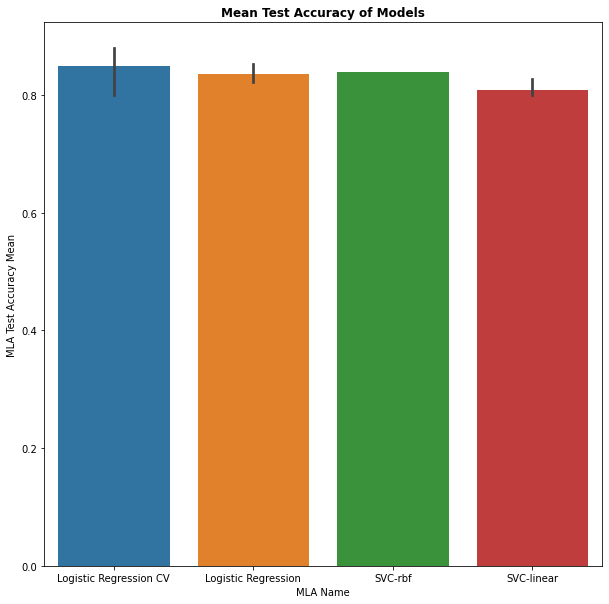

In [ ]:
model_test_accuracy=model1.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models", fontdict={'fontweight':'bold'})
plt.show()

Logsitic Regression, Logistic Regression CV and SVM(linear and rbf kernel) have more than 80% of test accuracy, so can analyze further using hyper-parameter tuning and Ensemble methods

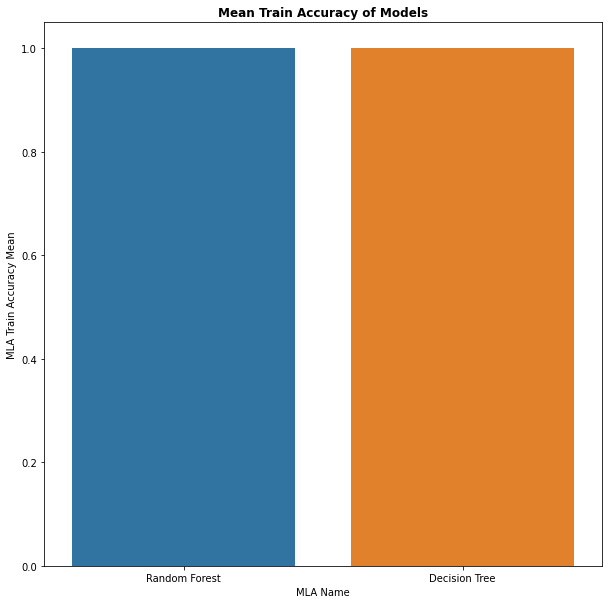

In [ ]:
model_train_accuracy=model1.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed well in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model2=train_predict_default_ml(X_train, y_train, 1, 1)

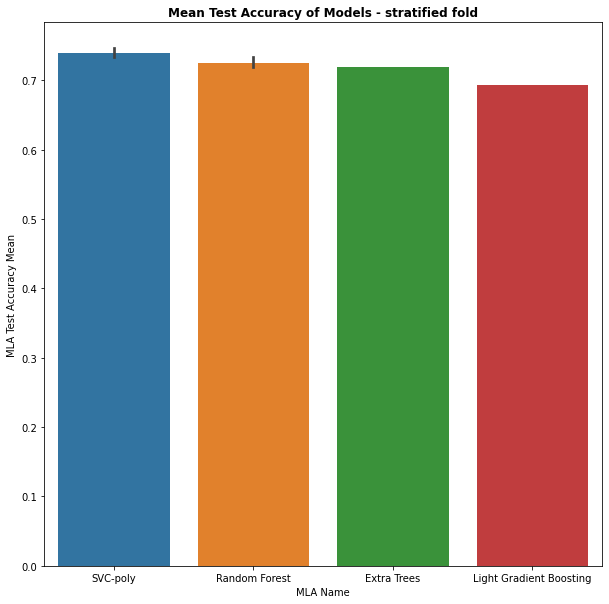

In [ ]:
model_test_accuracy=model2.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - stratified fold", fontdict={'fontweight':'bold'})
plt.show()

SVC-poly, Random Forest and Extra trees have fine accuracies on test data set, so can be optimized further

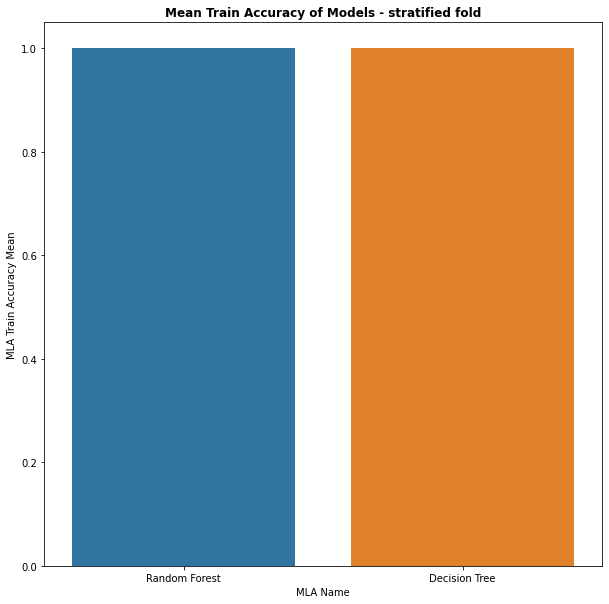

In [ ]:
model_train_accuracy=model2.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model3=train_predict_default_ml(X_train_noout1, y_train_noout1, 1, 0)

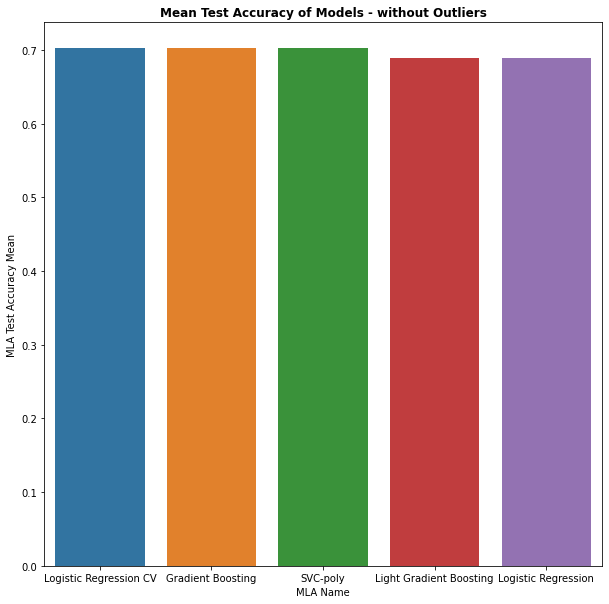

In [ ]:
model_test_accuracy=model3.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

In this Data set without outliers, models have maximum accuracy of around 70%, we got better in dataset with outliers, so better we can analyze the models with outliers present in the dataset, as they are not many and also not an outlier by huge margin

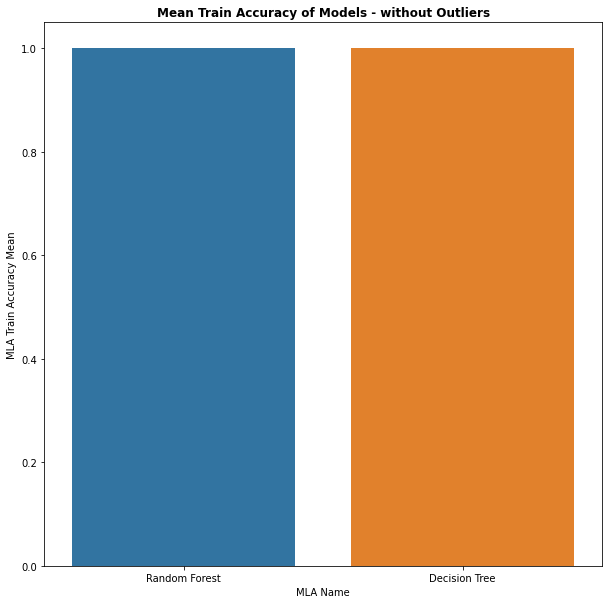

In [ ]:
model_train_accuracy=model3.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model4=train_predict_default_ml(X_train_noout1, y_train_noout1, 1, 1)

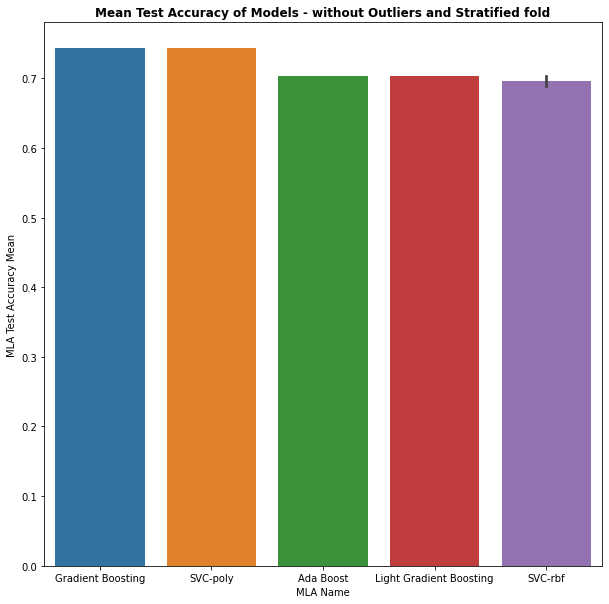

In [ ]:
model_test_accuracy=model4.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Only Gradient Boosting and SVC-poly have accuracy more than 70% when dataset without outlier and with stratrified kfold

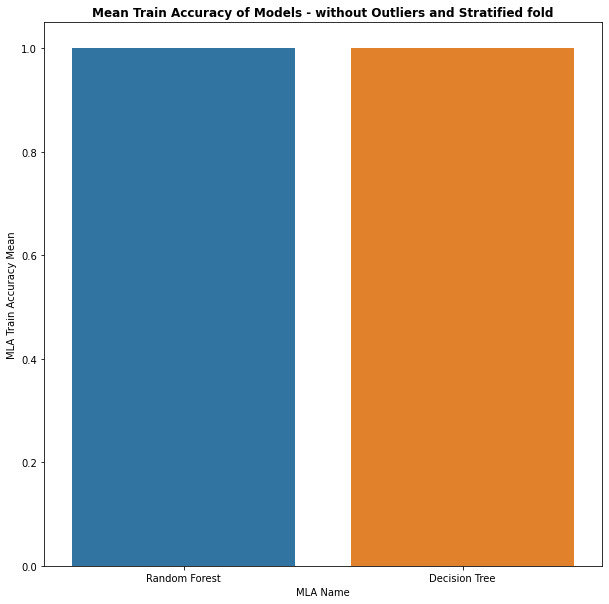

In [ ]:
model_train_accuracy=model4.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model5=train_predict_default_ml(X_train_noout2, y_train_noout2, 1, 0)

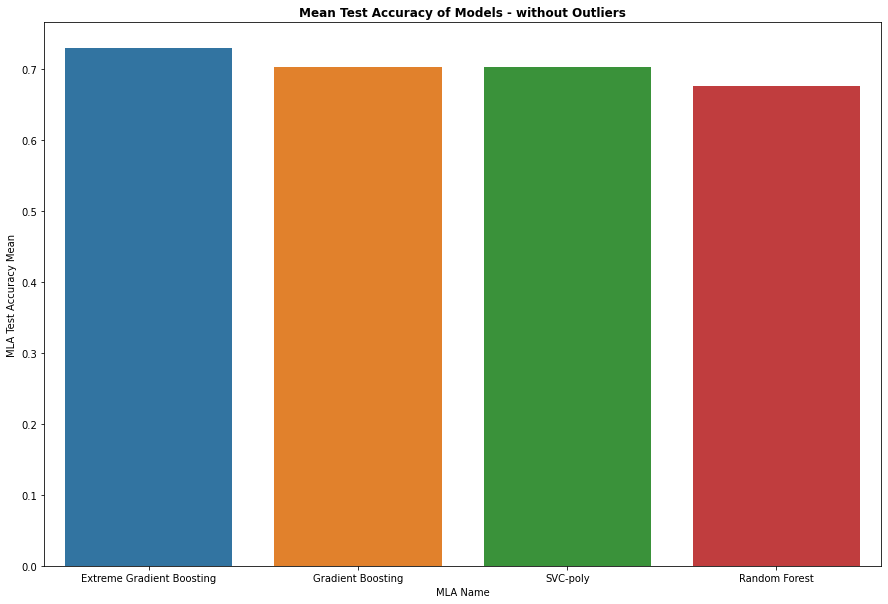

In [ ]:
model_test_accuracy=model5.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

Only Extreme Gradient Boosting have more than 70% accuracy, so can optimize it further

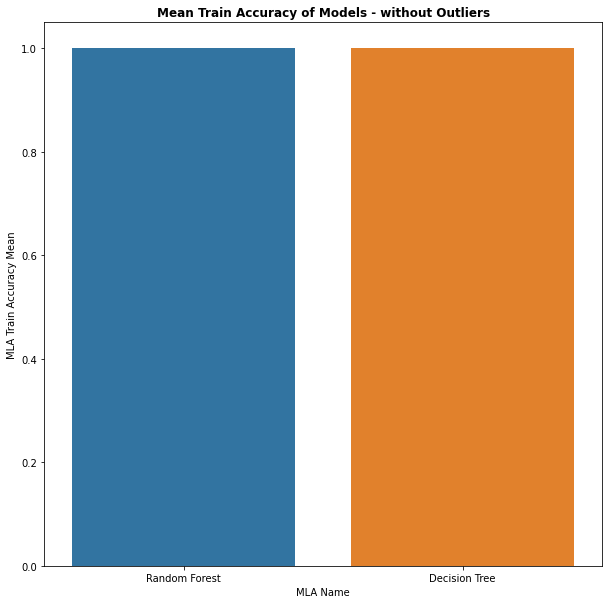

In [ ]:
model_train_accuracy=model5.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model6=train_predict_default_ml(X_train_noout2, y_train_noout2, 1, 1)

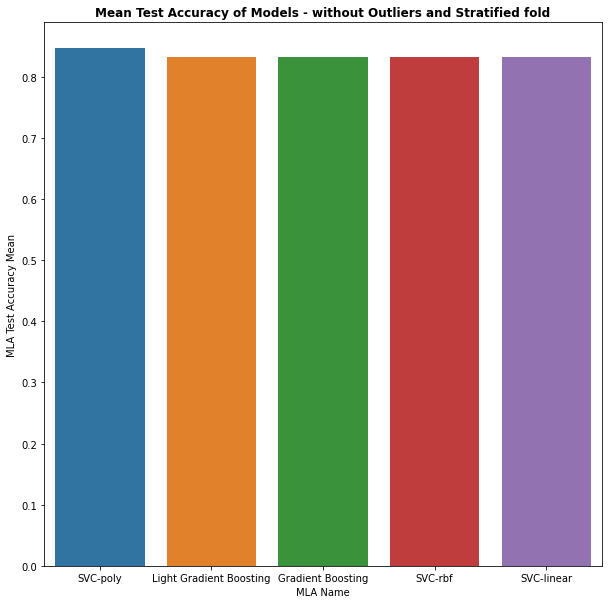

In [ ]:
model_test_accuracy=model6.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

The dataset without outliers and with stratified kfold , all the top models have accuracies more than 80%, so can be optmized further 

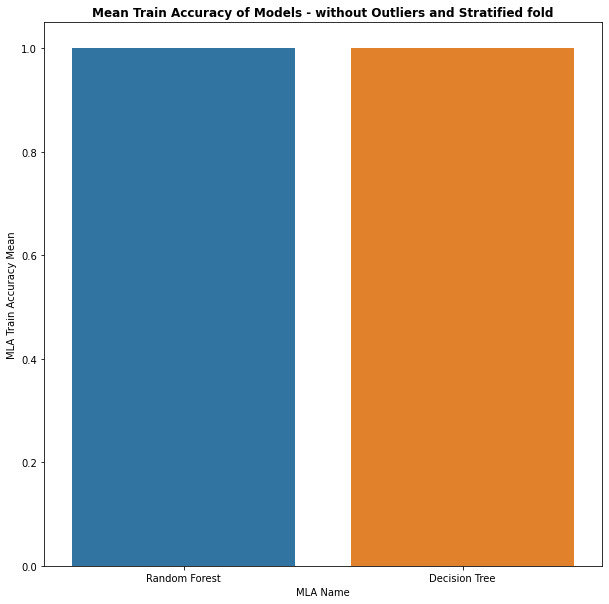

In [ ]:
model_train_accuracy=model6.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model7=train_predict_default_ml(X_train_noout3, y_train_noout3, 1, 0)

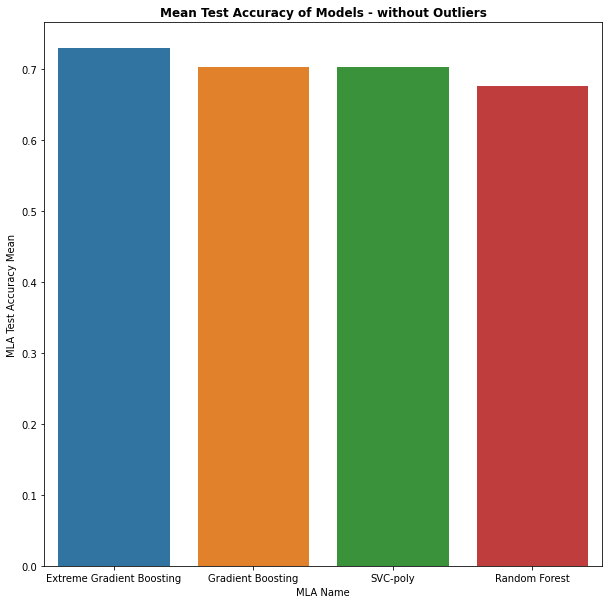

In [ ]:
model_test_accuracy=model7.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

Only Extreme Gradient Boosting perfomed fine

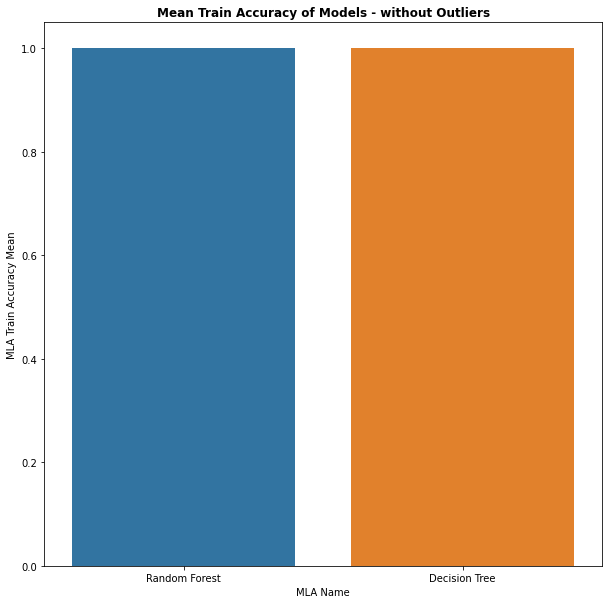

In [ ]:
model_train_accuracy=model7.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

In [ ]:
model8=train_predict_default_ml(X_train_noout3, y_train_noout3, 1, 1)

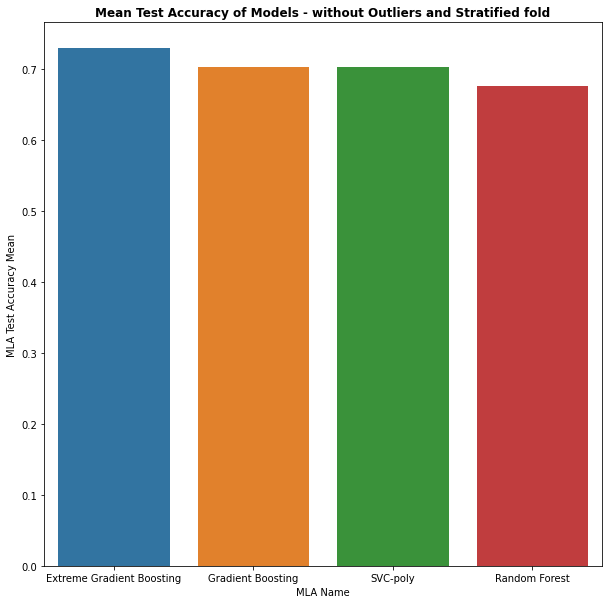

In [ ]:
model_test_accuracy=model8.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False)
model_test_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Test Accuracy Mean', data=model_test_accuracy.head(10))
plt.title("Mean Test Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Only Extreme Gradient Boosting performed fine

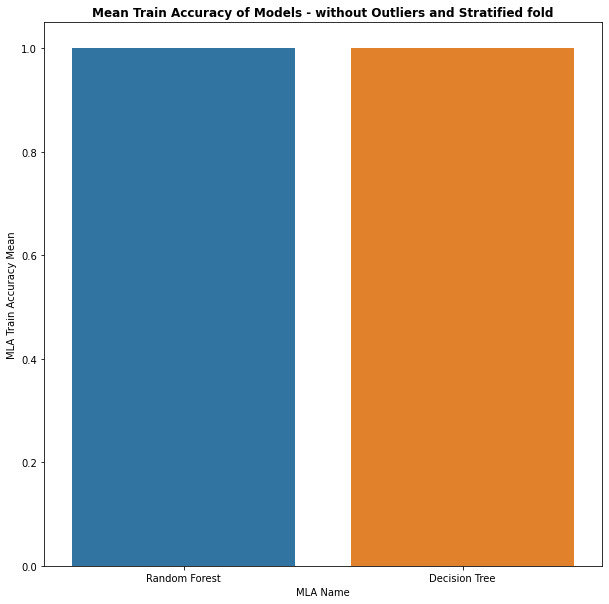

In [ ]:
model_train_accuracy=model8.sort_values(by = ['MLA Train Accuracy Mean'], ascending = False)
model_train_accuracy.reset_index(drop=True, inplace=True)
plt.figure(figsize=(10,10))
sns.barplot(x='MLA Name', y='MLA Train Accuracy Mean', data=model_train_accuracy.head(10))
plt.title("Mean Train Accuracy of Models - without Outliers and Stratified fold", fontdict={'fontweight':'bold'})
plt.show()

Random Forest and Classifier have tendency to overfit which is quite evident here, the accuracy on train data is almost 100% but not performed with similar in test accuracy.

So, can further analyze using ensemble methods or hyper parameter tuning

**Conclusion on base models performance**

Below Models performed fine on train and test dataset in terms of accuracies and can be optimized further using  -hyper parameter tuning, Ensembling methods

- Logsitic Regression
- Logsitic RegressionCV
- SVC-rbf
- SVC-linear
- Random Forest
- Extra Trees
- Gradient Boosting
- LightGBM
- SVC-poly
- Extreme Gradient Boosting

Further, dataset without outliers are performed better when splitted using Stratified k-fold technique, so same can be used further for this data set.

But, the data with the outliers are performed fine, when splitted without stratified k fold, but can use both techniques with this data set

### **8.2. Applying Ensemble technique on the shortlisted baseline models**

#### **8.2.1 Voting Classifier**

In [ ]:
from sklearn.ensemble import VotingClassifier

In [ ]:
def apply_voting_classifier(X,y, stratified, lda, scaling):

  if (scaling):
    scaler=StandardScaler()
    X_new=scaler.fit_transform(X)
  else:
      X_new=X.copy()
  
  if (lda):
    lda=LDA(n_components=1)
    X_new=lda.fit(X_new,y).transform(X_new)
     
  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0)
  
  clf1=LogisticRegression(random_state=0)
  clf2=LogisticRegressionCV(cv=5, random_state=0)
  clf3=SVC(kernel='linear',random_state=0)
  clf4=SVC(kernel='rbf',random_state=0)
  clf5=SVC(kernel='poly',random_state=0)
  clf6=RandomForestClassifier(random_state=0, criterion='entropy')
  clf7=ExtraTreesClassifier(random_state=0)
  clf8=GradientBoostingClassifier(random_state=0)
  clf9=LGBMClassifier(random_state=0)
  clf10=XGBClassifier(random_state=0)
  clf11=AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0)

  votingclf=VotingClassifier(estimators=[('lr', clf1), 
                              ('lrcv', clf2), 
                              ('svcl', clf3), 
                              ('svcr', clf4), 
                              ('svcp', clf5),
                              ('rf', clf6),
                              ('et', clf7),
                              ('gb', clf8),
                              ('lgbm',clf9),
                              ('xgb', clf10),
                              ('ada', clf11)], voting='hard', n_jobs=-1)
  votingclf=votingclf.fit(X_tr,y_tr)

  y_pred_train=votingclf.predict(X_tr)
  y_pred_test=votingclf.predict(X_ts)

  #print("Train Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  #print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  #print("\n\nTest Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  #print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  return votingclf, metrics.accuracy_score(y_ts, y_pred_test), metrics.accuracy_score(y_tr, y_pred_train)

In [ ]:
voting_model1, voting_testacc1, voting_trainacc1=apply_voting_classifier(X_train, y_train, 0, 0, 0)

In [ ]:
voting_model2, voting_testacc2, voting_trainacc2=apply_voting_classifier(X_train, y_train, 0, 0, 1)

In [ ]:
voting_model3,voting_testacc3, voting_trainacc3=apply_voting_classifier(X_train, y_train, 0, 1, 0)

In [ ]:
voting_model4, voting_testacc4, voting_trainacc4=apply_voting_classifier(X_train, y_train, 0, 1, 1)

In [ ]:
voting_model5, voting_testacc5, voting_trainacc5=apply_voting_classifier(X_train, y_train, 1, 0, 0)

In [ ]:
voting_model6, voting_testacc6, voting_trainacc6=apply_voting_classifier(X_train, y_train, 1, 0, 1)

In [ ]:
voting_model7, voting_testacc7, voting_trainacc7=apply_voting_classifier(X_train, y_train, 1, 1, 0)

In [ ]:
voting_model8, voting_testacc8, voting_trainacc8=apply_voting_classifier(X_train, y_train, 1, 1, 1)

In [ ]:
voting_model9, voting_testacc9, voting_trainacc9=apply_voting_classifier(X_train_noout1, y_train_noout1, 0, 0, 0)

In [ ]:
voting_model10, voting_testacc10, voting_trainacc10=apply_voting_classifier(X_train_noout1, y_train_noout1, 0, 0, 1)

In [ ]:
voting_model11, voting_testacc11, voting_trainacc11=apply_voting_classifier(X_train_noout1, y_train_noout1, 0, 1, 0)

In [ ]:
voting_model12, voting_testacc12, voting_trainacc12=apply_voting_classifier(X_train_noout1, y_train_noout1, 0, 1, 1)

In [ ]:
voting_model13, voting_testacc13, voting_trainacc13=apply_voting_classifier(X_train_noout1, y_train_noout1, 1, 0, 0)

In [ ]:
voting_model14, voting_testacc14, voting_trainacc14=apply_voting_classifier(X_train_noout1, y_train_noout1, 1, 0, 1)

In [ ]:
voting_model15, voting_testacc15, voting_trainacc15=apply_voting_classifier(X_train_noout1, y_train_noout1, 1, 1, 0)

In [ ]:
voting_model16, voting_testacc16, voting_trainacc16=apply_voting_classifier(X_train_noout1, y_train_noout1, 1, 1, 1)

In [ ]:
voting_model17, voting_testacc17, voting_trainacc17=apply_voting_classifier(X_train_noout2, y_train_noout2, 0, 0, 0)

In [ ]:
voting_model18, voting_testacc18, voting_trainacc18=apply_voting_classifier(X_train_noout2, y_train_noout2, 0, 0, 1)

In [ ]:
voting_model19, voting_testacc19, voting_trainacc19=apply_voting_classifier(X_train_noout2, y_train_noout2, 0, 1, 0)

In [ ]:
voting_model20, voting_testacc20, voting_trainacc20=apply_voting_classifier(X_train_noout2, y_train_noout2, 0, 1, 1)

In [ ]:
voting_model21, voting_testacc21, voting_trainacc21=apply_voting_classifier(X_train_noout2, y_train_noout2, 1, 0, 0)

In [ ]:
voting_model22, voting_testacc22, voting_trainacc22=apply_voting_classifier(X_train_noout2, y_train_noout2, 1, 0, 1)

In [ ]:
voting_model23, voting_testacc23, voting_trainacc23=apply_voting_classifier(X_train_noout2, y_train_noout2, 1, 1, 0)

In [ ]:
voting_model24, voting_testacc24, voting_trainacc24=apply_voting_classifier(X_train_noout2, y_train_noout2, 1, 1, 1)

In [ ]:
voting_model25, voting_testacc25, voting_trainacc25=apply_voting_classifier(X_train_noout3, y_train_noout3, 0, 0, 0)

In [ ]:
voting_model26, voting_testacc26, voting_trainacc26=apply_voting_classifier(X_train_noout3, y_train_noout3, 0, 0, 1)

In [ ]:
voting_model27, voting_testacc27, voting_trainacc27=apply_voting_classifier(X_train_noout3, y_train_noout3, 0, 1, 0)

In [ ]:
voting_model28, voting_testacc28, voting_trainacc28=apply_voting_classifier(X_train_noout3, y_train_noout3, 0, 1, 1)

In [ ]:
voting_model29, voting_testacc29, voting_trainacc29=apply_voting_classifier(X_train_noout3, y_train_noout3, 1, 0, 0)

In [ ]:
voting_model30, voting_testacc30, voting_trainacc30=apply_voting_classifier(X_train_noout3, y_train_noout3, 1, 0, 1)

In [ ]:
voting_model31, voting_testacc31, voting_trainacc31=apply_voting_classifier(X_train_noout3, y_train_noout3, 1, 1, 0)

In [ ]:
voting_model31, voting_testacc32, voting_trainacc32=apply_voting_classifier(X_train_noout3, y_train_noout3, 1, 1, 1)

In [ ]:
voting_model_list1=[voting_model1,voting_model2,voting_model3,voting_model4,voting_model5,voting_model6,voting_model7,voting_model8,voting_model9,voting_model10,voting_model1,voting_model12,voting_model13,voting_model14,voting_model15,voting_model16,voting_model17,voting_model18,voting_model19,voting_model20,voting_model21,voting_model22,voting_model23,voting_model24,voting_model25,voting_model26,voting_model27,voting_model28,voting_model29,voting_model30,voting_model31,voting_model32]
voting_test_acc1=[voting_testacc1,voting_testacc2,voting_testacc3,voting_testacc4,voting_testacc5,voting_testacc6,voting_testacc7,voting_testacc8,voting_testacc9,voting_testacc10,voting_testacc11,voting_testacc12,voting_testacc13,voting_testacc14,voting_testacc15,voting_testacc16,voting_testacc17,voting_testacc18,voting_testacc19,voting_testacc20,voting_testacc21,voting_testacc22,voting_testacc23,voting_testacc24,voting_testacc25,voting_testacc26,voting_testacc27,voting_testacc28,voting_testacc29,voting_testacc30, voting_testacc31, voting_testacc32]
voting_train_acc1=[voting_trainacc1,voting_trainacc2,voting_trainacc3,voting_trainacc4,voting_trainacc5,voting_trainacc6,voting_trainacc7,voting_trainacc8,voting_trainacc9,voting_trainacc10,voting_trainacc11,voting_trainacc12,voting_trainacc13,voting_trainacc14,voting_trainacc15,voting_trainacc16,voting_trainacc17,voting_trainacc18,voting_trainacc19,voting_trainacc20,voting_trainacc21,voting_trainacc22,voting_trainacc23,voting_trainacc24,voting_trainacc25,voting_trainacc26,voting_trainacc27,voting_trainacc28,voting_trainacc29,voting_trainacc30,voting_trainacc31,voting_trainacc32]

In [ ]:
voting_df1=pd.DataFrame(zip(voting_model_list1,voting_test_acc1,voting_train_acc1), columns=['Model', 'Test accuracy', 'Train accuracy'], index=np.arange(1,33))
voting_df1.head()

,Model,Test accuracy,Train accuracy
1,"VotingClassifier(estimators=[('lr',\n ...",0.813333,0.895270
2,"VotingClassifier(estimators=[('lr',\n ...",0.813333,0.925676
3,"VotingClassifier(estimators=[('lr',\n ...",0.666667,0.797297
4,"VotingClassifier(estimators=[('lr',\n ...",0.666667,0.797297
5,"VotingClassifier(estimators=[('lr',\n ...",0.680000,0.925676


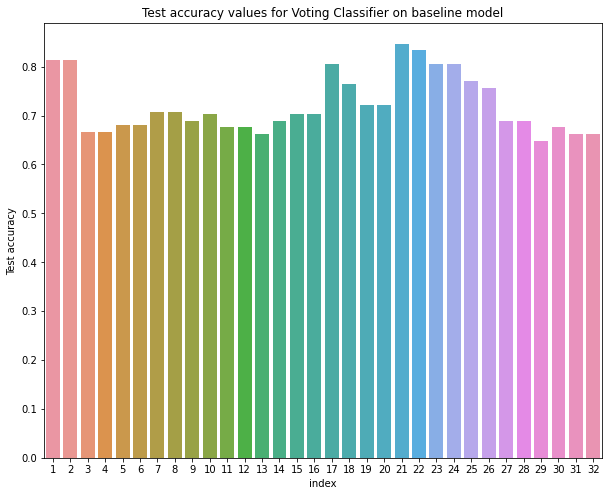

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Test accuracy', data=voting_df1.reset_index())
plt.title('Test accuracy values for Voting Classifier on baseline model')
plt.show()

In [ ]:
best_test_voting_df=voting_df1.sort_values(by='Test accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_test_voting_df

,Train accuracy,Test accuracy
21,0.930314,0.847222
22,0.916376,0.833333
1,0.895270,0.813333
2,0.925676,0.813333
24,0.790941,0.805556
23,0.790941,0.805556
17,0.909408,0.805556
25,0.935811,0.770270
18,0.930314,0.763889
26,0.939189,0.756757


model1, model2, model3,model4,model9,model10,model13,model14,model17,model18,model21,model22,model25,model26,model29,model30 have the best test accuracies of all models in the dataframe

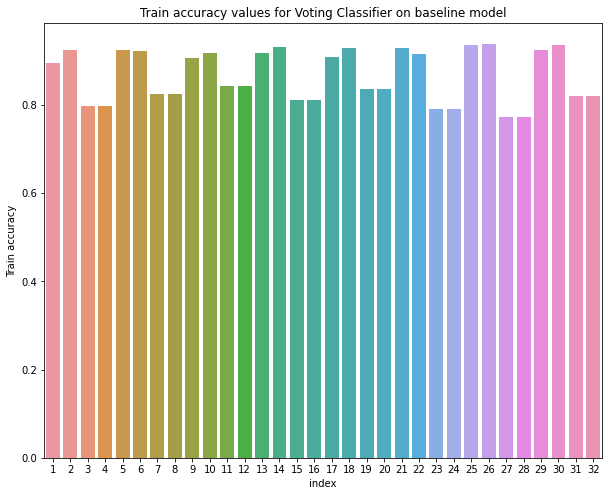

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Train accuracy', data=voting_df1.reset_index())
plt.title('Train accuracy values for Voting Classifier on baseline model')
plt.show()

In [ ]:
best_train_voting_df=voting_df1.sort_values(by='Train accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_train_voting_df

,Train accuracy,Test accuracy
26,0.939189,0.756757
30,0.935811,0.675676
25,0.935811,0.770270
14,0.931507,0.689189
21,0.930314,0.847222
18,0.930314,0.763889
2,0.925676,0.813333
29,0.925676,0.648649
5,0.925676,0.680000
6,0.922297,0.680000


model1, model2, model17,model18,model21,model22,model25,model26,model29,model30 have the best train accuracies of all models in the dataframe

In [ ]:
#common models 
idxlist=np.intersect1d(best_train_voting_df.index, best_test_voting_df.index)
#idxlist=best_train_voting_df.index.intersection(best_test_voting_df)
#print(idxlist)
best_voting_baseline_model=voting_df1.iloc[idxlist]
best_voting_baseline_model.sort_values(by='Test accuracy', ascending=False, inplace=True)

In [ ]:
best_voting_baseline_model[['Train accuracy','Test accuracy']].style.highlight_max(subset=['Train accuracy','Test accuracy'], color='green').highlight_min(color='red')

,Train accuracy,Test accuracy
21,0.930314,0.847222
22,0.916376,0.833333
2,0.925676,0.813333
23,0.790941,0.805556
18,0.930314,0.763889
26,0.939189,0.756757
19,0.836237,0.722222
20,0.836237,0.722222
10,0.917808,0.702703
15,0.811644,0.702703


Model 21 has best test accuracy, while model 3 has lowest test accccuracy.

Model 26 has best train accuracy and Model 27 has lowest train accuracy.

Model 21,22,2 have best test accuracy and quite high train accuracy so we can finalize these 3 models from Voting Classifier on baseline



In [ ]:
voting_model21   #data splitted using stratified=true

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                                          

In [ ]:
voting_model22    #data splitted using stratified=true

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                                          

In [ ]:
voting_model2

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                                          

Best Performing models have Logistic Regression and Ada Boost in Voting Classifier

Also from Voting Classifier, we observed that LDA has no major impact on accuracies, so can ignore LDA from further experiments

#### **8.2.2 Bagging**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
def apply_bagging_classifier(X,y, stratified, scaling):
  if (scaling):
    scaler=StandardScaler()
    X_new=scaler.fit_transform(X)
  else:
      X_new=X.copy()
     
  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0)

  clf1=LogisticRegression(random_state=0)
  clf2=LogisticRegressionCV(cv=5, random_state=0)
  clf3=SVC(kernel='linear',random_state=0)
  clf4=SVC(kernel='rbf',random_state=0)
  clf5=SVC(kernel='poly',random_state=0)
  clf6=RandomForestClassifier(random_state=0, criterion='entropy')
  clf7=ExtraTreesClassifier(random_state=0)
  clf8=GradientBoostingClassifier(random_state=0)
  clf9=LGBMClassifier(random_state=0)
  clf10=XGBClassifier(random_state=0)
  clf11=AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0)

  model_list=[('lr', clf1), 
                              ('lrcv', clf2), 
                              ('svcl', clf3), 
                              ('svcr', clf4), 
                              ('svcp', clf5),
                              ('rf', clf6),
                              ('et', clf7),
                              ('gb', clf8),
                              ('lgbm',clf9),
                              ('xgb', clf10),
                              ('ada', clf11)]
  #model_list=[clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11]
  model=[]
  test_acc=[]
  train_acc=[]
  test_recall=[]
  train_recall=[]
  test_precision=[]
  train_precision=[]

  for name,clf in model_list:
    #print("\n")
    #print(clf)
    #print("\n")
    model.append(name)
    bagging_clf = BaggingClassifier(clf, random_state=0)
    #bagging_scores = cross_val_score(bagging_clf, X_tr, y_tr, cv=10, n_jobs=-1)
    bagging_clf.fit(X_tr, y_tr)

    y_pred_train=bagging_clf.predict(X_tr)
    y_pred_test=bagging_clf.predict(X_ts)

    #print("Train Data Details:")
    #print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
    #print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
    #print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
    #print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
    #print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))
    train_acc.append(metrics.accuracy_score(y_tr, y_pred_train))
    train_recall.append(metrics.recall_score(y_tr, y_pred_train, average='weighted'))
    train_precision.append(metrics.precision_score(y_tr, y_pred_train, average='weighted'))

    #print("\n\nTest Data Details:")
    #print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
    #print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
    #print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
    #print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
    #print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))
    test_acc.append(metrics.accuracy_score(y_ts, y_pred_test))
    test_recall.append(metrics.recall_score(y_ts, y_pred_test, average='weighted'))
    test_precision.append(metrics.precision_score(y_ts, y_pred_test, average='weighted'))

  return pd.DataFrame(zip(model,train_acc,test_acc,train_recall,test_recall,train_precision,test_precision), 
                      columns=['model','Train accuracy','Test accuracy','Train recall','Test recall','Train Precison','Test precision'])

In [ ]:
apply_bagging_classifier(X_train, y_train, 0, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.726351,0.826667,0.726351,0.826667,0.720086,0.827446
1,lrcv,0.729730,0.800000,0.729730,0.800000,0.728337,0.802838
2,svcl,0.729730,0.800000,0.729730,0.800000,0.724224,0.799451
3,svcr,0.679054,0.693333,0.679054,0.693333,0.685648,0.733359
4,svcp,0.648649,0.693333,0.648649,0.693333,0.646218,0.690222
5,rf,0.979730,0.786667,0.979730,0.786667,0.979756,0.793190
6,et,1.000000,0.800000,1.000000,0.800000,1.000000,0.803567
7,gb,0.986486,0.786667,0.986486,0.786667,0.986491,0.786259
8,lgbm,0.976351,0.733333,0.976351,0.733333,0.976373,0.744882
9,xgb,0.949324,0.773333,0.949324,0.773333,0.949947,0.778069


In [ ]:
apply_bagging_classifier(X_train, y_train, 0, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.729730,0.800000,0.729730,0.800000,0.728550,0.807905
1,lrcv,0.736486,0.840000,0.736486,0.840000,0.734156,0.838911
2,svcl,0.739865,0.826667,0.739865,0.826667,0.742128,0.835442
3,svcr,0.780405,0.800000,0.780405,0.800000,0.777383,0.803880
4,svcp,0.777027,0.773333,0.777027,0.773333,0.820718,0.833604
5,rf,0.979730,0.786667,0.979730,0.786667,0.979756,0.793190
6,et,1.000000,0.800000,1.000000,0.800000,1.000000,0.803567
7,gb,0.986486,0.786667,0.986486,0.786667,0.986491,0.786259
8,lgbm,0.979730,0.706667,0.979730,0.706667,0.979749,0.726219
9,xgb,0.949324,0.773333,0.949324,0.773333,0.949947,0.778069


In [ ]:
apply_bagging_classifier(X_train, y_train, 1, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.777027,0.640000,0.777027,0.640000,0.774960,0.639402
1,lrcv,0.783784,0.626667,0.783784,0.626667,0.779843,0.629802
2,svcl,0.783784,0.626667,0.783784,0.626667,0.781469,0.623178
3,svcr,0.668919,0.586667,0.668919,0.586667,0.661085,0.547761
4,svcp,0.665541,0.573333,0.665541,0.573333,0.661838,0.565117
5,rf,0.983108,0.733333,0.983108,0.733333,0.983208,0.735262
6,et,1.000000,0.693333,1.000000,0.693333,1.000000,0.699133
7,gb,0.972973,0.680000,0.972973,0.680000,0.972942,0.689006
8,lgbm,0.962838,0.680000,0.962838,0.680000,0.962775,0.683550
9,xgb,0.932432,0.720000,0.932432,0.720000,0.932555,0.723737


In [ ]:
apply_bagging_classifier(X_train, y_train, 1, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.773649,0.626667,0.773649,0.626667,0.772071,0.629579
1,lrcv,0.800676,0.640000,0.800676,0.640000,0.797432,0.646049
2,svcl,0.777027,0.666667,0.777027,0.666667,0.775603,0.679080
3,svcr,0.804054,0.666667,0.804054,0.666667,0.803336,0.678085
4,svcp,0.763514,0.720000,0.763514,0.720000,0.805592,0.778363
5,rf,0.983108,0.733333,0.983108,0.733333,0.983208,0.735262
6,et,1.000000,0.693333,1.000000,0.693333,1.000000,0.699133
7,gb,0.972973,0.693333,0.972973,0.693333,0.972942,0.705647
8,lgbm,0.966216,0.680000,0.966216,0.680000,0.966154,0.690952
9,xgb,0.932432,0.706667,0.932432,0.706667,0.932555,0.712682


In [ ]:
apply_bagging_classifier(X_train_noout1, y_train_noout1, 0, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.753425,0.662162,0.753425,0.662162,0.745040,0.728049
1,lrcv,0.773973,0.689189,0.773973,0.689189,0.767808,0.716441
2,svcl,0.767123,0.675676,0.767123,0.675676,0.761594,0.737066
3,svcr,0.674658,0.500000,0.674658,0.500000,0.656588,0.502787
4,svcp,0.664384,0.567568,0.664384,0.567568,0.655896,0.588420
5,rf,0.969178,0.662162,0.969178,0.662162,0.969742,0.671041
6,et,0.996575,0.635135,0.996575,0.635135,0.996613,0.637760
7,gb,0.976027,0.662162,0.976027,0.662162,0.976146,0.663127
8,lgbm,0.972603,0.729730,0.972603,0.729730,0.972677,0.749325
9,xgb,0.928082,0.702703,0.928082,0.702703,0.928180,0.707482


In [ ]:
apply_bagging_classifier(X_train_noout1, y_train_noout1, 0, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.773973,0.689189,0.773973,0.689189,0.769738,0.708113
1,lrcv,0.773973,0.662162,0.773973,0.662162,0.768292,0.696064
2,svcl,0.767123,0.689189,0.767123,0.689189,0.764072,0.702687
3,svcr,0.804795,0.648649,0.804795,0.648649,0.801659,0.660126
4,svcp,0.787671,0.675676,0.787671,0.675676,0.812599,0.674228
5,rf,0.969178,0.662162,0.969178,0.662162,0.969742,0.671041
6,et,0.996575,0.635135,0.996575,0.635135,0.996613,0.637760
7,gb,0.976027,0.662162,0.976027,0.662162,0.976146,0.663127
8,lgbm,0.972603,0.716216,0.972603,0.716216,0.972677,0.730942
9,xgb,0.928082,0.702703,0.928082,0.702703,0.928180,0.707482


In [ ]:
apply_bagging_classifier(X_train_noout1, y_train_noout1, 1, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.794521,0.675676,0.794521,0.675676,0.793128,0.669825
1,lrcv,0.791096,0.635135,0.791096,0.635135,0.787716,0.632239
2,svcl,0.794521,0.648649,0.794521,0.648649,0.793897,0.643153
3,svcr,0.719178,0.662162,0.719178,0.662162,0.719267,0.658778
4,svcp,0.657534,0.608108,0.657534,0.608108,0.654968,0.603834
5,rf,0.962329,0.648649,0.962329,0.648649,0.962471,0.652397
6,et,0.996575,0.662162,0.996575,0.662162,0.996609,0.667978
7,gb,0.986301,0.689189,0.986301,0.689189,0.986428,0.695766
8,lgbm,0.972603,0.702703,0.972603,0.702703,0.972744,0.706093
9,xgb,0.948630,0.702703,0.948630,0.702703,0.948705,0.711264


In [ ]:
apply_bagging_classifier(X_train_noout1, y_train_noout1, 1, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.791096,0.662162,0.791096,0.662162,0.788513,0.661686
1,lrcv,0.794521,0.662162,0.794521,0.662162,0.792092,0.658696
2,svcl,0.794521,0.662162,0.794521,0.662162,0.792323,0.665584
3,svcr,0.804795,0.716216,0.804795,0.716216,0.802658,0.717072
4,svcp,0.770548,0.716216,0.770548,0.716216,0.814777,0.778592
5,rf,0.962329,0.662162,0.962329,0.662162,0.962471,0.667978
6,et,0.996575,0.662162,0.996575,0.662162,0.996609,0.667978
7,gb,0.986301,0.689189,0.986301,0.689189,0.986428,0.695766
8,lgbm,0.972603,0.675676,0.972603,0.675676,0.972744,0.673640
9,xgb,0.948630,0.702703,0.948630,0.702703,0.948705,0.711264


In [ ]:
apply_bagging_classifier(X_train_noout2, y_train_noout2, 0, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.752613,0.750000,0.752613,0.750000,0.750331,0.748067
1,lrcv,0.759582,0.708333,0.759582,0.708333,0.758817,0.711368
2,svcl,0.763066,0.736111,0.763066,0.736111,0.762913,0.750000
3,svcr,0.651568,0.666667,0.651568,0.666667,0.667419,0.714430
4,svcp,0.655052,0.583333,0.655052,0.583333,0.677634,0.638740
5,rf,0.958188,0.777778,0.958188,0.777778,0.958220,0.775694
6,et,0.993031,0.763889,0.993031,0.763889,0.993193,0.756020
7,gb,0.968641,0.763889,0.968641,0.763889,0.968745,0.771425
8,lgbm,0.958188,0.763889,0.958188,0.763889,0.958216,0.758997
9,xgb,0.930314,0.777778,0.930314,0.777778,0.929990,0.774901


In [ ]:
apply_bagging_classifier(X_train_noout2, y_train_noout2, 0, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.759582,0.708333,0.759582,0.708333,0.759857,0.717174
1,lrcv,0.766551,0.736111,0.766551,0.736111,0.764642,0.733081
2,svcl,0.770035,0.708333,0.770035,0.708333,0.768933,0.717174
3,svcr,0.787456,0.736111,0.787456,0.736111,0.784483,0.733194
4,svcp,0.783972,0.694444,0.783972,0.694444,0.818343,0.769772
5,rf,0.958188,0.777778,0.958188,0.777778,0.958220,0.775694
6,et,0.993031,0.763889,0.993031,0.763889,0.993193,0.756020
7,gb,0.968641,0.763889,0.968641,0.763889,0.968745,0.771425
8,lgbm,0.961672,0.791667,0.961672,0.791667,0.961738,0.788354
9,xgb,0.930314,0.763889,0.930314,0.763889,0.929990,0.758444


In [ ]:
apply_bagging_classifier(X_train_noout2, y_train_noout2, 1, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.745645,0.819444,0.745645,0.819444,0.744622,0.817355
1,lrcv,0.749129,0.805556,0.749129,0.805556,0.748265,0.802792
2,svcl,0.728223,0.805556,0.728223,0.805556,0.727290,0.805556
3,svcr,0.602787,0.638889,0.602787,0.638889,0.642268,0.666476
4,svcp,0.658537,0.750000,0.658537,0.750000,0.666442,0.752205
5,rf,0.961672,0.763889,0.961672,0.763889,0.962261,0.761071
6,et,0.996516,0.791667,0.996516,0.791667,0.996550,0.788287
7,gb,0.968641,0.791667,0.968641,0.791667,0.969098,0.790287
8,lgbm,0.947735,0.777778,0.947735,0.777778,0.948308,0.779660
9,xgb,0.930314,0.777778,0.930314,0.777778,0.932278,0.781173


In [ ]:
apply_bagging_classifier(X_train_noout2, y_train_noout2, 1, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.735192,0.805556,0.735192,0.805556,0.736860,0.802792
1,lrcv,0.752613,0.833333,0.752613,0.833333,0.752254,0.832888
2,svcl,0.738676,0.819444,0.738676,0.819444,0.744780,0.819794
3,svcr,0.752613,0.805556,0.752613,0.805556,0.757365,0.803068
4,svcp,0.745645,0.777778,0.745645,0.777778,0.803380,0.821429
5,rf,0.961672,0.777778,0.961672,0.777778,0.962261,0.774340
6,et,0.996516,0.791667,0.996516,0.791667,0.996550,0.788287
7,gb,0.968641,0.791667,0.968641,0.791667,0.969098,0.790287
8,lgbm,0.951220,0.750000,0.951220,0.750000,0.951821,0.751221
9,xgb,0.933798,0.777778,0.933798,0.777778,0.935409,0.781173


In [ ]:
apply_bagging_classifier(X_train_noout3, y_train_noout3, 0, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.733108,0.797297,0.733108,0.797297,0.727601,0.799142
1,lrcv,0.736486,0.810811,0.736486,0.810811,0.734631,0.825075
2,svcl,0.722973,0.770270,0.722973,0.770270,0.717481,0.774332
3,svcr,0.712838,0.675676,0.712838,0.675676,0.706955,0.668471
4,svcp,0.635135,0.729730,0.635135,0.729730,0.628877,0.729507
5,rf,0.966216,0.716216,0.966216,0.716216,0.966211,0.736152
6,et,0.989865,0.756757,0.989865,0.756757,0.989871,0.758607
7,gb,0.969595,0.729730,0.969595,0.729730,0.969690,0.744344
8,lgbm,0.972973,0.702703,0.972973,0.702703,0.973253,0.706582
9,xgb,0.939189,0.729730,0.939189,0.729730,0.939208,0.743288


In [ ]:
apply_bagging_classifier(X_train_noout3, y_train_noout3, 0, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.736486,0.810811,0.736486,0.810811,0.734041,0.825075
1,lrcv,0.743243,0.810811,0.743243,0.810811,0.740808,0.817783
2,svcl,0.756757,0.810811,0.756757,0.810811,0.757904,0.818351
3,svcr,0.800676,0.756757,0.800676,0.756757,0.798110,0.773426
4,svcp,0.780405,0.729730,0.780405,0.729730,0.813635,0.831191
5,rf,0.966216,0.716216,0.966216,0.716216,0.966211,0.736152
6,et,0.989865,0.756757,0.989865,0.756757,0.989871,0.758607
7,gb,0.969595,0.729730,0.969595,0.729730,0.969690,0.744344
8,lgbm,0.966216,0.729730,0.966216,0.729730,0.966398,0.745858
9,xgb,0.939189,0.729730,0.939189,0.729730,0.939293,0.743288


In [ ]:
apply_bagging_classifier(X_train_noout3, y_train_noout3, 1, 0)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.783784,0.648649,0.783784,0.648649,0.780998,0.644413
1,lrcv,0.787162,0.635135,0.787162,0.635135,0.783876,0.633243
2,svcl,0.793919,0.648649,0.793919,0.648649,0.792404,0.644371
3,svcr,0.679054,0.648649,0.679054,0.648649,0.671802,0.635843
4,svcp,0.652027,0.608108,0.652027,0.608108,0.646204,0.595794
5,rf,0.976351,0.702703,0.976351,0.702703,0.976708,0.711264
6,et,1.000000,0.675676,1.000000,0.675676,1.000000,0.678129
7,gb,0.979730,0.675676,0.979730,0.675676,0.979730,0.678841
8,lgbm,0.966216,0.675676,0.966216,0.675676,0.966265,0.692342
9,xgb,0.945946,0.716216,0.945946,0.716216,0.945767,0.727805


In [ ]:
apply_bagging_classifier(X_train_noout3, y_train_noout3, 1, 1)

,model,Train accuracy,Test accuracy,Train recall,Test recall,Train Precison,Test precision
0,lr,0.783784,0.648649,0.783784,0.648649,0.782620,0.648806
1,lrcv,0.790541,0.648649,0.790541,0.648649,0.786928,0.648806
2,svcl,0.783784,0.662162,0.783784,0.662162,0.782317,0.664615
3,svcr,0.800676,0.662162,0.800676,0.662162,0.799056,0.662162
4,svcp,0.783784,0.675676,0.783784,0.675676,0.820232,0.718093
5,rf,0.976351,0.702703,0.976351,0.702703,0.976708,0.711264
6,et,1.000000,0.675676,1.000000,0.675676,1.000000,0.678129
7,gb,0.979730,0.675676,0.979730,0.675676,0.979730,0.678841
8,lgbm,0.969595,0.675676,0.969595,0.675676,0.969612,0.691959
9,xgb,0.945946,0.716216,0.945946,0.716216,0.945767,0.727805


Bagging it seems have not provided better results as compared to Voting CLassifier.

But, further we can create one Ensemble Voting Classifier for all individual models along with the Bagging version of those to analyze all

#### **8.2.3 Voting including Bagging Classifiers**

In [ ]:
def apply_ensemble_voting_classifier(X,y, stratified, scaling):
  if (scaling):
    scaler=StandardScaler()
    X_new=scaler.fit_transform(X)
  else:
     X_new=X.copy()

  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0)

  clf1=LogisticRegression(random_state=0)
  clf2=LogisticRegressionCV(cv=5, random_state=0)
  clf3=SVC(kernel='linear',random_state=0)
  clf4=SVC(kernel='rbf',random_state=0)
  clf5=SVC(kernel='poly',random_state=0)
  clf6=RandomForestClassifier(random_state=0, criterion='entropy')
  clf7=ExtraTreesClassifier(random_state=0)
  clf8=GradientBoostingClassifier(random_state=0)
  clf9=LGBMClassifier(random_state=0)
  clf10=XGBClassifier(random_state=0)
  clf11=AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0)
  clf12 = BaggingClassifier(clf1, random_state=0)
  clf13 = BaggingClassifier(clf2, random_state=0)
  clf14 = BaggingClassifier(clf3, random_state=0)
  clf15 = BaggingClassifier(clf4, random_state=0)
  clf16 = BaggingClassifier(clf5, random_state=0)
  clf17 = BaggingClassifier(clf6, random_state=0)
  clf18 = BaggingClassifier(clf7, random_state=0)
  clf19 = BaggingClassifier(clf8, random_state=0)
  clf20 = BaggingClassifier(clf9, random_state=0)
  clf21 = BaggingClassifier(clf10, random_state=0)
  clf22 = BaggingClassifier(clf11, random_state=0)

  votingclf=VotingClassifier(estimators=[('lr', clf1), 
                                        ('lrcv', clf2), 
                                        ('svcl', clf3), 
                                        ('svcr', clf4), 
                                        ('svcp', clf5),
                                        ('rf', clf6),
                                        ('et', clf7),
                                        ('gb', clf8),
                                        ('lgbm',clf9),
                                        ('xgb', clf10),
                                        ('ada', clf11),
							                          ('bag_lr', clf12),
							                          ('bag_lrv', clf13),
                                        ('bag_svl', clf14),
                                        ('bag_svr', clf15),
                                        ('bag_svp', clf16),
                                        ('bag_rf', clf17),
                                        ('bag_rt', clf18),
                                        ('bag_gb', clf19),
                                        ('bag_lgb', clf20),
                                        ('bag_xgb', clf21),
                                        ('bag_ada', clf22),], voting='hard', n_jobs=-1)   

  votingclf=votingclf.fit(X_tr,y_tr)

  y_pred_train=votingclf.predict(X_tr)
  y_pred_test=votingclf.predict(X_ts)

  #print("Train Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  #print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  #print("\n\nTest Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  #print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  return votingclf, metrics.accuracy_score(y_ts, y_pred_test), metrics.accuracy_score(y_tr, y_pred_train)

In [ ]:
ensem_model1, ensem_testacc1, ensem_train_acc1=apply_ensemble_voting_classifier(X_train, y_train, 0, 0)

In [ ]:
ensem_model2, ensem_testacc2, ensem_train_acc2=apply_ensemble_voting_classifier(X_train, y_train, 0, 1)

In [ ]:
ensem_model3, ensem_testacc3, ensem_train_acc3=apply_ensemble_voting_classifier(X_train, y_train, 1, 0)

In [ ]:
ensem_model4, ensem_testacc4, ensem_train_acc4=apply_ensemble_voting_classifier(X_train, y_train, 1, 1)

In [ ]:
ensem_model5, ensem_testacc5, ensem_train_acc5=apply_ensemble_voting_classifier(X_train_noout1, y_train_noout1, 0, 0)

In [ ]:
ensem_model6, ensem_testacc6, ensem_train_acc6=apply_ensemble_voting_classifier(X_train_noout1, y_train_noout1, 0, 1)

In [ ]:
ensem_model7, ensem_testacc7, ensem_train_acc7=apply_ensemble_voting_classifier(X_train_noout1, y_train_noout1, 1, 0)

In [ ]:
ensem_model8, ensem_testacc8, ensem_train_acc8=apply_ensemble_voting_classifier(X_train_noout1, y_train_noout1, 1, 1)

In [ ]:
ensem_model9, ensem_testacc9, ensem_train_acc9=apply_ensemble_voting_classifier(X_train_noout2, y_train_noout2, 0, 0)

In [ ]:
ensem_model10, ensem_testacc10, ensem_train_acc10=apply_ensemble_voting_classifier(X_train_noout2, y_train_noout2, 0, 1)

In [ ]:
ensem_model11, ensem_testacc11, ensem_train_acc11=apply_ensemble_voting_classifier(X_train_noout2, y_train_noout2, 1, 0)

In [ ]:
ensem_model12, ensem_testacc12, ensem_train_acc12=apply_ensemble_voting_classifier(X_train_noout2, y_train_noout2, 1, 1)

In [ ]:
ensem_model13, ensem_testacc13, ensem_train_acc13=apply_ensemble_voting_classifier(X_train_noout3, y_train_noout3, 0, 0)

In [ ]:
ensem_model14, ensem_testacc14, ensem_train_acc14=apply_ensemble_voting_classifier(X_train_noout3, y_train_noout3, 0, 1)

In [ ]:
ensem_model15, ensem_testacc15, ensem_train_acc15=apply_ensemble_voting_classifier(X_train_noout3, y_train_noout3, 1, 0)

In [ ]:
ensem_model16, ensem_testacc16, ensem_train_acc16=apply_ensemble_voting_classifier(X_train_noout3, y_train_noout3, 1, 1)

In [ ]:
ensem_model=[ensem_model1,ensem_model2,ensem_model3,ensem_model4,ensem_model5,ensem_model6,ensem_model7,ensem_model8,ensem_model9,ensem_model10,ensem_model12,ensem_model13,ensem_model14,ensem_model15,ensem_model16]
ensem_testacc=[ensem_testacc1,ensem_testacc2,ensem_testacc3,ensem_testacc4,ensem_testacc5,ensem_testacc6,ensem_testacc7,ensem_testacc8,ensem_testacc9,ensem_testacc10,ensem_testacc12,ensem_testacc13,ensem_testacc14,ensem_testacc15,ensem_testacc16]
ensem_trainacc=[ensem_train_acc1,ensem_train_acc2,ensem_train_acc3,ensem_train_acc4,ensem_train_acc5,ensem_train_acc6,ensem_train_acc7,ensem_train_acc8,ensem_train_acc9,ensem_train_acc10,ensem_train_acc11,ensem_train_acc12,ensem_train_acc13,ensem_train_acc14,ensem_train_acc15,ensem_train_acc16]

In [ ]:
ensem_voting_df=pd.DataFrame(zip(ensem_model,ensem_testacc,ensem_trainacc), columns=['model','Test accuracy','Train accuracy'])
ensem_voting_df

,model,Test accuracy,Train accuracy
0,"VotingClassifier(estimators=[('lr',\n ...",0.800000,0.881757
1,"VotingClassifier(estimators=[('lr',\n ...",0.826667,0.929054
2,"VotingClassifier(estimators=[('lr',\n ...",0.653333,0.902027
3,"VotingClassifier(estimators=[('lr',\n ...",0.666667,0.908784
4,"VotingClassifier(estimators=[('lr',\n ...",0.689189,0.883562
5,"VotingClassifier(estimators=[('lr',\n ...",0.675676,0.893836
6,"VotingClassifier(estimators=[('lr',\n ...",0.621622,0.890411
7,"VotingClassifier(estimators=[('lr',\n ...",0.675676,0.921233
8,"VotingClassifier(estimators=[('lr',\n ...",0.763889,0.923345
9,"VotingClassifier(estimators=[('lr',\n ...",0.750000,0.912892


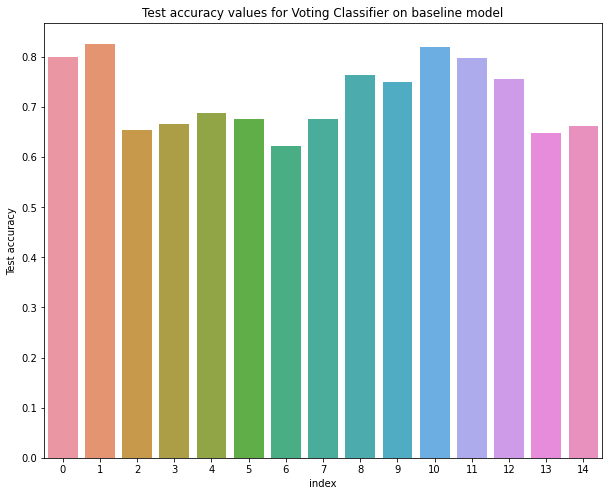

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Test accuracy', data=ensem_voting_df.reset_index())
plt.title('Test accuracy values for Voting Classifier on baseline model')
plt.show()

In [ ]:
best_ensemtest_voting_df=ensem_voting_df.sort_values(by='Test accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_ensemtest_voting_df

,Train accuracy,Test accuracy
1,0.929054,0.826667
10,0.909408,0.819444
0,0.881757,0.800000
11,0.902439,0.797297
8,0.923345,0.763889
12,0.915541,0.756757
9,0.912892,0.750000
4,0.883562,0.689189
5,0.893836,0.675676
7,0.921233,0.675676


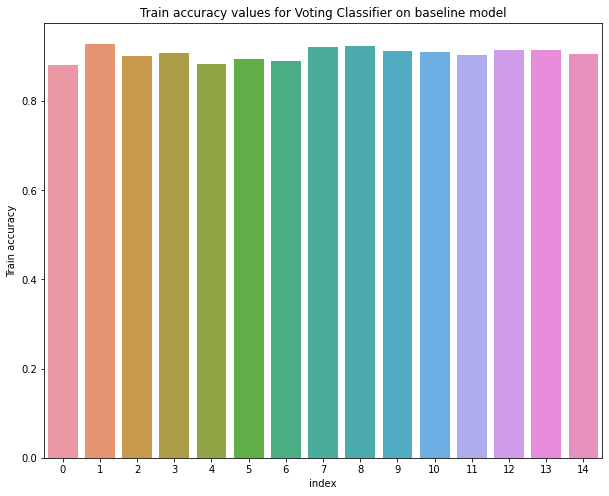

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Train accuracy', data=ensem_voting_df.reset_index())
plt.title('Train accuracy values for Voting Classifier on baseline model')
plt.show()

In [ ]:
best_ensemtrain_voting_df=ensem_voting_df.sort_values(by='Train accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_ensemtrain_voting_df

,Train accuracy,Test accuracy
1,0.929054,0.826667
8,0.923345,0.763889
7,0.921233,0.675676
12,0.915541,0.756757
13,0.915541,0.648649
9,0.912892,0.750000
10,0.909408,0.819444
3,0.908784,0.666667
14,0.905405,0.662162
11,0.902439,0.797297


In [ ]:
#common models 
idxlist=np.intersect1d(best_ensemtrain_voting_df.index, best_ensemtest_voting_df.index)
#idxlist=best_train_voting_df.index.intersection(best_test_voting_df)
print(idxlist)
best_ensemvoting_baseline_model=ensem_voting_df.iloc[idxlist]
best_ensemvoting_baseline_model.sort_values(by='Test accuracy', ascending=False, inplace=True)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


In [ ]:
best_ensemvoting_baseline_model.reset_index(drop=True, inplace=True)
best_ensemvoting_baseline_model

,model,Test accuracy,Train accuracy
0,"VotingClassifier(estimators=[('lr',\n ...",0.826667,0.929054
1,"VotingClassifier(estimators=[('lr',\n ...",0.819444,0.909408
2,"VotingClassifier(estimators=[('lr',\n ...",0.800000,0.881757
3,"VotingClassifier(estimators=[('lr',\n ...",0.797297,0.902439
4,"VotingClassifier(estimators=[('lr',\n ...",0.763889,0.923345
5,"VotingClassifier(estimators=[('lr',\n ...",0.756757,0.915541
6,"VotingClassifier(estimators=[('lr',\n ...",0.750000,0.912892
7,"VotingClassifier(estimators=[('lr',\n ...",0.689189,0.883562
8,"VotingClassifier(estimators=[('lr',\n ...",0.675676,0.893836
9,"VotingClassifier(estimators=[('lr',\n ...",0.675676,0.921233


So, we can consider the top 3 models from the above dataframe

In [ ]:
best_ensemvoting_baseline_model.iloc[0,0]

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                              BaggingClass

In [ ]:
best_ensemvoting_baseline_model.iloc[1,0]

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                              BaggingClass

In [ ]:
best_ensemvoting_baseline_model.iloc[2,0]

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=0, solver='lbfgs',
                                                 tol=0.0001, verbose=0,
                                                 warm_start=False)),
                             ('lrcv',
                              LogisticRegressionCV(Cs=10, class_weight=None,
                                                   cv=5, dual=False,
                                                   fit_intercep...
                              BaggingClass

The internal models are common in the top 3 results of Voting Classifier and Voting Classifier including Bagging

- Logistic Regression
- Logistic RegressionCV
- Ada Boost Classifier

#### **8.2.4 Stacking**

In [ ]:
from sklearn.ensemble import StackingClassifier

In [ ]:
def apply_stacking_classifier(X,y, stratified, scaling):
  if (scaling):
    scaler=StandardScaler()
    X_new=scaler.fit_transform(X)
  else:
    X_new=X.copy()

  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0)

  clf1=LogisticRegression(random_state=0)
  clf2=LogisticRegressionCV(cv=5, random_state=0)
  clf3=SVC(kernel='linear',random_state=0)
  clf4=SVC(kernel='rbf',random_state=0)
  clf5=SVC(kernel='poly',random_state=0)
  clf6=RandomForestClassifier(random_state=0, criterion='entropy')
  clf7=ExtraTreesClassifier(random_state=0)
  clf8=GradientBoostingClassifier(random_state=0)
  clf9=LGBMClassifier(random_state=0)
  clf10=XGBClassifier(random_state=0)
  clf11=AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0)
  clf12 = BaggingClassifier(clf1, random_state=0)
  clf13 = BaggingClassifier(clf2, random_state=0)
  clf14 = BaggingClassifier(clf3, random_state=0)
  clf15 = BaggingClassifier(clf4, random_state=0)
  clf16 = BaggingClassifier(clf5, random_state=0)
  clf17 = BaggingClassifier(clf6, random_state=0)
  clf18 = BaggingClassifier(clf7, random_state=0)
  clf19 = BaggingClassifier(clf8, random_state=0)
  clf20 = BaggingClassifier(clf9, random_state=0)
  clf21 = BaggingClassifier(clf10, random_state=0)
  clf22 = BaggingClassifier(clf11, random_state=0)

  stackclf=StackingClassifier(estimators=[('lr', clf1), 
                                        ('lrcv', clf2), 
                                        ('svcl', clf3), 
                                        ('svcr', clf4), 
                                        ('svcp', clf5),
                                        ('rf', clf6),
                                        ('et', clf7),
                                        ('gb', clf8),
                                        ('lgbm',clf9),
                                        ('xgb', clf10),
                                        ('ada', clf11),
							                          ('bag_lr', clf12),
							                          ('bag_lrv', clf13),
                                        ('bag_svl', clf14),
                                        ('bag_svr', clf15),
                                        ('bag_svp', clf16),
                                        ('bag_rf', clf17),
                                        ('bag_rt', clf18),
                                        ('bag_gb', clf19),
                                        ('bag_lgb', clf20),
                                        ('bag_xgb', clf21),
                                        ('bag_ada', clf22),], final_estimator=LogisticRegressionCV(cv=5, random_state=0), n_jobs=-1)   

  stackclf=stackclf.fit(X_tr,y_tr)

  y_pred_train=stackclf.predict(X_tr)
  y_pred_test=stackclf.predict(X_ts)

  #print("Train Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  #print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  #print("\n\nTest Data Details:")
  #print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  #print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  #print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  #print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  #print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  return stackclf, metrics.accuracy_score(y_ts, y_pred_test), metrics.accuracy_score(y_tr, y_pred_train)

In [ ]:
stacking_model1, stacking_testacc1, stacking_train_acc1=apply_stacking_classifier(X_train, y_train, 0, 0)

In [ ]:
stacking_model2, stacking_testacc2, stacking_train_acc2=apply_stacking_classifier(X_train, y_train, 0, 1)

In [ ]:
stacking_model3, stacking_testacc3, stacking_train_acc3=apply_stacking_classifier(X_train, y_train, 1, 0)

In [ ]:
stacking_model4, stacking_testacc4, stacking_train_acc4=apply_stacking_classifier(X_train, y_train, 1, 1)

In [ ]:
stacking_model5, stacking_testacc5, stacking_train_acc5=apply_stacking_classifier(X_train_noout1, y_train_noout1, 0, 0)

In [ ]:
stacking_model6, stacking_testacc6, stacking_train_acc6=apply_stacking_classifier(X_train_noout1, y_train_noout1, 0, 1)

In [ ]:
stacking_model7, stacking_testacc7, stacking_train_acc7=apply_stacking_classifier(X_train_noout1, y_train_noout1, 1, 0)

In [ ]:
stacking_model8, stacking_testacc8, stacking_train_acc8=apply_stacking_classifier(X_train_noout1, y_train_noout1, 1, 1)

In [ ]:
stacking_model9, stacking_testacc9, stacking_train_acc9=apply_stacking_classifier(X_train_noout2, y_train_noout2, 0, 0)

In [ ]:
stacking_model10, stacking_testacc10, stacking_train_acc10=apply_stacking_classifier(X_train_noout2, y_train_noout2, 0, 1)

In [ ]:
stacking_model11, stacking_testacc11, stacking_train_acc11=apply_stacking_classifier(X_train_noout2, y_train_noout2, 1, 0)

In [ ]:
stacking_model12, stacking_testacc12, stacking_train_acc12=apply_stacking_classifier(X_train_noout2, y_train_noout2, 1, 1)

In [ ]:
stacking_model13, stacking_testacc13, stacking_train_acc13=apply_stacking_classifier(X_train_noout3, y_train_noout3, 0, 0)

In [ ]:
stacking_model14, stacking_testacc14, stacking_train_acc14=apply_stacking_classifier(X_train_noout3, y_train_noout3, 0, 1)

In [ ]:
stacking_model15, stacking_testacc15, stacking_train_acc15=apply_stacking_classifier(X_train_noout3, y_train_noout3, 1, 0)

In [ ]:
stacking_model16, stacking_testacc16, stacking_train_acc16=apply_stacking_classifier(X_train_noout3, y_train_noout3, 1, 1)

In [ ]:
stacking_model=[stacking_model1,stacking_model2,stacking_model3,stacking_model4,stacking_model5,stacking_model6,stacking_model7,stacking_model8,stacking_model9,stacking_model10,stacking_model12,stacking_model13,stacking_model14,stacking_model15,stacking_model16]
stacking_testacc=[stacking_testacc1,stacking_testacc2,stacking_testacc3,stacking_testacc4,stacking_testacc5,stacking_testacc6,stacking_testacc7,stacking_testacc8,stacking_testacc9,stacking_testacc10,stacking_testacc12,stacking_testacc13,stacking_testacc14,stacking_testacc15,stacking_testacc16]
stacking_trainacc=[stacking_train_acc1,stacking_train_acc2,stacking_train_acc3,stacking_train_acc4,stacking_train_acc5,stacking_train_acc6,stacking_train_acc7,stacking_train_acc8,stacking_train_acc9,stacking_train_acc10,stacking_train_acc11,stacking_train_acc12,stacking_train_acc13,stacking_train_acc14,stacking_train_acc15,stacking_train_acc16]


In [ ]:
stacking_voting_df=pd.DataFrame(zip(stacking_model,stacking_testacc,stacking_trainacc), columns=['model','Test accuracy','Train accuracy'])
stacking_voting_df

,model,Test accuracy,Train accuracy
0,"StackingClassifier(cv=None,\n ...",0.813333,0.854730
1,"StackingClassifier(cv=None,\n ...",0.666667,0.726351
2,"StackingClassifier(cv=None,\n ...",0.626667,0.837838
3,"StackingClassifier(cv=None,\n ...",0.680000,0.824324
4,"StackingClassifier(cv=None,\n ...",0.689189,0.969178
5,"StackingClassifier(cv=None,\n ...",0.648649,0.839041
6,"StackingClassifier(cv=None,\n ...",0.702703,0.876712
7,"StackingClassifier(cv=None,\n ...",0.689189,0.849315
8,"StackingClassifier(cv=None,\n ...",0.625000,0.738676
9,"StackingClassifier(cv=None,\n ...",0.708333,0.822300


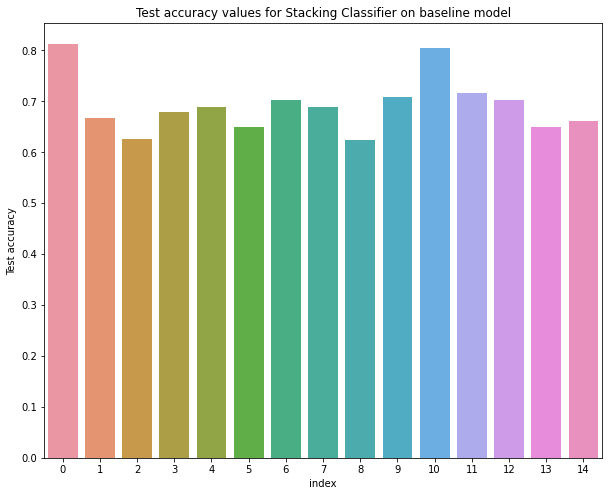

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Test accuracy', data=stacking_voting_df.reset_index())
plt.title('Test accuracy values for Stacking Classifier on baseline model')
plt.show()

In [ ]:
best_stackingtest_voting_df=stacking_voting_df.sort_values(by='Test accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_stackingtest_voting_df

,Train accuracy,Test accuracy
0,0.854730,0.813333
10,0.839721,0.805556
11,0.801394,0.716216
9,0.822300,0.708333
6,0.876712,0.702703
12,0.702703,0.702703
4,0.969178,0.689189
7,0.849315,0.689189
3,0.824324,0.680000
1,0.726351,0.666667


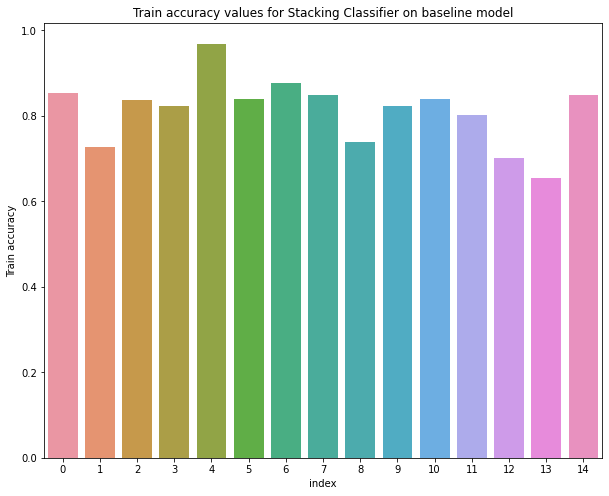

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='index', y='Train accuracy', data=stacking_voting_df.reset_index())
plt.title('Train accuracy values for Stacking Classifier on baseline model')
plt.show()

In [ ]:
best_stackingtrain_voting_df=stacking_voting_df.sort_values(by='Train accuracy', ascending=False).head(20)[['Train accuracy','Test accuracy']]
best_stackingtrain_voting_df

,Train accuracy,Test accuracy
4,0.969178,0.689189
6,0.876712,0.702703
0,0.854730,0.813333
7,0.849315,0.689189
14,0.847973,0.662162
10,0.839721,0.805556
5,0.839041,0.648649
2,0.837838,0.626667
3,0.824324,0.680000
9,0.822300,0.708333


In [ ]:
#common models 
idxlist=np.intersect1d(best_stackingtrain_voting_df.index, best_stackingtest_voting_df.index)
#idxlist=best_train_voting_df.index.intersection(best_test_voting_df)
print(idxlist)
best_stackingvoting_baseline_model=stacking_voting_df.iloc[idxlist]
best_stackingvoting_baseline_model.sort_values(by='Test accuracy', ascending=False, inplace=True)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


In [ ]:
best_stackingvoting_baseline_model.reset_index(drop=True, inplace=True)

In [ ]:
best_stackingvoting_baseline_model[['Test accuracy', 'Train accuracy']].style.highlight_max(subset=['Test accuracy', 'Train accuracy'])

,Test accuracy,Train accuracy
0,0.813333,0.854730
1,0.805556,0.839721
2,0.716216,0.801394
3,0.708333,0.822300
4,0.702703,0.876712
5,0.702703,0.702703
6,0.689189,0.969178
7,0.689189,0.849315
8,0.680000,0.824324
9,0.666667,0.726351


We can select top 2 model, both have decent train and test accuracy

In [ ]:
best_stackingvoting_baseline_model.iloc[0,0]

StackingClassifier(cv=None,
                   estimators=[('lr',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                                                   l1_ratio=None, max_iter=100,
                                                   multi_class='auto',
                                                   n_jobs=None, penalty='l2',
                                                   random_state=0,
                                                   solver='lbfgs', tol=0.0001,
                                                   verbose=0,
                                                   warm_start=False)),
                               ('lrcv',
                                LogisticRegressionCV(Cs=10, class_weight=None,
                        

In [ ]:
best_stackingvoting_baseline_model.iloc[1,0]

StackingClassifier(cv=None,
                   estimators=[('lr',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                                                   l1_ratio=None, max_iter=100,
                                                   multi_class='auto',
                                                   n_jobs=None, penalty='l2',
                                                   random_state=0,
                                                   solver='lbfgs', tol=0.0001,
                                                   verbose=0,
                                                   warm_start=False)),
                               ('lrcv',
                                LogisticRegressionCV(Cs=10, class_weight=None,
                        

### **8.3. Conclusion on baseline models performace along with Ensemble techniques**

After applying indiviudal models and later aggregating them using various techniques - Voting Classifier, Bagging Classifier and Stacking Classifier, observed that in all the scenarios, the  best performing models are having either of the below baseline models -

- Logistic Regression
- Logistic RegressionCV
- Ada Boost Classifier

Also, the data with outliers are anayzed better without stratified indicator is set, while for the data without outliers, performed better when stratified was set during test/train splitting.

Voting Classifier on individual models performed best among all the techniques, followed by Stacking Classifier.

**Best performing models**

In [ ]:
final_baseline_model=[]
final_baseline_testacc=[]
final_baseline_trainacc=[]

final_baseline_model.append(best_stackingvoting_baseline_model.iloc[0,0])
final_baseline_model.append(best_stackingvoting_baseline_model.iloc[1,0])
final_baseline_model.append(best_ensemvoting_baseline_model.iloc[0,0])
final_baseline_model.append(best_ensemvoting_baseline_model.iloc[1,0])
final_baseline_model.append(best_ensemvoting_baseline_model.iloc[2,0])
final_baseline_model.append(best_voting_baseline_model.iloc[0,0])
final_baseline_model.append(best_voting_baseline_model.iloc[1,0])
final_baseline_model.append(best_voting_baseline_model.iloc[2,0])


final_baseline_testacc.append(best_stackingvoting_baseline_model.iloc[0,1])
final_baseline_testacc.append(best_stackingvoting_baseline_model.iloc[1,1])
final_baseline_testacc.append(best_ensemvoting_baseline_model.iloc[0,1])
final_baseline_testacc.append(best_ensemvoting_baseline_model.iloc[1,1])
final_baseline_testacc.append(best_ensemvoting_baseline_model.iloc[2,1])
final_baseline_testacc.append(best_voting_baseline_model.iloc[0,1])
final_baseline_testacc.append(best_voting_baseline_model.iloc[1,1])
final_baseline_testacc.append(best_voting_baseline_model.iloc[2,1])

final_baseline_trainacc.append(best_stackingvoting_baseline_model.iloc[0,2])
final_baseline_trainacc.append(best_stackingvoting_baseline_model.iloc[1,2])
final_baseline_trainacc.append(best_ensemvoting_baseline_model.iloc[0,2])
final_baseline_trainacc.append(best_ensemvoting_baseline_model.iloc[1,2])
final_baseline_trainacc.append(best_ensemvoting_baseline_model.iloc[2,2])
final_baseline_trainacc.append(best_voting_baseline_model.iloc[0,2])
final_baseline_trainacc.append(best_voting_baseline_model.iloc[1,2])
final_baseline_trainacc.append(best_voting_baseline_model.iloc[2,2])

final_baseline_model=pd.DataFrame(zip(final_baseline_model,final_baseline_testacc,final_baseline_trainacc), columns=['Model','Test accuracy','Train accuracy'])
final_baseline_model.sort_values(by='Test accuracy', ascending=False, inplace=True)
final_baseline_model.reset_index(drop=True, inplace=True)
final_baseline_model

,Model,Test accuracy,Train accuracy
0,"VotingClassifier(estimators=[('lr',\n ...",0.847222,0.930314
1,"VotingClassifier(estimators=[('lr',\n ...",0.833333,0.916376
2,"VotingClassifier(estimators=[('lr',\n ...",0.826667,0.929054
3,"VotingClassifier(estimators=[('lr',\n ...",0.819444,0.909408
4,"StackingClassifier(cv=None,\n ...",0.813333,0.854730
5,"VotingClassifier(estimators=[('lr',\n ...",0.813333,0.925676
6,"StackingClassifier(cv=None,\n ...",0.805556,0.839721
7,"VotingClassifier(estimators=[('lr',\n ...",0.800000,0.881757


Now, will do the hyper parameter(including Ensemble techniques) tuning to analyze if score improves

## **9. Prepare and process various Machine Learning Models - Hyper-parameter tuning**

Can apply Hyper parameter tuning to below models and then can apply Voting Classifier on them:

- Logistic Regression
- Logistic RegressionCV
- Random Forest
- Gradient Boosting
- XGBoost
- LightGBM
- Ada Boost
- SVC (kernel - linear/Poly/RBF)

In [ ]:
import time

In [ ]:
param_model_name=[]
param_model_list=[]
param_train_acc=[]
param_test_acc=[]
param_test_recall=[]
param_test_precison=[]
param_test_f1=[]
param_duration=[]
param_outlier=[]
param_stratified=[]
param_scaling=[]

In [ ]:
def apply_param_model(X,y, stratified, scaling, param_list, model, refit_score, model_name, outlier):

  if (scaling):
    scaler=StandardScaler()
    X_new=scaler.fit_transform(X)
  else:
    X_new=X.copy()

  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X_new, y, test_size = .20, random_state = 0)
 
  start_time=time.time()
  scorers = {
    'precision_score': metrics.make_scorer(metrics.precision_score, average='weighted'),
    'recall_score': metrics.make_scorer(metrics.recall_score, average='weighted'),
    'accuracy_score': metrics.make_scorer(metrics.accuracy_score),
    'f1_score': metrics.make_scorer(metrics.f1_score, average='weighted')
  }
  #clf = GridSearchCV(model, param_grid = param_list, scoring = scorers, return_train_score=True, refit=refit_score, cv = 5, n_jobs = -1)
  clf = RandomizedSearchCV(model, n_iter=10, param_distributions = param_list, cv =10, verbose=True, n_jobs=-1, 
                           return_train_score=True, refit=refit_score, scoring=scorers)
  clf.fit(X, y)

  y_pred_train=clf.predict(X_tr)
  y_pred_test=clf.predict(X_ts)

  end_time=time.time()
  print("\n\nTrain Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  print("\nTest Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  param_model_list.append(clf)
  param_train_acc.append(metrics.accuracy_score(y_tr, y_pred_train))
  param_test_acc.append(metrics.accuracy_score(y_ts, y_pred_test))
  param_test_recall.append(metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  param_test_precison.append(metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  param_test_f1.append(metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  param_model_name.append(model_name)
  param_duration.append(end_time-start_time)
  param_outlier.append(outlier)
  param_stratified.append(stratified)
  param_scaling.append(scaling)


**Parametrized Logistic Regression**

In [ ]:
params = {'penalty':['l1', 'l2'], 'C':[1, 2, 3, 5, 10]}
lr = LogisticRegression(random_state = 0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, lr, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 1,0, params, lr, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 0,1, params, lr, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 1,1, params, lr, 'accuracy_score', 'Logistic Regression', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7432432432432432
Recall :  0.7432432432432432
Precison :  0.7387029933082564
F1 score :  0.7399735789559295
Confusion Matix :  [[77  1 10]
 [ 3 83 21]
 [15 26 60]]

Test Data Details:
Accuracy :  0.8533333333333334
Recall :  0.8533333333333334
Precison :  0.8521142857142858
F1 score :  0.8505721040189127
Confusion Matix :  [[26  0  3]
 [ 0 21  1]
 [ 3  4 17]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7972972972972973
Recall :  0.7972972972972973
Precison :  0.7944308481992306
F1 score :  0.7935509416353813
Confusion Matix :  [[85  1  7]
 [ 2 87 14]
 [12 24 64]]

Test Data Details:
Accuracy :  0.64
Recall :  0.64
Precison :  0.6471257112184648
F1 score :  0.6423129251700681
Confusion Matix :  [[18  0  6]
 [ 1 17  8]
 [ 6  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.625
Recall :  0.625
Precison :  0.6579716199369074
F1 score :  0.6075851489005791
Confusion Matix :  [[88  0  0]
 [14 59 34]
 [53 10 38]]

Test Data Details:
Accuracy :  0.68
Recall :  0.68
Precison :  0.731038961038961
F1 score :  0.661214611872146
Confusion Matix :  [[29  0  0]
 [ 3 10  9]
 [12  0 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6385135135135135
Recall :  0.6385135135135135
Precison :  0.6698360258148275
F1 score :  0.6212616697107716
Confusion Matix :  [[93  0  0]
 [14 55 34]
 [50  9 41]]

Test Data Details:
Accuracy :  0.6266666666666667
Recall :  0.6266666666666667
Precison :  0.673079365079365
F1 score :  0.6090101239278777
Confusion Matix :  [[24  0  0]
 [ 3 14  9]
 [15  1  9]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7808219178082192
Recall :  0.7808219178082192
Precison :  0.7792818114058743
F1 score :  0.7797854572225937
Confusion Matix :  [[82  1 12]
 [ 1 89 17]
 [11 22 57]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.700950040950041
F1 score :  0.6816525527944356
Confusion Matix :  [[18  0  1]
 [ 2 14  5]
 [ 7  8 19]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7808219178082192
Recall :  0.7808219178082192
Precison :  0.7776531707639055
F1 score :  0.7777223876394241
Confusion Matix :  [[81  1  9]
 [ 1 85 16]
 [12 25 62]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.6907614135875005
F1 score :  0.6874020959735244
Confusion Matix :  [[19  0  4]
 [ 2 18  6]
 [ 6  5 14]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6438356164383562
Recall :  0.6438356164383562
Precison :  0.6789361306661765
F1 score :  0.6271551565921059
Confusion Matix :  [[95  0  0]
 [15 58 34]
 [48  7 35]]

Test Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.6327658827658827
F1 score :  0.5367742276553752
Confusion Matix :  [[19  0  0]
 [ 4  9  8]
 [19  2 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6232876712328768
Recall :  0.6232876712328768
Precison :  0.6596754209929326
F1 score :  0.6049419516809081
Confusion Matix :  [[91  0  0]
 [14 52 36]
 [52  8 39]]

Test Data Details:
Accuracy :  0.6351351351351351
Recall :  0.6351351351351351
Precison :  0.6983422375864237
F1 score :  0.6196179946179946
Confusion Matix :  [[23  0  0]
 [ 5 15  6]
 [15  1  9]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7630662020905923
Recall :  0.7630662020905923
Precison :  0.7596100858190948
F1 score :  0.7600722116110513
Confusion Matix :  [[75  1  8]
 [ 2 78 19]
 [14 24 66]]

Test Data Details:
Accuracy :  0.7638888888888888
Recall :  0.7638888888888888
Precison :  0.766965811965812
F1 score :  0.7645299145299146
Confusion Matix :  [[22  0  5]
 [ 1 20  3]
 [ 2  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7491289198606271
Recall :  0.7491289198606271
Precison :  0.7459898405364951
F1 score :  0.746937371571518
Confusion Matix :  [[77  1 11]
 [ 3 76 19]
 [13 25 62]]

Test Data Details:
Accuracy :  0.8194444444444444
Recall :  0.8194444444444444
Precison :  0.8169303745994567
F1 score :  0.8165903901719506
Confusion Matix :  [[20  0  2]
 [ 0 22  3]
 [ 3  5 17]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6445993031358885
Recall :  0.6445993031358885
Precison :  0.6810765725232115
F1 score :  0.632402185588841
Confusion Matix :  [[83  0  1]
 [11 54 34]
 [48  8 48]]

Test Data Details:
Accuracy :  0.6944444444444444
Recall :  0.6944444444444444
Precison :  0.727724358974359
F1 score :  0.6795384630750484
Confusion Matix :  [[27  0  0]
 [ 3 12  9]
 [ 9  1 11]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6480836236933798
Recall :  0.6480836236933798
Precison :  0.6815722895819621
F1 score :  0.6337175267482585
Confusion Matix :  [[88  0  1]
 [13 49 36]
 [43  8 49]]

Test Data Details:
Accuracy :  0.6805555555555556
Recall :  0.6805555555555556
Precison :  0.7138621464601856
F1 score :  0.6677636586978329
Confusion Matix :  [[22  0  0]
 [ 1 17  7]
 [14  1 10]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, lr, 'accuracy_score', 'Logistic Regression', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7466216216216216
Recall :  0.7466216216216216
Precison :  0.7411701474201474
F1 score :  0.7420410049585202
Confusion Matix :  [[78  1  9]
 [ 2 84 20]
 [16 27 59]]

Test Data Details:
Accuracy :  0.8378378378378378
Recall :  0.8378378378378378
Precison :  0.8397683397683398
F1 score :  0.8385894292949164
Confusion Matix :  [[25  0  4]
 [ 1 19  2]
 [ 2  3 18]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.793918918918919
Recall :  0.793918918918919
Precison :  0.790668803599838
F1 score :  0.7905867277585805
Confusion Matix :  [[86  1  7]
 [ 1 85 16]
 [12 24 64]]

Test Data Details:
Accuracy :  0.6486486486486487
Recall :  0.6486486486486487
Precison :  0.6505405405405406
F1 score :  0.6488063063063063
Confusion Matix :  [[17  0  6]
 [ 2 18  6]
 [ 6  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6317567567567568
Recall :  0.6317567567567568
Precison :  0.6718675860611345
F1 score :  0.6164839016741963
Confusion Matix :  [[88  0  0]
 [14 58 34]
 [53  8 41]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.7169952657757537
F1 score :  0.6706563706563706
Confusion Matix :  [[29  0  0]
 [ 2 10 10]
 [10  1 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6452702702702703
Recall :  0.6452702702702703
Precison :  0.6767586549007314
F1 score :  0.6290815452367367
Confusion Matix :  [[94  0  0]
 [12 53 37]
 [48  8 44]]

Test Data Details:
Accuracy :  0.6351351351351351
Recall :  0.6351351351351351
Precison :  0.6896315958815958
F1 score :  0.6192427216817461
Confusion Matix :  [[23  0  0]
 [ 4 15  7]
 [15  1  9]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.6s finished


**Logistic Regression CV**

In [ ]:
params = {'penalty':['l1', 'l2'], 'cv':[5,10,20,50,100], 'solver':['newton-cg', 'lbfgs', 'sag', 'saga'],'multi_class':['auto', 'multinomial']}
lrv = LogisticRegressionCV(random_state = 0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, lrv, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 1,0, params, lrv, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 0,1, params, lrv, 'accuracy_score', 'Logistic Regression', 0)
apply_param_model(X_train, y_train, 1,1, params, lrv, 'accuracy_score', 'Logistic Regression', 0)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.7min finished




Train Data Details:
Accuracy :  0.7364864864864865
Recall :  0.7364864864864865
Precison :  0.7345282664855814
F1 score :  0.7353607388462501
Confusion Matix :  [[74  1 13]
 [ 1 83 23]
 [14 26 61]]

Test Data Details:
Accuracy :  0.84
Recall :  0.84
Precison :  0.8452041785375117
F1 score :  0.8417714285714286
Confusion Matix :  [[25  0  4]
 [ 0 19  3]
 [ 2  3 19]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.7min finished




Train Data Details:
Accuracy :  0.793918918918919
Recall :  0.793918918918919
Precison :  0.7910451682575576
F1 score :  0.7898453820668494
Confusion Matix :  [[85  1  7]
 [ 2 87 14]
 [12 25 63]]

Test Data Details:
Accuracy :  0.64
Recall :  0.64
Precison :  0.6471257112184648
F1 score :  0.6423129251700681
Confusion Matix :  [[18  0  6]
 [ 1 17  8]
 [ 6  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  4.5min finished




Train Data Details:
Accuracy :  0.625
Recall :  0.625
Precison :  0.6579716199369074
F1 score :  0.6075851489005791
Confusion Matix :  [[88  0  0]
 [14 59 34]
 [53 10 38]]

Test Data Details:
Accuracy :  0.68
Recall :  0.68
Precison :  0.731038961038961
F1 score :  0.661214611872146
Confusion Matix :  [[29  0  0]
 [ 3 10  9]
 [12  0 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.3min finished




Train Data Details:
Accuracy :  0.6385135135135135
Recall :  0.6385135135135135
Precison :  0.6698360258148275
F1 score :  0.6212616697107716
Confusion Matix :  [[93  0  0]
 [14 55 34]
 [50  9 41]]

Test Data Details:
Accuracy :  0.6266666666666667
Recall :  0.6266666666666667
Precison :  0.673079365079365
F1 score :  0.6090101239278777
Confusion Matix :  [[24  0  0]
 [ 3 14  9]
 [15  1  9]]


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.8min finished




Train Data Details:
Accuracy :  0.7808219178082192
Recall :  0.7808219178082192
Precison :  0.7792818114058743
F1 score :  0.7797854572225937
Confusion Matix :  [[82  1 12]
 [ 1 89 17]
 [11 22 57]]

Test Data Details:
Accuracy :  0.6756756756756757
Recall :  0.6756756756756757
Precison :  0.6885037211124168
F1 score :  0.6667114845525642
Confusion Matix :  [[18  0  1]
 [ 2 14  5]
 [ 7  9 18]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   42.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished




Train Data Details:
Accuracy :  0.7773972602739726
Recall :  0.7773972602739726
Precison :  0.7774021835668151
F1 score :  0.7769203386903407
Confusion Matix :  [[78  1 12]
 [ 0 84 18]
 [10 24 65]]

Test Data Details:
Accuracy :  0.6756756756756757
Recall :  0.6756756756756757
Precison :  0.6736399861399861
F1 score :  0.6732708218422503
Confusion Matix :  [[19  0  4]
 [ 1 18  7]
 [ 6  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.2min finished




Train Data Details:
Accuracy :  0.6472602739726028
Recall :  0.6472602739726028
Precison :  0.6807800188276701
F1 score :  0.6309324814929987
Confusion Matix :  [[95  0  0]
 [14 59 34]
 [48  7 35]]

Test Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.6327658827658827
F1 score :  0.5367742276553752
Confusion Matix :  [[19  0  0]
 [ 4  9  8]
 [19  2 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  63 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.0min finished




Train Data Details:
Accuracy :  0.6267123287671232
Recall :  0.6267123287671232
Precison :  0.66159686353769
F1 score :  0.6087781858470316
Confusion Matix :  [[91  0  0]
 [13 53 36]
 [52  8 39]]

Test Data Details:
Accuracy :  0.6351351351351351
Recall :  0.6351351351351351
Precison :  0.6983422375864237
F1 score :  0.6196179946179946
Confusion Matix :  [[23  0  0]
 [ 5 15  6]
 [15  1  9]]


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.2min finished




Train Data Details:
Accuracy :  0.7665505226480837
Recall :  0.7665505226480837
Precison :  0.7634095239054908
F1 score :  0.7639480035952653
Confusion Matix :  [[75  1  8]
 [ 2 78 19]
 [13 24 67]]

Test Data Details:
Accuracy :  0.75
Recall :  0.75
Precison :  0.7556818181818181
F1 score :  0.7521676828155233
Confusion Matix :  [[22  0  5]
 [ 1 19  4]
 [ 2  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.7min finished




Train Data Details:
Accuracy :  0.7491289198606271
Recall :  0.7491289198606271
Precison :  0.7466295618754358
F1 score :  0.7475315583553768
Confusion Matix :  [[77  1 11]
 [ 3 75 20]
 [12 25 63]]

Test Data Details:
Accuracy :  0.8194444444444444
Recall :  0.8194444444444444
Precison :  0.8169303745994567
F1 score :  0.8165903901719506
Confusion Matix :  [[20  0  2]
 [ 0 22  3]
 [ 3  5 17]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.8min finished




Train Data Details:
Accuracy :  0.6445993031358885
Recall :  0.6445993031358885
Precison :  0.6828845833349483
F1 score :  0.6312363303807633
Confusion Matix :  [[84  0  0]
 [12 54 33]
 [49  8 47]]

Test Data Details:
Accuracy :  0.6666666666666666
Recall :  0.6666666666666666
Precison :  0.7004768605378362
F1 score :  0.6486257184786597
Confusion Matix :  [[27  0  0]
 [ 3 12  9]
 [11  1  9]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.5min finished




Train Data Details:
Accuracy :  0.6480836236933798
Recall :  0.6480836236933798
Precison :  0.6827919619435162
F1 score :  0.6325694263417807
Confusion Matix :  [[89  0  0]
 [14 49 35]
 [44  8 48]]

Test Data Details:
Accuracy :  0.6527777777777778
Recall :  0.6527777777777778
Precison :  0.6854819563152897
F1 score :  0.63383742110391
Confusion Matix :  [[22  0  0]
 [ 1 17  7]
 [16  1  8]]


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, lrv, 'accuracy_score', 'Logistic Regression', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.8min finished




Train Data Details:
Accuracy :  0.7466216216216216
Recall :  0.7466216216216216
Precison :  0.7411701474201474
F1 score :  0.7420410049585202
Confusion Matix :  [[78  1  9]
 [ 2 84 20]
 [16 27 59]]

Test Data Details:
Accuracy :  0.8243243243243243
Recall :  0.8243243243243243
Precison :  0.8252266241396676
F1 score :  0.8245455982298088
Confusion Matix :  [[25  0  4]
 [ 1 19  2]
 [ 2  4 17]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.5min finished




Train Data Details:
Accuracy :  0.7905405405405406
Recall :  0.7905405405405406
Precison :  0.7872313774262235
F1 score :  0.786900023356368
Confusion Matix :  [[86  1  7]
 [ 1 85 16]
 [12 25 63]]

Test Data Details:
Accuracy :  0.6486486486486487
Recall :  0.6486486486486487
Precison :  0.6505405405405406
F1 score :  0.6488063063063063
Confusion Matix :  [[17  0  6]
 [ 2 18  6]
 [ 6  6 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.9min finished




Train Data Details:
Accuracy :  0.6317567567567568
Recall :  0.6317567567567568
Precison :  0.6718675860611345
F1 score :  0.6164839016741963
Confusion Matix :  [[88  0  0]
 [14 58 34]
 [53  8 41]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.7169952657757537
F1 score :  0.6706563706563706
Confusion Matix :  [[29  0  0]
 [ 2 10 10]
 [10  1 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  59 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.4min finished




Train Data Details:
Accuracy :  0.6452702702702703
Recall :  0.6452702702702703
Precison :  0.6767586549007314
F1 score :  0.6290815452367367
Confusion Matix :  [[94  0  0]
 [12 53 37]
 [48  8 44]]

Test Data Details:
Accuracy :  0.6351351351351351
Recall :  0.6351351351351351
Precison :  0.6896315958815958
F1 score :  0.6192427216817461
Confusion Matix :  [[23  0  0]
 [ 4 15  7]
 [15  1  9]]


**Random Forest**

In [ ]:
params = {'n_estimators':[10, 20, 50, 100], 'criterion':['gini', 'entropy'], 'max_depth':[None, 5, 10, 25, 50]}
rf = RandomForestClassifier(random_state = 0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, rf, 'accuracy_score', 'Random Forest', 0)
apply_param_model(X_train, y_train, 1,0, params, rf, 'accuracy_score', 'Random Forest', 0)
apply_param_model(X_train, y_train, 0,1, params, rf, 'accuracy_score', 'Random Forest', 0)
apply_param_model(X_train, y_train, 1,1, params, rf, 'accuracy_score', 'Random Forest', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.847972972972973
Recall :  0.847972972972973
Precison :  0.8476259630671397
F1 score :  0.8476966285399588
Confusion Matix :  [[84  0  4]
 [ 0 88 19]
 [ 6 16 79]]

Test Data Details:
Accuracy :  0.88
Recall :  0.88
Precison :  0.8826666666666667
F1 score :  0.8805196202774895
Confusion Matix :  [[27  0  2]
 [ 0 19  3]
 [ 3  1 20]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.6s finished




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 93   0   0]
 [  0 103   0]
 [  0   0 100]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[24  0  0]
 [ 0 26  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.543918918918919
Recall :  0.543918918918919
Precison :  0.537916982474951
F1 score :  0.49987986155635167
Confusion Matix :  [[83  1  4]
 [23 63 21]
 [64 22 15]]

Test Data Details:
Accuracy :  0.6666666666666666
Recall :  0.6666666666666666
Precison :  0.6859802401580788
F1 score :  0.6524697868600308
Confusion Matix :  [[27  0  2]
 [ 2 14  6]
 [14  1  9]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.5878378378378378
Recall :  0.5878378378378378
Precison :  0.6032896417511803
F1 score :  0.5574132338445316
Confusion Matix :  [[89  1  3]
 [19 61 23]
 [61 15 24]]

Test Data Details:
Accuracy :  0.49333333333333335
Recall :  0.49333333333333335
Precison :  0.38383838383838387
F1 score :  0.4195137254901961
Confusion Matix :  [[21  0  3]
 [ 6 16  4]
 [17  8  0]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, rf, 'accuracy_score', 'Random Forest', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 95   0   0]
 [  0 107   0]
 [  0   0  90]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[19  0  0]
 [ 0 21  0]
 [ 0  0 34]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 91   0   0]
 [  0 102   0]
 [  0   0  99]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[23  0  0]
 [ 0 26  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.613013698630137
Recall :  0.613013698630137
Precison :  0.6087755977122081
F1 score :  0.5599905967897129
Confusion Matix :  [[94  1  0]
 [20 73 14]
 [60 18 12]]

Test Data Details:
Accuracy :  0.47297297297297297
Recall :  0.47297297297297297
Precison :  0.593063063063063
F1 score :  0.407930338365121
Confusion Matix :  [[19  0  0]
 [ 7 12  2]
 [24  6  4]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.0s




Train Data Details:
Accuracy :  0.5924657534246576
Recall :  0.5924657534246576
Precison :  0.5931409953611182
F1 score :  0.53503263523626
Confusion Matix :  [[90  1  0]
 [18 70 14]
 [66 20 13]]

Test Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.6230583214793741
F1 score :  0.4976551894360114
Confusion Matix :  [[23  0  0]
 [ 9 15  2]
 [18  4  3]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.4s finished


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, rf, 'accuracy_score', 'Random Forest', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 84   0   0]
 [  0  99   0]
 [  0   0 104]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[27  0  0]
 [ 0 24  0]
 [ 0  0 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.9965156794425087
Recall :  0.9965156794425087
Precison :  0.9965501776658503
F1 score :  0.9965154127513064
Confusion Matix :  [[ 89   0   0]
 [  0  97   1]
 [  0   0 100]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[22  0  0]
 [ 0 25  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5435540069686411
Recall :  0.5435540069686411
Precison :  0.5377367488758686
F1 score :  0.47275935859501145
Confusion Matix :  [[82  1  1]
 [22 66 11]
 [75 21  8]]

Test Data Details:
Accuracy :  0.625
Recall :  0.625
Precison :  0.6195956160241873
F1 score :  0.5652874172611014
Confusion Matix :  [[27  0  0]
 [ 5 16  3]
 [17  2  2]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.0s




Train Data Details:
Accuracy :  0.5365853658536586
Recall :  0.5365853658536586
Precison :  0.5704059900305087
F1 score :  0.4872180492860833
Confusion Matix :  [[89  0  0]
 [30 50 18]
 [71 14 15]]

Test Data Details:
Accuracy :  0.5555555555555556
Recall :  0.5555555555555556
Precison :  0.5415827965646806
F1 score :  0.49819789320473323
Confusion Matix :  [[22  0  0]
 [ 3 16  6]
 [21  2  2]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, rf, 'accuracy_score', 'Random Forest', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, rf, 'accuracy_score', 'Random Forest', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 88   0   0]
 [  0 106   0]
 [  0   0 102]]

Test Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9870740305522914
F1 score :  0.9864864864864865
Confusion Matix :  [[29  0  0]
 [ 0 22  0]
 [ 0  1 22]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 94   0   0]
 [  0 102   0]
 [  0   0 100]]

Test Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9870062370062371
F1 score :  0.9864688217629394
Confusion Matix :  [[22  0  1]
 [ 0 26  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5168918918918919
Recall :  0.5168918918918919
Precison :  0.5292307858097333
F1 score :  0.45358172777527617
Confusion Matix :  [[87  1  0]
 [34 58 14]
 [77 17  8]]

Test Data Details:
Accuracy :  0.581081081081081
Recall :  0.581081081081081
Precison :  0.5676429823488647
F1 score :  0.527505265005265
Confusion Matix :  [[29  0  0]
 [ 4 11  7]
 [18  2  3]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.4s




Train Data Details:
Accuracy :  0.5337837837837838
Recall :  0.5337837837837838
Precison :  0.5334269334269335
F1 score :  0.4741818141213848
Confusion Matix :  [[93  1  0]
 [27 56 19]
 [78 13  9]]

Test Data Details:
Accuracy :  0.5135135135135135
Recall :  0.5135135135135135
Precison :  0.5494867932948428
F1 score :  0.44280804569714166
Confusion Matix :  [[23  0  0]
 [11 13  2]
 [17  6  2]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished


**Gradient Boosting**

In [ ]:
params = {'learning_rate':[0.01, 0.05, 0.1, 0.5, 1], 'n_estimators':[50, 100, 200, 500], 'max_depth':[-1, 5, 10, 15, 20, 25, 50]}
gbc = GradientBoostingClassifier(random_state = 0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 0)
apply_param_model(X_train, y_train, 1,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 0)
apply_param_model(X_train, y_train, 0,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 0)
apply_param_model(X_train, y_train, 1,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 0)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   46.3s finished




Train Data Details:
Accuracy :  0.9358108108108109
Recall :  0.9358108108108109
Precison :  0.9367357090720021
F1 score :  0.9358982708525042
Confusion Matix :  [[85  1  2]
 [ 1 97  9]
 [ 2  4 95]]

Test Data Details:
Accuracy :  0.9733333333333334
Recall :  0.9733333333333334
Precison :  0.9733333333333334
F1 score :  0.9733333333333334
Confusion Matix :  [[28  0  1]
 [ 0 22  0]
 [ 1  0 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.7s finished




Train Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9866183538832053
F1 score :  0.9864994577640587
Confusion Matix :  [[ 91   1   1]
 [  0 102   1]
 [  0   1  99]]

Test Data Details:
Accuracy :  0.96
Recall :  0.96
Precison :  0.961025641025641
F1 score :  0.9602503128911138
Confusion Matix :  [[23  0  1]
 [ 0 25  1]
 [ 0  1 24]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished




Train Data Details:
Accuracy :  0.5405405405405406
Recall :  0.5405405405405406
Precison :  0.5148100403034613
F1 score :  0.4538960170148289
Confusion Matix :  [[87  1  0]
 [31 70  6]
 [74 24  3]]

Test Data Details:
Accuracy :  0.6266666666666667
Recall :  0.6266666666666667
Precison :  0.6023671497584542
F1 score :  0.5485560365560366
Confusion Matix :  [[28  1  0]
 [ 3 17  2]
 [17  5  2]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished




Train Data Details:
Accuracy :  0.5641891891891891
Recall :  0.5641891891891891
Precison :  0.5501055566845041
F1 score :  0.4812084639212298
Confusion Matix :  [[92  1  0]
 [26 70  7]
 [71 24  5]]

Test Data Details:
Accuracy :  0.5733333333333334
Recall :  0.5733333333333334
Precison :  0.40219461697722564
F1 score :  0.46337918871252215
Confusion Matix :  [[24  0  0]
 [ 6 19  1]
 [16  9  0]]


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   48.2s finished




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 95   0   0]
 [  0 107   0]
 [  0   0  90]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[19  0  0]
 [ 0 21  0]
 [ 0  0 34]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 91   0   0]
 [  0 102   0]
 [  0   0  99]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[23  0  0]
 [ 0 26  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.0min finished




Train Data Details:
Accuracy :  0.6027397260273972
Recall :  0.6027397260273972
Precison :  0.5461769182558869
F1 score :  0.5179294749950843
Confusion Matix :  [[94  1  0]
 [21 79  7]
 [65 22  3]]

Test Data Details:
Accuracy :  0.4864864864864865
Recall :  0.4864864864864865
Precison :  0.5664977477477477
F1 score :  0.4054984950507338
Confusion Matix :  [[19  0  0]
 [ 5 14  2]
 [24  7  3]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.6s finished




Train Data Details:
Accuracy :  0.5684931506849316
Recall :  0.5684931506849316
Precison :  0.5150195694716243
F1 score :  0.4748053068999441
Confusion Matix :  [[89  2  0]
 [22 74  6]
 [67 29  3]]

Test Data Details:
Accuracy :  0.5675675675675675
Recall :  0.5675675675675675
Precison :  0.6669654348225778
F1 score :  0.5076889986097616
Confusion Matix :  [[23  0  0]
 [ 9 16  1]
 [17  5  3]]


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   56.9s finished




Train Data Details:
Accuracy :  0.9930313588850174
Recall :  0.9930313588850174
Precison :  0.9930313588850174
F1 score :  0.9930313588850174
Confusion Matix :  [[ 84   0   0]
 [  0  98   1]
 [  0   1 103]]

Test Data Details:
Accuracy :  0.9861111111111112
Recall :  0.9861111111111112
Precison :  0.9867424242424243
F1 score :  0.9861415825654526
Confusion Matix :  [[26  0  1]
 [ 0 24  0]
 [ 0  0 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.0s finished




Train Data Details:
Accuracy :  0.9163763066202091
Recall :  0.9163763066202091
Precison :  0.9189822432956966
F1 score :  0.9168753903349537
Confusion Matix :  [[85  0  4]
 [ 0 86 12]
 [ 2  6 92]]

Test Data Details:
Accuracy :  0.9861111111111112
Recall :  0.9861111111111112
Precison :  0.9866452991452993
F1 score :  0.9860857779804427
Confusion Matix :  [[21  0  1]
 [ 0 25  0]
 [ 0  0 25]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:  1.1min remaining:    2.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished




Train Data Details:
Accuracy :  0.554006968641115
Recall :  0.554006968641115
Precison :  0.5755440213010847
F1 score :  0.4668641524420952
Confusion Matix :  [[83  1  0]
 [24 70  5]
 [68 30  6]]

Test Data Details:
Accuracy :  0.6111111111111112
Recall :  0.6111111111111112
Precison :  0.4515366430260047
F1 score :  0.5097597597597598
Confusion Matix :  [[27  0  0]
 [ 6 17  1]
 [14  7  0]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   55.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished




Train Data Details:
Accuracy :  0.5365853658536586
Recall :  0.5365853658536586
Precison :  0.544819012817753
F1 score :  0.4665939447056329
Confusion Matix :  [[87  2  0]
 [29 59 10]
 [71 21  8]]

Test Data Details:
Accuracy :  0.6111111111111112
Recall :  0.6111111111111112
Precison :  0.7850241545893719
F1 score :  0.5160884866767219
Confusion Matix :  [[22  0  0]
 [ 4 21  0]
 [20  4  1]]


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, gbc, 'accuracy_score', 'Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished




Train Data Details:
Accuracy :  0.9763513513513513
Recall :  0.9763513513513513
Precison :  0.97670594750034
F1 score :  0.9764015261557448
Confusion Matix :  [[ 85   1   2]
 [  0 104   2]
 [  0   2 100]]

Test Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9870495495495496
F1 score :  0.9864731133904809
Confusion Matix :  [[29  0  0]
 [ 0 21  1]
 [ 0  0 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.9s finished




Train Data Details:
Accuracy :  0.9459459459459459
Recall :  0.9459459459459459
Precison :  0.9462718600953895
F1 score :  0.946046293818571
Confusion Matix :  [[91  0  3]
 [ 0 96  6]
 [ 3  4 93]]

Test Data Details:
Accuracy :  0.8513513513513513
Recall :  0.8513513513513513
Precison :  0.8556865956865957
F1 score :  0.8505717255717256
Confusion Matix :  [[22  0  1]
 [ 1 20  5]
 [ 2  2 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   32.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.5min finished




Train Data Details:
Accuracy :  0.5405405405405406
Recall :  0.5405405405405406
Precison :  0.49033981726289416
F1 score :  0.4731478640655827
Confusion Matix :  [[85  2  1]
 [20 67 19]
 [64 30  8]]

Test Data Details:
Accuracy :  0.5675675675675675
Recall :  0.5675675675675675
Precison :  0.5137024562556477
F1 score :  0.5077761972498814
Confusion Matix :  [[26  3  0]
 [ 3 14  5]
 [18  3  2]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.0s finished




Train Data Details:
Accuracy :  0.5574324324324325
Recall :  0.5574324324324325
Precison :  0.5168932198708142
F1 score :  0.4983430394355592
Confusion Matix :  [[85  9  0]
 [14 69 19]
 [61 28 11]]

Test Data Details:
Accuracy :  0.5135135135135135
Recall :  0.5135135135135135
Precison :  0.43138138138138143
F1 score :  0.4295336512983572
Confusion Matix :  [[23  0  0]
 [ 8 14  4]
 [14 10  1]]


**Extreme Gradient Boosting(XGBoost)**

In [ ]:
params = {'learning_rate':[0.01, 0.05, 0.1, 0.5, 1], 'n_estimators':[50, 100, 200, 500], 'max_depth':[5, 10, 15, 20, 25, 50], 
          'gamma':[i/10.0 for i in range(0,5)],'reg_alpha':[1e-5, 1e-2, 0.1, 1, 100], 'reg_beta':[1e-5, 1e-2, 0.1, 1, 100]}
xgb=XGBClassifier(random_state=0, objective= 'multi:softmax', num_class=3)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 0)
apply_param_model(X_train, y_train, 1,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   23.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9865422136064337
F1 score :  0.9864502002002002
Confusion Matix :  [[ 87   0   1]
 [  0 107   0]
 [  1   2  98]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[29  0  0]
 [ 0 22  0]
 [ 0  0 24]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.2s finished




Train Data Details:
Accuracy :  0.9831081081081081
Recall :  0.9831081081081081
Precison :  0.9831048268548269
F1 score :  0.9830901471714231
Confusion Matix :  [[ 92   0   1]
 [  0 102   1]
 [  1   2  97]]

Test Data Details:
Accuracy :  0.96
Recall :  0.96
Precison :  0.9613492063492064
F1 score :  0.9599438199235565
Confusion Matix :  [[23  0  1]
 [ 0 26  0]
 [ 0  2 23]]


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   21.6s finished




Train Data Details:
Accuracy :  0.9794520547945206
Recall :  0.9794520547945206
Precison :  0.9795401552688059
F1 score :  0.9793804553222052
Confusion Matix :  [[ 93   0   2]
 [  0 107   0]
 [  1   3  86]]

Test Data Details:
Accuracy :  0.9864864864864865
Recall :  0.9864864864864865
Precison :  0.9871007371007371
F1 score :  0.986542773248778
Confusion Matix :  [[19  0  0]
 [ 0 21  0]
 [ 0  1 33]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  55 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.1s finished




Train Data Details:
Accuracy :  0.9965753424657534
Recall :  0.9965753424657534
Precison :  0.9966125670041691
F1 score :  0.9965760074293534
Confusion Matix :  [[ 91   0   0]
 [  0 102   0]
 [  1   0  98]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[23  0  0]
 [ 0 26  0]
 [ 0  0 25]]


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   21.2s finished




Train Data Details:
Accuracy :  0.9721254355400697
Recall :  0.9721254355400697
Precison :  0.9726964556024034
F1 score :  0.9719314337664552
Confusion Matix :  [[83  0  1]
 [ 0 99  0]
 [ 3  4 97]]

Test Data Details:
Accuracy :  0.9444444444444444
Recall :  0.9444444444444444
Precison :  0.9491185897435899
F1 score :  0.9448363868380277
Confusion Matix :  [[25  0  2]
 [ 1 22  1]
 [ 0  0 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.9s finished




Train Data Details:
Accuracy :  0.9721254355400697
Recall :  0.9721254355400697
Precison :  0.97225900116144
F1 score :  0.9721402108513356
Confusion Matix :  [[87  0  2]
 [ 1 96  1]
 [ 0  4 96]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[22  0  0]
 [ 0 25  0]
 [ 0  0 25]]


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, xgb, 'accuracy_score', 'Extreme Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.9932432432432432
Recall :  0.9932432432432432
Precison :  0.9933933933933933
F1 score :  0.9932648757858871
Confusion Matix :  [[ 88   0   0]
 [  1 105   0]
 [  1   0 101]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[29  0  0]
 [ 0 22  0]
 [ 0  0 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.5s finished




Train Data Details:
Accuracy :  0.9358108108108109
Recall :  0.9358108108108109
Precison :  0.9357060715311784
F1 score :  0.9355468648801836
Confusion Matix :  [[92  1  1]
 [ 1 95  6]
 [ 5  5 90]]

Test Data Details:
Accuracy :  0.8783783783783784
Recall :  0.8783783783783784
Precison :  0.880005005005005
F1 score :  0.8782952182952184
Confusion Matix :  [[22  0  1]
 [ 1 21  4]
 [ 0  3 22]]


**LightGBM**

In [ ]:
params = {'learning_rate':[0.01, 0.05, 0.1, 0.5, 1], 'n_estimators':[50, 100, 200, 500], 'max_depth':[5, 10, 15, 20, 25, 50], 'boosting_type':['gbdt','dart','goss','rf']}

In [ ]:
lgbm=LGBMClassifier(random_state=0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 0)
apply_param_model(X_train, y_train, 1,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 0)
apply_param_model(X_train, y_train, 0,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 0)
apply_param_model(X_train, y_train, 1,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.8209459459459459
Recall :  0.8209459459459459
Precison :  0.819976625411408
F1 score :  0.8202784152076605
Confusion Matix :  [[80  0  8]
 [ 3 88 16]
 [ 9 17 75]]

Test Data Details:
Accuracy :  0.9333333333333333
Recall :  0.9333333333333333
Precison :  0.9330628019323671
F1 score :  0.9329630965260249
Confusion Matix :  [[28  0  1]
 [ 0 21  1]
 [ 2  1 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   27.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.9594594594594594
Recall :  0.9594594594594594
Precison :  0.9594638130398441
F1 score :  0.9593105614679218
Confusion Matix :  [[92  0  1]
 [ 1 99  3]
 [ 3  4 93]]

Test Data Details:
Accuracy :  0.96
Recall :  0.96
Precison :  0.9624380952380953
F1 score :  0.9593532858375817
Confusion Matix :  [[24  0  0]
 [ 0 26  0]
 [ 1  2 22]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   13.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.5394894894894894
F1 score :  0.496881389468672
Confusion Matix :  [[86  1  1]
 [22 67 18]
 [68 22 11]]

Test Data Details:
Accuracy :  0.64
Recall :  0.64
Precison :  0.5932482269503546
F1 score :  0.5785797827903091
Confusion Matix :  [[29  0  0]
 [ 1 16  5]
 [17  4  3]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.6s finished




Train Data Details:
Accuracy :  0.5777027027027027
Recall :  0.5777027027027027
Precison :  0.5587449559554266
F1 score :  0.5066073726788013
Confusion Matix :  [[92  1  0]
 [20 71 12]
 [71 21  8]]

Test Data Details:
Accuracy :  0.5866666666666667
Recall :  0.5866666666666667
Precison :  0.5018294051627384
F1 score :  0.4974243178077997
Confusion Matix :  [[24  0  0]
 [ 4 19  3]
 [16  8  1]]


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished




Train Data Details:
Accuracy :  0.952054794520548
Recall :  0.952054794520548
Precison :  0.95224536466157
F1 score :  0.9521324797567892
Confusion Matix :  [[ 92   0   3]
 [  1 102   4]
 [  1   5  84]]

Test Data Details:
Accuracy :  0.9054054054054054
Recall :  0.9054054054054054
Precison :  0.9109746109746109
F1 score :  0.905140481519523
Confusion Matix :  [[19  0  0]
 [ 1 19  1]
 [ 2  3 29]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.9417808219178082
Recall :  0.9417808219178082
Precison :  0.9416616277956239
F1 score :  0.9415021834638397
Confusion Matix :  [[89  0  2]
 [ 1 97  4]
 [ 4  6 89]]

Test Data Details:
Accuracy :  0.9324324324324325
Recall :  0.9324324324324325
Precison :  0.9330180180180181
F1 score :  0.9324662584987993
Confusion Matix :  [[22  0  1]
 [ 1 24  1]
 [ 1  1 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.565068493150685
Recall :  0.565068493150685
Precison :  0.5381737212247116
F1 score :  0.5151107241803909
Confusion Matix :  [[92  2  1]
 [22 62 23]
 [58 21 11]]

Test Data Details:
Accuracy :  0.4594594594594595
Recall :  0.4594594594594595
Precison :  0.5476351351351351
F1 score :  0.3843206007385112
Confusion Matix :  [[18  1  0]
 [ 6 13  2]
 [24  7  3]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.5958904109589042
Recall :  0.5958904109589042
Precison :  0.6041825636180856
F1 score :  0.5708237087789713
Confusion Matix :  [[86  1  4]
 [16 60 26]
 [54 17 28]]

Test Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.6406522068286774
F1 score :  0.511900413927441
Confusion Matix :  [[23  0  0]
 [ 9 14  3]
 [19  2  4]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 84   0   0]
 [  0  99   0]
 [  0   0 104]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[27  0  0]
 [ 0 24  0]
 [ 0  0 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.8292682926829268
Recall :  0.8292682926829268
Precison :  0.8306117823126808
F1 score :  0.8297589943966371
Confusion Matix :  [[79  0 10]
 [ 3 80 15]
 [ 6 15 79]]

Test Data Details:
Accuracy :  0.9166666666666666
Recall :  0.9166666666666666
Precison :  0.9194223985890653
F1 score :  0.9147157190635452
Confusion Matix :  [[22  0  0]
 [ 0 24  1]
 [ 2  3 20]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5679442508710801
Recall :  0.5679442508710801
Precison :  0.5482418274391744
F1 score :  0.49379160611419476
Confusion Matix :  [[82  1  1]
 [16 72 11]
 [68 27  9]]

Test Data Details:
Accuracy :  0.625
Recall :  0.625
Precison :  0.6083662714097496
F1 score :  0.5559479849116538
Confusion Matix :  [[27  0  0]
 [ 6 16  2]
 [13  6  2]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6132404181184669
Recall :  0.6132404181184669
Precison :  0.6244161066825755
F1 score :  0.5942146669791687
Confusion Matix :  [[85  1  3]
 [14 54 30]
 [47 16 37]]

Test Data Details:
Accuracy :  0.6111111111111112
Recall :  0.6111111111111112
Precison :  0.6233994572487865
F1 score :  0.5947767908974806
Confusion Matix :  [[20  0  2]
 [ 0 17  8]
 [16  2  7]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, lgbm, 'accuracy_score', 'Light Gradient Boosting', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 88   0   0]
 [  0 106   0]
 [  0   0 102]]

Test Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[29  0  0]
 [ 0 22  0]
 [ 0  0 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.8885135135135135
Recall :  0.8885135135135135
Precison :  0.8878427753557167
F1 score :  0.8880679764413291
Confusion Matix :  [[90  0  4]
 [ 1 90 11]
 [ 6 11 83]]

Test Data Details:
Accuracy :  0.8513513513513513
Recall :  0.8513513513513513
Precison :  0.853978978978979
F1 score :  0.8517879417879418
Confusion Matix :  [[21  0  2]
 [ 1 21  4]
 [ 1  3 21]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5945945945945946
Recall :  0.5945945945945946
Precison :  0.587200189207739
F1 score :  0.5568398357343174
Confusion Matix :  [[85  2  1]
 [13 69 24]
 [57 23 22]]

Test Data Details:
Accuracy :  0.6216216216216216
Recall :  0.6216216216216216
Precison :  0.6095773098680076
F1 score :  0.5932803905776879
Confusion Matix :  [[28  0  1]
 [ 1 12  9]
 [14  3  6]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   14.9s




Train Data Details:
Accuracy :  0.5608108108108109
Recall :  0.5608108108108109
Precison :  0.554120041543822
F1 score :  0.5067367268454225
Confusion Matix :  [[92  2  0]
 [22 61 19]
 [68 19 13]]

Test Data Details:
Accuracy :  0.527027027027027
Recall :  0.527027027027027
Precison :  0.488034788034788
F1 score :  0.46293720190779003
Confusion Matix :  [[22  0  1]
 [ 7 15  4]
 [16  7  2]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.4s finished


**Ada Boost**

In [ ]:
params = {'learning_rate':[0.01, 0.05, 0.1, 0.5, 1], 'n_estimators':[50, 100, 200, 500]}

In [ ]:
ada=AdaBoostClassifier(random_state=0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, ada, 'accuracy_score', 'Ada Boost', 0)
apply_param_model(X_train, y_train, 1,0, params, ada, 'accuracy_score', 'Ada Boost', 0)
apply_param_model(X_train, y_train, 0,1, params, ada, 'accuracy_score', 'Ada Boost', 0)
apply_param_model(X_train, y_train, 1,1, params, ada, 'accuracy_score', 'Ada Boost', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.8s finished




Train Data Details:
Accuracy :  0.7297297297297297
Recall :  0.7297297297297297
Precison :  0.7293903601197111
F1 score :  0.7292445658824971
Confusion Matix :  [[76  0 12]
 [ 0 81 26]
 [10 32 59]]

Test Data Details:
Accuracy :  0.76
Recall :  0.76
Precison :  0.76
F1 score :  0.76
Confusion Matix :  [[27  0  2]
 [ 0 15  7]
 [ 2  7 15]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.7s finished




Train Data Details:
Accuracy :  0.7432432432432432
Recall :  0.7432432432432432
Precison :  0.742606185660003
F1 score :  0.74291064900821
Confusion Matix :  [[85  0  8]
 [ 0 73 30]
 [ 9 29 62]]

Test Data Details:
Accuracy :  0.7066666666666667
Recall :  0.7066666666666667
Precison :  0.7063780663780664
F1 score :  0.7001955293539671
Confusion Matix :  [[18  0  6]
 [ 0 23  3]
 [ 3 10 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.5236486486486487
Recall :  0.5236486486486487
Precison :  0.5746549756675454
F1 score :  0.49204126753448485
Confusion Matix :  [[87  0  1]
 [25 43 39]
 [67  9 25]]

Test Data Details:
Accuracy :  0.6
Recall :  0.6
Precison :  0.629375816993464
F1 score :  0.5655237039383382
Confusion Matix :  [[29  0  0]
 [ 3  9 10]
 [16  1  7]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.7s finished




Train Data Details:
Accuracy :  0.581081081081081
Recall :  0.581081081081081
Precison :  0.6202308991232418
F1 score :  0.5707215792418946
Confusion Matix :  [[83  0 10]
 [12 48 43]
 [50  9 41]]

Test Data Details:
Accuracy :  0.5466666666666666
Recall :  0.5466666666666666
Precison :  0.5440174291938998
F1 score :  0.5200865800865799
Confusion Matix :  [[22  0  2]
 [ 4 13  9]
 [14  5  6]]


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, ada, 'accuracy_score', 'Ada Boost', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.2s finished




Train Data Details:
Accuracy :  0.7465753424657534
Recall :  0.7465753424657534
Precison :  0.7582943258090028
F1 score :  0.7507055796673151
Confusion Matix :  [[83  0 12]
 [ 0 75 32]
 [ 7 23 60]]

Test Data Details:
Accuracy :  0.6756756756756757
Recall :  0.6756756756756757
Precison :  0.674290750377707
F1 score :  0.6700445732703797
Confusion Matix :  [[17  0  2]
 [ 0 14  7]
 [ 6  9 19]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   23.9s finished




Train Data Details:
Accuracy :  0.75
Recall :  0.75
Precison :  0.748631388086354
F1 score :  0.7472134895437773
Confusion Matix :  [[82  0  9]
 [ 0 81 21]
 [ 8 35 56]]

Test Data Details:
Accuracy :  0.7567567567567568
Recall :  0.7567567567567568
Precison :  0.7508136511931578
F1 score :  0.7433642020108185
Confusion Matix :  [[22  0  1]
 [ 0 22  4]
 [ 4  9 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.7s finished




Train Data Details:
Accuracy :  0.5993150684931506
Recall :  0.5993150684931506
Precison :  0.6031842677265883
F1 score :  0.5791032989712259
Confusion Matix :  [[88  0  7]
 [14 62 31]
 [49 16 25]]

Test Data Details:
Accuracy :  0.5675675675675675
Recall :  0.5675675675675675
Precison :  0.6261261261261261
F1 score :  0.5544005544005545
Confusion Matix :  [[17  0  2]
 [ 4 13  4]
 [17  5 12]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.9s finished




Train Data Details:
Accuracy :  0.5513698630136986
Recall :  0.5513698630136986
Precison :  0.6181876357802055
F1 score :  0.5389625146012531
Confusion Matix :  [[78  0 13]
 [10 36 56]
 [46  6 47]]

Test Data Details:
Accuracy :  0.5675675675675675
Recall :  0.5675675675675675
Precison :  0.6611079164270652
F1 score :  0.5443964641333062
Confusion Matix :  [[23  0  0]
 [ 6 12  8]
 [18  0  7]]


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, ada, 'accuracy_score', 'Ada Boost', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   46.6s finished




Train Data Details:
Accuracy :  0.7700348432055749
Recall :  0.7700348432055749
Precison :  0.770819030522458
F1 score :  0.7658883273080899
Confusion Matix :  [[79  0  5]
 [ 0 81 18]
 [ 7 36 61]]

Test Data Details:
Accuracy :  0.8194444444444444
Recall :  0.8194444444444444
Precison :  0.8207716049382715
F1 score :  0.8184994604470932
Confusion Matix :  [[23  0  4]
 [ 0 22  2]
 [ 2  5 14]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.5s finished




Train Data Details:
Accuracy :  0.759581881533101
Recall :  0.759581881533101
Precison :  0.760390545014532
F1 score :  0.756594596857712
Confusion Matix :  [[78  0 11]
 [ 0 82 16]
 [ 8 34 58]]

Test Data Details:
Accuracy :  0.8333333333333334
Recall :  0.8333333333333334
Precison :  0.8382936507936508
F1 score :  0.8312842785795264
Confusion Matix :  [[20  0  2]
 [ 0 23  2]
 [ 1  7 17]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.6s finished




Train Data Details:
Accuracy :  0.5853658536585366
Recall :  0.5853658536585366
Precison :  0.5973573904789908
F1 score :  0.5693920092705085
Confusion Matix :  [[76  0  8]
 [13 56 30]
 [50 18 36]]

Test Data Details:
Accuracy :  0.6805555555555556
Recall :  0.6805555555555556
Precison :  0.6883169934640523
F1 score :  0.6754536280725805
Confusion Matix :  [[24  0  3]
 [ 2 15  7]
 [ 8  3 10]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.9s finished




Train Data Details:
Accuracy :  0.6062717770034843
Recall :  0.6062717770034843
Precison :  0.6143131614951833
F1 score :  0.5907762930004196
Confusion Matix :  [[82  0  7]
 [14 53 31]
 [43 18 39]]

Test Data Details:
Accuracy :  0.5972222222222222
Recall :  0.5972222222222222
Precison :  0.6023576097105509
F1 score :  0.5839084426040948
Confusion Matix :  [[18  0  4]
 [ 1 18  6]
 [15  3  7]]


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, ada, 'accuracy_score', 'Ada Boost', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, ada, 'accuracy_score', 'Ada Boost', 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7364864864864865
Recall :  0.7364864864864865
Precison :  0.7360957039927882
F1 score :  0.7360614646904969
Confusion Matix :  [[79  0  9]
 [ 0 78 28]
 [ 8 33 61]]

Test Data Details:
Accuracy :  0.7972972972972973
Recall :  0.7972972972972973
Precison :  0.7987890487890488
F1 score :  0.7973900674129506
Confusion Matix :  [[26  0  3]
 [ 0 18  4]
 [ 2  6 15]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.0s finished




Train Data Details:
Accuracy :  0.7533783783783784
Recall :  0.7533783783783784
Precison :  0.7552989292680015
F1 score :  0.754051652461384
Confusion Matix :  [[85  0  9]
 [ 0 72 30]
 [ 9 25 66]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.7003667953667952
F1 score :  0.6935414377145787
Confusion Matix :  [[18  0  5]
 [ 0 18  8]
 [ 3  7 15]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   43.7s finished




Train Data Details:
Accuracy :  0.5337837837837838
Recall :  0.5337837837837838
Precison :  0.6280159469814642
F1 score :  0.51433956647363
Confusion Matix :  [[79  0  9]
 [12 33 61]
 [53  3 46]]

Test Data Details:
Accuracy :  0.5540540540540541
Recall :  0.5540540540540541
Precison :  0.6545366795366795
F1 score :  0.5341088256689279
Confusion Matix :  [[24  0  5]
 [ 4  6 12]
 [12  0 11]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.6s finished




Train Data Details:
Accuracy :  0.5304054054054054
Recall :  0.5304054054054054
Precison :  0.6228247527963436
F1 score :  0.5095426571265914
Confusion Matix :  [[82  0 12]
 [10 29 63]
 [51  3 46]]

Test Data Details:
Accuracy :  0.5675675675675675
Recall :  0.5675675675675675
Precison :  0.6721217505947092
F1 score :  0.554007132132132
Confusion Matix :  [[21  0  2]
 [ 6 10 10]
 [14  0 11]]


**SVC**

In [ ]:
params = {'kernel':['linear', 'rbf', 'poly'], 'C':[1, 3, 5, 10], 'degree':[3, 5, 10]}
svc = SVC(probability = True, random_state = 0)

In [ ]:
apply_param_model(X_train, y_train, 0,0, params, svc, 'accuracy_score', 'SVC', 0)
apply_param_model(X_train, y_train, 1,0, params, svc, 'accuracy_score', 'SVC', 0)
apply_param_model(X_train, y_train, 0,1, params, svc, 'accuracy_score', 'SVC', 0)
apply_param_model(X_train, y_train, 1,1, params, svc, 'accuracy_score', 'SVC', 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7398648648648649
Recall :  0.7398648648648649
Precison :  0.7380373996445425
F1 score :  0.7388648533666148
Confusion Matix :  [[76  0 12]
 [ 2 81 24]
 [12 27 62]]

Test Data Details:
Accuracy :  0.84
Recall :  0.84
Precison :  0.8413664596273293
F1 score :  0.8404522417153997
Confusion Matix :  [[26  0  3]
 [ 0 19  3]
 [ 2  4 18]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7871621621621622
Recall :  0.7871621621621622
Precison :  0.785734104487868
F1 score :  0.7862875526519931
Confusion Matix :  [[84  0  9]
 [ 1 82 20]
 [ 9 24 67]]

Test Data Details:
Accuracy :  0.6533333333333333
Recall :  0.6533333333333333
Precison :  0.6562666666666667
F1 score :  0.6546405228758171
Confusion Matix :  [[18  0  6]
 [ 1 18  7]
 [ 5  7 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   26.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.625
Recall :  0.625
Precison :  0.6510994106745028
F1 score :  0.6041514015831432
Confusion Matix :  [[88  0  0]
 [17 62 28]
 [52 14 35]]

Test Data Details:
Accuracy :  0.72
Recall :  0.72
Precison :  0.762108527131783
F1 score :  0.7076312141018023
Confusion Matix :  [[29  0  0]
 [ 3 12  7]
 [11  0 13]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6554054054054054
Recall :  0.6554054054054054
Precison :  0.6857323976384694
F1 score :  0.6386912629295977
Confusion Matix :  [[93  0  0]
 [17 60 26]
 [48 11 41]]

Test Data Details:
Accuracy :  0.6
Recall :  0.6
Precison :  0.6141806722689075
F1 score :  0.572284845047182
Confusion Matix :  [[24  0  0]
 [ 3 14  9]
 [15  3  7]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.0s finished


In [ ]:
apply_param_model(X_train_noout1, y_train_noout1, 0,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout1, y_train_noout1, 0,1, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout1, y_train_noout1, 1,1, params, svc, 'accuracy_score', 'SVC', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   13.5s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7705479452054794
Recall :  0.7705479452054794
Precison :  0.7748529561472522
F1 score :  0.7724191846648638
Confusion Matix :  [[81  0 14]
 [ 0 85 22]
 [10 21 59]]

Test Data Details:
Accuracy :  0.7297297297297297
Recall :  0.7297297297297297
Precison :  0.7292792792792793
F1 score :  0.725156079931321
Confusion Matix :  [[18  0  1]
 [ 2 13  6]
 [ 4  7 23]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7773972602739726
Recall :  0.7773972602739726
Precison :  0.7785994992461045
F1 score :  0.7779519231827549
Confusion Matix :  [[80  0 11]
 [ 0 80 22]
 [ 9 23 67]]

Test Data Details:
Accuracy :  0.7027027027027027
Recall :  0.7027027027027027
Precison :  0.7048043026303896
F1 score :  0.7018753447324876
Confusion Matix :  [[19  0  4]
 [ 2 18  6]
 [ 5  5 15]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6438356164383562
Recall :  0.6438356164383562
Precison :  0.6727207928648201
F1 score :  0.6261429287049193
Confusion Matix :  [[95  0  0]
 [16 58 33]
 [46  9 35]]

Test Data Details:
Accuracy :  0.581081081081081
Recall :  0.581081081081081
Precison :  0.6465609840609841
F1 score :  0.5662070300156042
Confusion Matix :  [[19  0  0]
 [ 4 10  7]
 [17  3 14]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6472602739726028
Recall :  0.6472602739726028
Precison :  0.6771159615076007
F1 score :  0.6306769688502782
Confusion Matix :  [[91  0  0]
 [15 57 30]
 [48 10 41]]

Test Data Details:
Accuracy :  0.6081081081081081
Recall :  0.6081081081081081
Precison :  0.6409531176973037
F1 score :  0.580650028018449
Confusion Matix :  [[23  0  0]
 [ 5 15  6]
 [15  3  7]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   30.3s finished


In [ ]:
apply_param_model(X_train_noout2, y_train_noout2, 0,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout2, y_train_noout2, 0,1, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout2, y_train_noout2, 1,1, params, svc, 'accuracy_score', 'SVC', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7630662020905923
Recall :  0.7630662020905923
Precison :  0.7621044862034017
F1 score :  0.7625375842362792
Confusion Matix :  [[74  0 10]
 [ 1 75 23]
 [11 23 70]]

Test Data Details:
Accuracy :  0.75
Recall :  0.75
Precison :  0.7679528985507247
F1 score :  0.756384792584934
Confusion Matix :  [[22  0  5]
 [ 0 18  6]
 [ 2  5 14]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7456445993031359
Recall :  0.7456445993031359
Precison :  0.748113814976725
F1 score :  0.7467309643129431
Confusion Matix :  [[76  0 13]
 [ 1 72 25]
 [10 24 66]]

Test Data Details:
Accuracy :  0.8194444444444444
Recall :  0.8194444444444444
Precison :  0.8177838164251208
F1 score :  0.8183736457545981
Confusion Matix :  [[20  0  2]
 [ 0 21  4]
 [ 3  4 18]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6376306620209059
Recall :  0.6376306620209059
Precison :  0.6696550624855028
F1 score :  0.6213636488373042
Confusion Matix :  [[84  0  0]
 [15 56 28]
 [49 12 43]]

Test Data Details:
Accuracy :  0.6805555555555556
Recall :  0.6805555555555556
Precison :  0.710886793741887
F1 score :  0.6640221878224973
Confusion Matix :  [[27  0  0]
 [ 3 13  8]
 [11  1  9]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  87 tasks      | elapsed:    8.5s




Train Data Details:
Accuracy :  0.6445993031358885
Recall :  0.6445993031358885
Precison :  0.6724198723592311
F1 score :  0.6277853269911069
Confusion Matix :  [[89  0  0]
 [16 51 31]
 [44 11 45]]

Test Data Details:
Accuracy :  0.6527777777777778
Recall :  0.6527777777777778
Precison :  0.6854819563152897
F1 score :  0.63383742110391
Confusion Matix :  [[22  0  0]
 [ 1 17  7]
 [16  1  8]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished


In [ ]:
apply_param_model(X_train_noout3, y_train_noout3, 0,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,0, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout3, y_train_noout3, 0,1, params, svc, 'accuracy_score', 'SVC', 1)
apply_param_model(X_train_noout3, y_train_noout3, 1,1, params, svc, 'accuracy_score', 'SVC', 1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7398648648648649
Recall :  0.7398648648648649
Precison :  0.7346759230626508
F1 score :  0.7359635203385204
Confusion Matix :  [[76  1 11]
 [ 0 85 21]
 [16 28 58]]

Test Data Details:
Accuracy :  0.8513513513513513
Recall :  0.8513513513513513
Precison :  0.8516661071008897
F1 score :  0.8512723249565355
Confusion Matix :  [[25  0  4]
 [ 1 20  1]
 [ 2  3 18]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.7905405405405406
Recall :  0.7905405405405406
Precison :  0.7905405405405406
F1 score :  0.7905405405405406
Confusion Matix :  [[85  0  9]
 [ 0 80 22]
 [ 9 22 69]]

Test Data Details:
Accuracy :  0.6621621621621622
Recall :  0.6621621621621622
Precison :  0.6655838530838531
F1 score :  0.6632944333570115
Confusion Matix :  [[17  0  6]
 [ 2 18  6]
 [ 5  6 14]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.




Train Data Details:
Accuracy :  0.6418918918918919
Recall :  0.6418918918918919
Precison :  0.6752737352737352
F1 score :  0.6246830528633736
Confusion Matix :  [[88  0  0]
 [17 63 26]
 [51 12 39]]

Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.714060489060489
F1 score :  0.6715253624754406
Confusion Matix :  [[29  0  0]
 [ 2 11  9]
 [11  1 11]]
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Train Data Details:
Accuracy :  0.6587837837837838
Recall :  0.6587837837837838
Precison :  0.6870379995379995
F1 score :  0.6428648648648649
Confusion Matix :  [[94  0  0]
 [15 58 29]
 [47 10 43]]

Test Data Details:
Accuracy :  0.6216216216216216
Recall :  0.6216216216216216
Precison :  0.6479934243092137
F1 score :  0.5942748416432627
Confusion Matix :  [[23  0  0]
 [ 4 16  6]
 [15  3  7]]


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished


In [ ]:
param_model_df=pd.DataFrame(zip(param_model_name,param_model_list,param_train_acc,param_test_acc,param_test_recall,param_test_precison,
                                    param_test_f1,param_duration,
                                    param_outlier,param_stratified,param_scaling),
                                columns=['Name','Model','Train accuracy','Test accuracy','Recall','Precision','F1Score','Duration','Outlier removed', 'Stratified sampling','Scaling'])

In [ ]:
param_model_df.to_csv('Param_model_info.csv')

In [ ]:
param_model_df.head(5)

,Name,Model,Train accuracy,Test accuracy,Recall,Precision,F1Score,Duration,Outlier removed,Stratified sampling,Scaling
0,Logistic Regression,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.743243,0.853333,0.853333,0.852114,0.850572,3.164234,0,0,0
1,Logistic Regression,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.797297,0.640000,0.640000,0.647126,0.642313,1.734279,0,1,0
2,Logistic Regression,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.625000,0.680000,0.680000,0.731039,0.661215,1.803811,0,0,1
3,Logistic Regression,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.638514,0.626667,0.626667,0.673079,0.609010,1.768509,0,1,1
4,Logistic Regression,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.780822,0.689189,0.689189,0.700950,0.681653,1.691316,1,0,0


In [ ]:
param_best_test_df=param_model_df.sort_values(by='Test accuracy', ascending=False)
param_best_test_df.reset_index(drop=True, inplace=True)
param_best_test_df.head(10)

,Name,Model,Train accuracy,Test accuracy,Recall,Precision,F1Score,Duration,Outlier removed,Stratified sampling,Scaling
0,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,10.824734,0,1,0
1,Extreme Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.986486,1.0,1.0,1.0,1.0,23.428152,0,0,0
2,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,22.320101,1,0,0
3,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,7.577656,1,0,0
4,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,9.858108,1,0,0
5,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,8.085902,1,1,0
6,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.000000,1.0,1.0,1.0,1.0,11.255341,1,0,0
7,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.996516,1.0,1.0,1.0,1.0,7.215473,1,1,0
8,Extreme Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.993243,1.0,1.0,1.0,1.0,13.659834,1,0,0
9,Extreme Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",0.972125,1.0,1.0,1.0,1.0,17.226821,1,1,0


In [ ]:
param_optmized_model=param_best_test_df[(param_best_test_df['Test accuracy']==1) 
                                  & (param_best_test_df['Train accuracy']==1) 
                                  & (param_best_test_df['Recall']==1)
                                  & (param_best_test_df['Precision']==1)]
param_optmized_model.head()

,Name,Model,Train accuracy,Test accuracy,Recall,Precision,F1Score,Duration,Outlier removed,Stratified sampling,Scaling
0,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,10.824734,0,1,0
2,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,22.320101,1,0,0
3,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,7.577656,1,0,0
4,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,9.858108,1,0,0
5,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,8.085902,1,1,0


In [ ]:
param_optmized_model.to_csv('Optimized_Param_model_info.csv')

In [ ]:
best_optimized_models=param_optmized_model.sort_values(by='Duration').head(20)

In [ ]:
best_optimized_models.reset_index(drop=True, inplace=True)
best_optimized_models.head(10)

,Name,Model,Train accuracy,Test accuracy,Recall,Precision,F1Score,Duration,Outlier removed,Stratified sampling,Scaling
0,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,7.577656,1,0,0
1,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,8.085902,1,1,0
2,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,9.858108,1,0,0
3,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,10.824734,0,1,0
4,Random Forest,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,11.255341,1,0,0
5,Light Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,22.320101,1,0,0
6,Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,48.470629,1,0,0
7,Gradient Boosting,"RandomizedSearchCV(cv=10, error_score=nan,\n ...",1.0,1.0,1.0,1.0,1.0,62.232341,1,1,0


In [ ]:
best_optimized_models.to_csv('Best_Optimized_Param_model_info.csv')

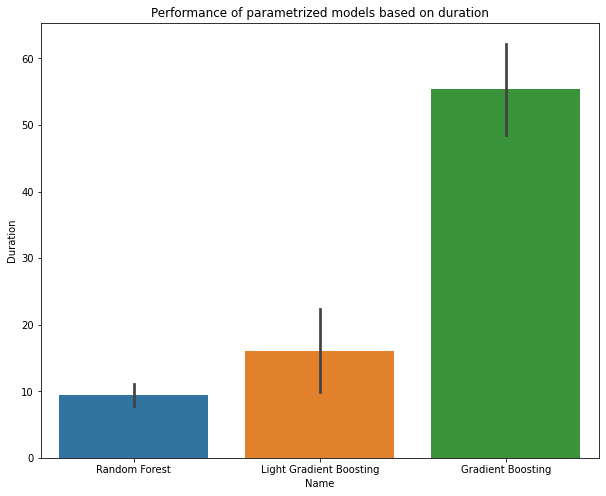

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='Name', y='Duration', data=best_optimized_models.head(10))
plt.title('Performance of parametrized models based on duration')
plt.show()

From the above analysis, can observe that Boosting Algorithms and Random Forest algorithms worked fine with the given dataset.

But Random Forest took lesser time as compared to Boosting algorithms

With Random Forest, could be the case of overfitting on given dataset and may not work fine with the new data, so we cna try Voting Classifier as well with top 10 models and top 5 mode

Further can observe those models which performed fine without scaling and stratified flag set during train test split

In [ ]:
best_optimized_models_basic=best_optimized_models[(best_optimized_models['Stratified sampling']==0) & (best_optimized_models['Scaling']==0) & (best_optimized_models['Outlier removed']==0)]

In [ ]:
best_optimized_models_basic.reset_index(drop=True, inplace=True)
best_optimized_models_basic.head(10)

,Name,Model,Train accuracy,Test accuracy,Recall,Precision,F1Score,Duration,Outlier removed,Stratified sampling,Scaling


In [ ]:
#plt.figure(figsize=(10,8))
#sns.barplot(x='Name', y='Duration', data=best_optimized_models_basic)
#plt.title('Performance of parametrized(no-preprocessing) models based on duration')
#plt.show()

In [ ]:
best_optimized_models_basic.to_csv('Best_Optimized_basic_Param_model_info.csv')

There are only 2 models which performed fine without preprocessing the data and Random Forest seems to have taken much less time, but it can cause problem for overfitting when working on any unseen data.

So, can include both the models in Voting Classifier

**Voting Classifier**

In [ ]:
param_voting_model=[]
param_voting_testacc=[]
param_voting_trainacc=[]
param_voting_recall=[]
param_voting_precision=[]

In [ ]:
def apply_param_voting_classifier(X,y,stratified):
  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0)
  
  voting_clf = VotingClassifier(estimators=[('m1', best_optimized_models.iloc[0,1]), 
                                          ('m2', best_optimized_models.iloc[1,1]), 
                                          ('m3', best_optimized_models.iloc[2,1]), 
                                          ('m4', best_optimized_models.iloc[3,1]), 
                                          ('m5', best_optimized_models.iloc[4,1]),
                                          ('m6', best_optimized_models.iloc[5,1]),
                                          ('m7', best_optimized_models.iloc[6,1]),
                                          ('m8', best_optimized_models.iloc[7,1])
                                          ]
                              , voting='hard')
  voting_clf.fit(X_tr, y_tr)
  skfold = StratifiedKFold(n_splits=5)
  voting_cross_scores = cross_val_score(voting_clf, X_tr, y_tr, cv=skfold, scoring="accuracy")
  y_pred_train=voting_clf.predict(X_tr)
  y_pred_test=voting_clf.predict(X_ts)

  print("Train Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  print("\n\nTest Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  param_voting_model.append(voting_clf)
  param_voting_testacc.append(metrics.accuracy_score(y_ts, y_pred_test))
  param_voting_trainacc.append(metrics.accuracy_score(y_tr, y_pred_train))
  param_voting_recall.append(metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  param_voting_precision.append(metrics.precision_score(y_ts, y_pred_test, average='weighted'))


In [ ]:
apply_param_voting_classifier(X_train, y_train, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   11.9s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  95 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   17.8s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   37.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   52.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    6.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   27.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.7min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    6.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    8.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   32.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   48.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   39.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.7s finished


Train Data Details:
Accuracy :  0.9898648648648649
Recall :  0.9898648648648649
Precison :  0.9900268013606844
F1 score :  0.9898292940969246
Confusion Matix :  [[ 88   0   0]
 [  0 107   0]
 [  1   2  98]]


Test Data Details:
Accuracy :  0.7066666666666667
Recall :  0.7066666666666667
Precison :  0.7211738070358759
F1 score :  0.7065249025505744
Confusion Matix :  [[22  0  7]
 [ 0 19  3]
 [ 2 10 12]]


In [ ]:
apply_param_voting_classifier(X_train, y_train, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   38.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   59.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   27.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    8.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   14.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   29.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.7min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   41.6s finished


Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 93   0   0]
 [  0 103   0]
 [  0   0 100]]


Test Data Details:
Accuracy :  0.72
Recall :  0.72
Precison :  0.7253086419753085
F1 score :  0.7219282051282052
Confusion Matix :  [[19  0  5]
 [ 1 19  6]
 [ 4  5 16]]


In [ ]:
apply_param_voting_classifier(X_train_noout1, y_train_noout1, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  59 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   18.1s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    5.8s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   27.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   11.0s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   58.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   31.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   42.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 95   0   0]
 [  0 107   0]
 [  0   0  90]]


Test Data Details:
Accuracy :  0.6891891891891891
Recall :  0.6891891891891891
Precison :  0.7025394960177568
F1 score :  0.6822216304974926
Confusion Matix :  [[17  0  2]
 [ 1 16  4]
 [ 5 11 18]]


In [ ]:
apply_param_voting_classifier(X_train_noout1, y_train_noout1, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   43.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    5.9s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   35.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   15.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    9.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   47.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.2s finished


Train Data Details:
Accuracy :  0.9246575342465754
Recall :  0.9246575342465754
Precison :  0.9244359766573509
F1 score :  0.9244358120699804
Confusion Matix :  [[88  0  3]
 [ 1 95  6]
 [ 3  9 87]]


Test Data Details:
Accuracy :  0.6756756756756757
Recall :  0.6756756756756757
Precison :  0.6855914355914355
F1 score :  0.678170693776876
Confusion Matix :  [[18  0  5]
 [ 1 17  8]
 [ 5  5 15]]


In [ ]:
apply_param_voting_classifier(X_train_noout2, y_train_noout2, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   39.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    9.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   41.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  95 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   33.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   56.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   55.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   42.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 84   0   0]
 [  0  99   0]
 [  0   0 104]]


Test Data Details:
Accuracy :  0.8055555555555556
Recall :  0.8055555555555556
Precison :  0.8088636363636363
F1 score :  0.8065103501150014
Confusion Matix :  [[22  0  5]
 [ 1 21  2]
 [ 2  4 15]]


In [ ]:
apply_param_voting_classifier(X_train_noout2, y_train_noout2, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   10.3s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   46.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  71 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.7min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   52.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   36.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   37.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.3s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   58.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.3s finished


Train Data Details:
Accuracy :  0.9477351916376306
Recall :  0.9477351916376306
Precison :  0.948013012594093
F1 score :  0.9473865654044541
Confusion Matix :  [[88  0  1]
 [ 1 94  3]
 [ 4  6 90]]


Test Data Details:
Accuracy :  0.7916666666666666
Recall :  0.7916666666666666
Precison :  0.790286680911681
F1 score :  0.790766306522609
Confusion Matix :  [[19  0  3]
 [ 0 21  4]
 [ 3  5 17]]


In [ ]:
apply_param_voting_classifier(X_train_noout3, y_train_noout3, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   43.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   35.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   31.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   58.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   43.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   52.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  59 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 88   0   0]
 [  0 106   0]
 [  0   0 102]]


Test Data Details:
Accuracy :  0.7567567567567568
Recall :  0.7567567567567568
Precison :  0.763063063063063
F1 score :  0.7593432630917331
Confusion Matix :  [[24  0  5]
 [ 0 17  5]
 [ 4  4 15]]


In [ ]:
apply_param_voting_classifier(X_train_noout3, y_train_noout3, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   17.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   55.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   11.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   56.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.5min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   22.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   46.5s finished


Train Data Details:
Accuracy :  0.972972972972973
Recall :  0.972972972972973
Precison :  0.9742398648648649
F1 score :  0.9727350470771523
Confusion Matix :  [[ 94   0   0]
 [  0 102   0]
 [  2   6  92]]


Test Data Details:
Accuracy :  0.7027027027027027
Recall :  0.7027027027027027
Precison :  0.7051767151767152
F1 score :  0.7037625861155273
Confusion Matix :  [[18  0  5]
 [ 1 19  6]
 [ 4  6 15]]


In [ ]:
stacking_model_df=pd.DataFrame(zip(param_voting_model,param_voting_trainacc,param_voting_testacc,param_voting_recall,param_voting_precision), 
                               columns=['Model','Train accuracy','Test accuracy','Recall','Precision'])

In [ ]:
stacking_model_df.to_csv('stacking_model.csv')

In [ ]:
stacking_model_df=pd.read_csv('stacking_model.csv')

In [ ]:
stacking_model_df.sort_values(by='Test accuracy', ascending=False).head(10)

,Unnamed: 0,Model,Train accuracy,Test accuracy,Recall,Precision
4,4,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.805556,0.805556,0.808864
5,5,"VotingClassifier(estimators=[('m1',\n ...",0.947735,0.791667,0.791667,0.790287
6,6,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.756757,0.756757,0.763063
1,1,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.720000,0.720000,0.725309
0,0,"VotingClassifier(estimators=[('m1',\n ...",0.989865,0.706667,0.706667,0.721174
7,7,"VotingClassifier(estimators=[('m1',\n ...",0.972973,0.702703,0.702703,0.705177
2,2,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.689189,0.689189,0.702539
3,3,"VotingClassifier(estimators=[('m1',\n ...",0.924658,0.675676,0.675676,0.685591


Voting Classifier has less accuracies as compared to individual models, so individual model may have overfit and Voting Classifier may give actual accuracy values.

But not always, Voting Classifier may give best values, so can try with Stacking Classifier with best indivudal models if it performs better

**Stacking of best models**

In [ ]:
def apply_param_stacking_classifier(X,y, stratified):
  if (stratified):
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0, stratify=y, shuffle=True)
  else:
    X_tr, X_ts, y_tr, y_ts = train_test_split(X, y, test_size = .20, random_state = 0)

  stacking_clf=StackingClassifier(estimators=[('m1', best_optimized_models.iloc[0,1]), 
                                          ('m2', best_optimized_models.iloc[1,1]), 
                                          ('m3', best_optimized_models.iloc[2,1]), 
                                          ('m4', best_optimized_models.iloc[3,1]), 
                                          ('m5', best_optimized_models.iloc[4,1]),
                                          ('m6', best_optimized_models.iloc[5,1]),
                                          ('m7', best_optimized_models.iloc[6,1]),
                                          ('m8', best_optimized_models.iloc[7,1])])
  stacking_clf.fit(X_tr, y_tr)
  y_pred_train=stacking_clf.predict(X_tr)
  y_pred_test=stacking_clf.predict(X_ts)

  print("Train Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_tr, y_pred_train))
  print ("Recall : ",metrics.recall_score(y_tr, y_pred_train, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_tr, y_pred_train, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_tr, y_pred_train, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_tr, y_pred_train))


  print("\n\nTest Data Details:")
  print ("Accuracy : ",metrics.accuracy_score(y_ts, y_pred_test))
  print ("Recall : ",metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  print ("Precison : ",metrics.precision_score(y_ts, y_pred_test, average='weighted'))
  print ("F1 score : ",metrics.f1_score(y_ts, y_pred_test, average='weighted'))
  print ("Confusion Matix : ",metrics.confusion_matrix(y_ts, y_pred_test))

  param_voting_model.append(stacking_clf)
  param_voting_testacc.append(metrics.accuracy_score(y_ts, y_pred_test))
  param_voting_trainacc.append(metrics.accuracy_score(y_tr, y_pred_train))
  param_voting_recall.append(metrics.recall_score(y_ts, y_pred_test, average='weighted'))
  param_voting_precision.append(metrics.precision_score(y_ts, y_pred_test, average='weighted'))

In [ ]:
apply_param_stacking_classifier(X_train, y_train, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   14.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   16.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   38.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   30.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   55.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   35.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   54.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   57.7s finished


Train Data Details:
Accuracy :  0.9797297297297297
Recall :  0.9797297297297297
Precison :  0.9797297297297297
F1 score :  0.9797297297297297
Confusion Matix :  [[ 85   0   3]
 [  0 107   0]
 [  3   0  98]]


Test Data Details:
Accuracy :  0.6533333333333333
Recall :  0.6533333333333333
Precison :  0.6817883597883598
F1 score :  0.6543699079631853
Confusion Matix :  [[17  0 12]
 [ 1 19  2]
 [ 2  9 13]]


In [ ]:
apply_param_stacking_classifier(X_train, y_train, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   14.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   48.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    9.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   37.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   21.3s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   21.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   30.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   55.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   41.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  67 tasks      | elapsed:   32.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   47.2s finished


Train Data Details:
Accuracy :  0.9797297297297297
Recall :  0.9797297297297297
Precison :  0.9796994272119429
F1 score :  0.9796975630906765
Confusion Matix :  [[ 93   0   0]
 [  0 100   3]
 [  1   2  97]]


Test Data Details:
Accuracy :  0.76
Recall :  0.76
Precison :  0.7675224292615597
F1 score :  0.7624718319282752
Confusion Matix :  [[19  0  5]
 [ 1 20  5]
 [ 3  4 18]]


In [ ]:
apply_param_stacking_classifier(X_train_noout1, y_train_noout1, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.6min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.8s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   10.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    9.3s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   35.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   29.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   50.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.5min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   56.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   42.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   54.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   35.2s finished


Train Data Details:
Accuracy :  1.0
Recall :  1.0
Precison :  1.0
F1 score :  1.0
Confusion Matix :  [[ 95   0   0]
 [  0 107   0]
 [  0   0  90]]


Test Data Details:
Accuracy :  0.6621621621621622
Recall :  0.6621621621621622
Precison :  0.6728848413631023
F1 score :  0.6545538765366351
Confusion Matix :  [[17  0  2]
 [ 1 15  5]
 [ 5 12 17]]


In [ ]:
apply_param_stacking_classifier(X_train_noout1, y_train_noout1, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    6.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   48.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   30.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   21.6s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   21.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   47.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   37.4s finished


Train Data Details:
Accuracy :  0.9726027397260274
Recall :  0.9726027397260274
Precison :  0.9737881196999346
F1 score :  0.9723293253342098
Confusion Matix :  [[ 91   0   0]
 [  0 102   0]
 [  5   3  91]]


Test Data Details:
Accuracy :  0.7027027027027027
Recall :  0.7027027027027027
Precison :  0.7095067095067095
F1 score :  0.7032786087407937
Confusion Matix :  [[19  0  4]
 [ 1 18  7]
 [ 6  4 15]]


In [ ]:
apply_param_stacking_classifier(X_train_noout2, y_train_noout2, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    6.4s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   48.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   10.8s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    8.7s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    6.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   43.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   35.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   53.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   52.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   47.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.5s finished


Train Data Details:
Accuracy :  0.9721254355400697
Recall :  0.9721254355400697
Precison :  0.972338593974175
F1 score :  0.9720130933795531
Confusion Matix :  [[83  0  1]
 [ 0 98  1]
 [ 2  4 98]]


Test Data Details:
Accuracy :  0.8055555555555556
Recall :  0.8055555555555556
Precison :  0.8041666666666667
F1 score :  0.8046291687406671
Confusion Matix :  [[24  0  3]
 [ 1 20  3]
 [ 2  5 14]]


In [ ]:
apply_param_stacking_classifier(X_train_noout2, y_train_noout2, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   10.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   37.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   43.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   36.3s finished


Train Data Details:
Accuracy :  0.9024390243902439
Recall :  0.9024390243902439
Precison :  0.902234674776792
F1 score :  0.9023195363023676
Confusion Matix :  [[86  0  3]
 [ 0 87 11]
 [ 4 10 86]]


Test Data Details:
Accuracy :  0.8472222222222222
Recall :  0.8472222222222222
Precison :  0.8470869408369409
F1 score :  0.8450979080244435
Confusion Matix :  [[20  0  2]
 [ 0 23  2]
 [ 2  5 18]]


In [ ]:
apply_param_stacking_classifier(X_train_noout3, y_train_noout3, 0)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   38.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    8.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    8.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   29.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   59.8s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   57.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   19.6s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:  1.1min remaining:    2.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.3min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   28.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   28.2s finished


Train Data Details:
Accuracy :  0.9324324324324325
Recall :  0.9324324324324325
Precison :  0.9331057495960098
F1 score :  0.9323605902553271
Confusion Matix :  [[ 77   0  11]
 [  1 104   1]
 [  5   2  95]]


Test Data Details:
Accuracy :  0.7837837837837838
Recall :  0.7837837837837838
Precison :  0.8061602982292637
F1 score :  0.7896797896797897
Confusion Matix :  [[23  0  6]
 [ 0 17  5]
 [ 2  3 18]]


In [ ]:
apply_param_stacking_classifier(X_train_noout3, y_train_noout3, 1)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    7.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   31.3s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.5s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:   10.5s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.4s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.1s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   44.9s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   41.0s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:   45.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   45.2s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   34.1s finished


Train Data Details:
Accuracy :  0.9425675675675675
Recall :  0.9425675675675675
Precison :  0.9444283115257256
F1 score :  0.9426002089045569
Confusion Matix :  [[93  0  1]
 [ 0 91 11]
 [ 2  3 95]]


Test Data Details:
Accuracy :  0.7027027027027027
Recall :  0.7027027027027027
Precison :  0.7180208158469028
F1 score :  0.7071528857243142
Confusion Matix :  [[17  0  6]
 [ 1 18  7]
 [ 3  5 17]]


In [ ]:
final_stacking_model_df=pd.DataFrame(zip(param_voting_model,param_voting_trainacc,param_voting_testacc,param_voting_recall,param_voting_precision), columns=['Model','Train accuracy','Test accuracy','Recall','Precision'])
final_stacking_model_df.to_csv('final_stacking_model.csv')
final_stacking_model_df.sort_values(by='Test accuracy', ascending=False, inplace=True)
final_stacking_model_df.reset_index(drop=True, inplace=True)
final_stacking_model_df.head(10)

,Model,Train accuracy,Test accuracy,Recall,Precision
0,"StackingClassifier(cv=None,\n ...",0.902439,0.847222,0.847222,0.847087
1,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.805556,0.805556,0.808864
2,"StackingClassifier(cv=None,\n ...",0.972125,0.805556,0.805556,0.804167
3,"VotingClassifier(estimators=[('m1',\n ...",0.947735,0.791667,0.791667,0.790287
4,"StackingClassifier(cv=None,\n ...",0.932432,0.783784,0.783784,0.806160
5,"StackingClassifier(cv=None,\n ...",0.979730,0.760000,0.760000,0.767522
6,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.756757,0.756757,0.763063
7,"VotingClassifier(estimators=[('m1',\n ...",1.000000,0.720000,0.720000,0.725309
8,"VotingClassifier(estimators=[('m1',\n ...",0.989865,0.706667,0.706667,0.721174
9,"VotingClassifier(estimators=[('m1',\n ...",0.972973,0.702703,0.702703,0.705177


In [ ]:
final_stacking_model_df.to_csv('final_model.csv')

In [ ]:
final_stacking_model_df=pd.read_csv('final_model.csv').round(2)
final_df=final_stacking_model_df.drop('Unnamed: 0', axis=1).head(10)
final_df.head()

,Model,Train accuracy,Test accuracy,Recall,Precision
0,"StackingClassifier(cv=None,\n ...",0.90,0.85,0.85,0.85
1,"VotingClassifier(estimators=[('m1',\n ...",1.00,0.81,0.81,0.81
2,"StackingClassifier(cv=None,\n ...",0.97,0.81,0.81,0.80
3,"VotingClassifier(estimators=[('m1',\n ...",0.95,0.79,0.79,0.79
4,"StackingClassifier(cv=None,\n ...",0.93,0.78,0.78,0.81


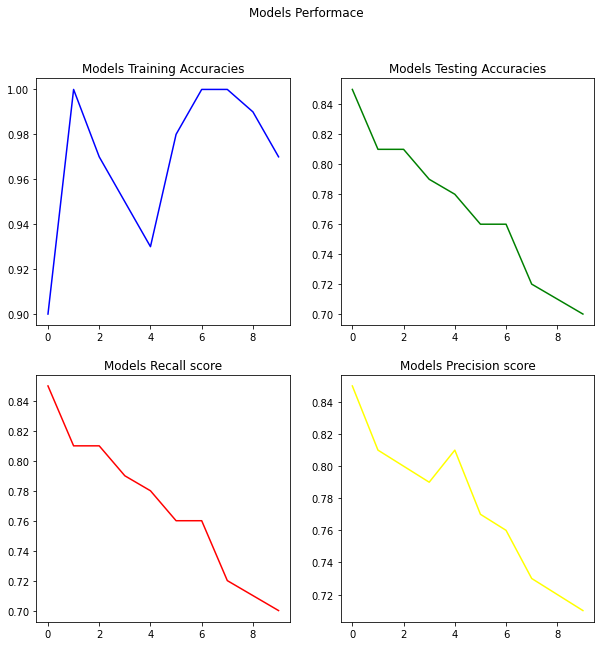

In [ ]:
tmp=final_df.reset_index()
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(tmp['index'], tmp['Train accuracy'], color='blue')
axs[0, 0].set_title('Models Training Accuracies')
axs[0, 1].plot(tmp['index'], tmp['Test accuracy'], color='green')
axs[0, 1].set_title('Models Testing Accuracies')
axs[1, 0].plot(tmp['index'], tmp['Recall'], color='red')
axs[1, 0].set_title('Models Recall score')
axs[1, 1].plot(tmp['index'], tmp['Precision'], color='yellow')
axs[1, 1].set_title('Models Precision score')
plt.suptitle('Models Performace')
fig.set_figheight(10)
fig.set_figwidth(10)
plt.show()

It seems the model 0  ie Stacking Classifer has performed quite good as test/train accuracies along with recall and Precison score is quite high

Stacking Classifier perfomed better in terms of accuracies,recall and Precison values, could be the case as in Stacking, model automatically determine the type of associations between models unlike Voting where we need to provide type - hard/soft

## **10. Conclusion - Final Model**

In [ ]:
final_model=final_stacking_model_df.iloc[0,1]

In [ ]:
final_model

"StackingClassifier(cv=None,\n                   estimators=[('m1',\n                                RandomizedSearchCV(cv=10, error_score=nan,\n                                                   estimator=RandomForestClassifier(bootstrap=True,\n                                                                                    ccp_alpha=0.0,\n                                                                                    class_weight=None,\n                                                                                    criterion='gini',\n                                                                                    max_depth=None,\n                                                                                    max_features='auto',\n                                                                                    max_leaf_nodes=None,\n                                                                                    max_samples=None,\n                               

In [ ]:
trainacc=final_stacking_model_df.iloc[0,2]
testacc=final_stacking_model_df.iloc[0,3]
recall=final_stacking_model_df.iloc[0,3]
precision=final_stacking_model_df.iloc[0,4]

In [ ]:
pd.DataFrame([[final_stacking_model_df.iloc[0,2],final_stacking_model_df.iloc[0,3],final_stacking_model_df.iloc[0,4],final_stacking_model_df.iloc[0,5]]],columns=['Train Acccuracy','Test Accuracy','Recall Score','Precision Score'])

,Train Acccuracy,Test Accuracy,Recall Score,Precision Score
0,0.9,0.85,0.85,0.85


**Loading the model for future use**

In [ ]:
import pickle

In [ ]:
filename = 'finalized_model.pkl'
pickle.dump(final_model, open(filename, 'wb'))

**Summary**

- Data has been analyzed using various statistical methods and using various libraries related to the outliers like PyOD.
- Data has been analyzed using various libararies created for exploratory analysis like Pandas Profiling and AutoViz.
- Later using PyCaret, analyzed the best performing model on the dataset which gave some indications on the best models can be used.
- Finally model are trained individually and few models gave high accuracy values, but preferred to use the aggregated techiniques like Voting,Bagging and Stacking to avoid any overfitting.
- Stacking applied on the best indivual models and from the final result, best model is selected based on train/test accuracy along with recall and precision socres.
- All the models are trained on the various types of data - with outliers,without outliers, scaled and non-scaled, so to get the best possible model.